In [1]:
import sys, os, glob, time
import h5py
import corner
from copy import copy as copy
from collections import defaultdict
import numpy as np
import scipy as sp
import numpy.random as rnd
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d
from scipy.special import factorial, gamma, genlaguerre
from multiprocessing import Pool, Process, Manager
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from matplotlib import cm, lines, patches, ticker
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
#plt.rcParams.update({"text.usetex": True})

from parameters import *
from parameters_data import get_parameters as get_parameters_data

from modules.density_extraction import density_extraction, calc_ensemble_dists, calc_dists
from diffraction_simulation import diffraction_calculation

from modules.NO2 import *
from modules.plot_functions import *

input_data_parameters = get_parameters()
data_parameters = copy(input_data_parameters)
if "ADM_kwargs" in data_parameters:
    del data_parameters["ADM_kwargs"]

## Setup Density Extraction Environment, Calculations, Dataset (simulated)

In [2]:
use_2dof = False
use_mol_ensemble = True

#####  Setup ensemble/density generators and log prior  #####
if use_mol_ensemble:
    input_ensemble_generator = molecule_ensemble_generator
else:
    input_ensemble_generator = single_molecule_generator

input_density_generator_gauss = molecule_ensemble_generator
input_density_generator_delta = single_molecule_generator
    
if "density_model" in data_parameters:
    if data_parameters["density_model"] == "PDF":
        input_density_generator = molecule_ensemble_generator
        if use_2dof or data_parameters["experiment"] == "2dof":
            input_log_prior = log_prior_2dof_gauss
        elif data_parameters["experiment"] == "3dof":
            input_log_prior = log_prior_3dof_gauss
        else:
            raise ValueError("Cannot handle experiment {}".format(
                    data_parameters["experiment"]))

    elif data_parameters["density_model"] == "delta":
        input_density_generator = single_molecule_generator
        if use_2dof or data_parameters["experiment"] == "2dof":
            input_log_prior = log_prior_2dof_delta
        elif data_parameters["experiment"] == "3dof":
            input_log_prior = log_prior_3dof_delta
        else:
            raise ValueError("Cannot handle experiment {}".format(
                    data_parameters["experiment"]))

    else:
        raise ValueError("Cannot handle density model {}".format(
                data_parameters["density_model"]))
else:
    raise ValueError("Must provide default density generator")

INFO: Making output folder
INFO: Setup Multiprocessing
INFO: Importing ground state geometry
	 O: 0.000000 1.098900 0.465300
	 N: 0.000000 0.000000 0.000000
	 O: 0.000000 -1.098900 0.465300
INFO: Setting up moment of inertia calculation
INFO: Rotating initial state molecular frame
INFO: Getting data
INFO: Getting scattering amplitudes
INFO: Simulate data
INFO: /cds/group/ued/scratch/khegazy/TeDDE/saved_simulations/NO2/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-12.0_error-ston_scale-100.h5 exist, now loading data
INFO: Pruning data


/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self.data_params["dom"] is None or "ata" in self.data_params["dom"]:


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 1.425741245865029e-13 at index 25 ... Passed
L = 4 	 Largest std = 1.198358

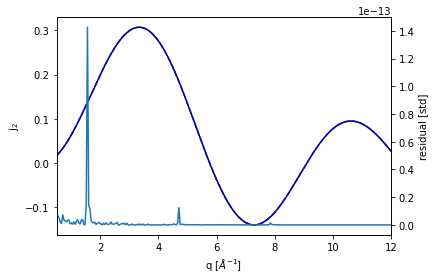

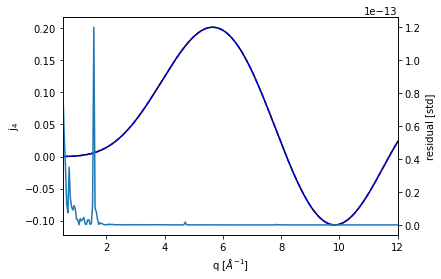

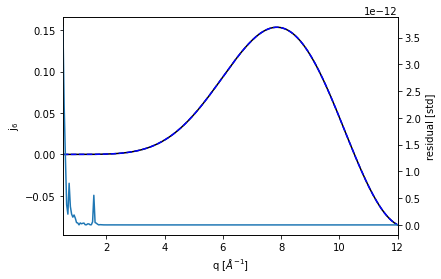

In [4]:
extraction = density_extraction(data_parameters,
      get_molecule_init_geo,
      get_scattering_amplitudes,
      log_prior=input_log_prior,
      density_generator=input_density_generator,
      ensemble_generator=input_ensemble_generator,
      get_ADMs=get_ADMs)


molecule = extraction.setup_calculations()

## Setup and Run the MCMC Sampler

In [ ]:
walkers_init = input_initialize_walkers(
    data_parameters, extraction.atom_positions)

extraction.run_mcmc(walkers_init, data_parameters["run_limit"])

## Example of Gathering MCMC Results

In [3]:
extraction = density_extraction(data_parameters,
    get_molecule_init_geo,
    get_scattering_amplitudes,
    log_prior=input_log_prior,
    density_generator=input_density_generator,
    ensemble_generator=input_ensemble_generator,
    get_ADMs=None,
    results_only=True)

samples = extraction.get_mcmc_results()

def get_mcmc_results_mode(data_params):
    
    if data_params["density_model"] == "PDF":
        density_generator = input_density_generator_gauss
    elif data_params["density_model"] == "delta":
        density_generator = input_density_generator_delta
    else:
        raise RuntimeError("Can't get density generator for given density model.")
            
    # Import MCMC samples
    ex = density_extraction(data_params,
        get_molecule_init_geo,
        get_scattering_amplitudes,
        log_prior=input_log_prior,
        density_generator=density_generator,
        ensemble_generator=None,
        get_ADMs=None,
        results_only=True)
    results = ex.get_mcmc_results(plot=False)
    
    # Import mode search results
    fName = ex.get_fileName()
    find = fName.rfind("/")
    fName = fName[:find+1] + "mode_search_" + fName[find+1:]
    fileName = os.path.join(data_params["output_dir"], fName+".h5")
    print("mode name", fileName)
    if os.path.exists(fileName):
        with h5py.File(fileName, "r") as h5:
            modes = h5["ths_mean"][:]
    else:
        print("WARNING: Can't find search results at {}".format(fileName))
        modes = np.nan*np.ones(results.shape[-1])
    del ex
    
    return results, modes

INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Setting up MCMC
INFO: Autocorrelation Times [84.07975656 90.87676904 81.24473715 92.01639711 84.39974627 96.33703996]


# Plotting Results

In [4]:
N = 10000
#####  CNO  #####
if "CNO" in data_parameters["molecule"]:
    ranges = np.array([
        [1.72, 1.89],
        [1.06, 1.18],
        [1.63, 1.77]])
    ranges_opt = np.array([
        [1.8, 1.8055],
        [1.116, 1.121],
        [1.6935, 1.6975]])
    labels = ["CN $[\AA]$", "NO $[\AA]$", "CNO angle [rad]"]
    label_size=15
    tick_size=12

#####  NO2  #####
if "NO2" in data_parameters["molecule"]:
    if len(data_parameters["sim_thetas"]) > 4:
        cn_delta = np.array(data_parameters["sim_thetas"])[np.array([0,2,4])]
    else:
        cn_delta = np.array(data_parameters["sim_thetas"]) 
    ranges_delta = np.array([[x-0.0075, x+0.0075] for x in cn_delta])
    labels_delta = [r"$\langle $NO$^{(1)} \rangle$ $[\AA]$", r"$\langle $NO$^{(2)} \rangle$ $[\AA]$", r"$\langle \angle $ONO$\rangle$ [rad]"]
    labels_sig = [r"$\sigma ($NO$^{(1)} )$ $[\AA]$", r"$\sigma ($NO$^{(2)})$ $[\AA]$", r"$\sigma (\angle $ONO$)$ [rad]"]
    if len(data_parameters["sim_thetas"]) > 4:
        cn_gauss = data_parameters["sim_thetas"][:-1]
        ranges_gauss = []
        labels_gauss = []
        for ic, c in enumerate(cn_gauss):
            if ic%2 == 0:
                ranges_gauss.append(ranges_delta[ic//2])
                labels_gauss.append(labels_delta[ic//2])
            else:
                ranges_gauss.append(np.array([0, 0.08]))
                labels_gauss.append(labels_sig[ic//2])
    ranges_gauss = np.array(ranges_gauss)
    label_size=14
    tick_size=13
    ranges_3d = []
    for i in range(3):
        shift = 0.1
        ranges_3d.append(np.array([cn_gauss[i*2]-shift, cn_gauss[i*2]+shift]))
        
    
    cn2 = [1.19335, np.arctan2(1.0989, 0.4653)*2]
    ranges2 = [[x-0.004, x+0.004] for x in cn2]
    labels2 = [r"NO $[\AA]$", r"$\angle$ONO [rad]"]

In [5]:
def plot3d(samples, ranges, ax=None, ax_lims=None, scat_inds=None,
           fileName="density3d.png", alpha=0.99, labels=None, label_size=10, tick_size=None):
    ax.view_init(elev=28., azim=37)
    if labels is None:
        labels = ["d1", "d2", "d3"]

    xm, xM = ranges[0]
    ym, yM = ranges[1]
    zm, zM = ranges[2]
    if ax_lims is not None:
        xm, xM = ax_lims[0]
        ym, yM = ax_lims[1]
        zm, zM = ax_lims[2]
        if isinstance(xm, list):
            ym, yM = xm
            xm, xM = xM
    #zm, zM = 1.8, 2.4
    Nhbins = 50
    Nlevels = 7

    size=0.005
    if ax is None:
        fig = plt.figure(figsize=(10,10))
        ax = fig.gca(projection='3d')
    X,Y,Z = samples[:,0], samples[:,1], samples[:,2] #(angles[:] - np.mean(angles[:]))*np.sqrt(36) + angles[:]

    print(np.mean(X), np.mean(Y), np.mean(Z))
    xdt = (xM-xm)/Nhbins
    xEdges = np.linspace(xm, xM+xdt, num=Nhbins+1) - xdt/2.
    x = np.linspace(xm, xM, num=Nhbins)
    ydt = (yM-ym)/Nhbins
    yEdges = np.linspace(ym, yM+ydt, Nhbins+1) - ydt/2.
    y = np.linspace(ym, yM, Nhbins)
    zdt = (zM-zm)/Nhbins
    zEdges = np.linspace(zm, zM+zdt, Nhbins+1) - zdt/2.
    z = np.linspace(zm, zM, Nhbins)

    if scat_inds is not None:
        print("SSS", size)
        ax.scatter(X[scat_inds], Y[scat_inds], Z[scat_inds], color='gray', s=size, alpha=alpha)
    else:
        print("SSS", X.shape, Y.shape, Z.shape)
        ax.scatter(X,Y,Z, color='gray', s=size, alpha=alpha)

    Zhist,_,_ = np.histogram2d(X,Y, [xEdges, yEdges])
    xp,yp = np.meshgrid(x,y)
    cset = ax.contour(xp, yp, Zhist.transpose(), zdir='z',
        offset=zm, levels=Nlevels, cmap=cm.viridis)

    Xhist,_,_ = np.histogram2d(Y,Z, [yEdges, zEdges])
    yp,zp = np.meshgrid(y,z)
    zp,yp = np.meshgrid(z,y)
    cset = ax.contour(Xhist, yp, zp, zdir='x',
        offset=xm, levels=Nlevels, cmap=cm.viridis)
    
    Yhist,_,_ = np.histogram2d(X,Z, [xEdges, zEdges])
    zp,xp = np.meshgrid(z,x)
    cset = ax.contour(xp, Yhist, zp, zdir='y',
        offset=ym, levels=Nlevels, cmap=cm.viridis)
    #cset = ax.contourf(X, Y, Z, zdir='y', offset=40, cmap=cm.coolwarm)
    

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')

    ax.set_xlabel(labels[0], fontsize=label_size, labelpad=13.5)
    ax.set_xlim([xm+xdt, xM-xdt])
    ax.set_ylabel(labels[1], fontsize=label_size, labelpad=13.5)
    ax.set_ylim([ym+ydt, yM-ydt])
    ax.set_zlabel(labels[2], fontsize=label_size, labelpad=13.5)
    ax.set_zlim([zm+zdt, zM-zdt])
    
    if tick_size is not None:
        ax.tick_params(axis='x', labelsize=tick_size)
        ax.tick_params(axis='y', labelsize=tick_size)
        ax.tick_params(axis='z', labelsize=tick_size)

    if ax is None:
        fig.subplots_adjust(top=0.99)
        fig.subplots_adjust(bottom=0.005)
        fig.subplots_adjust(right=0.99)
        fig.subplots_adjust(left=0.005)
        fig.savefig(fileName)
    
    return ax

In [6]:
def plot_2dRows(samples, samples_single, labels,
        label_size=15, tick_size=13, bins=np.ones(3)*50,
        row_labels=None, row_label_size=15, xticks=None):
    Nrows = len(samples)

    top_pad = 0.025
    bot_pad = 0.065
    vert_pad = 0.03*4/Nrows
    hist_size = 0.0#5
    vert_dim = (1 - (bot_pad + top_pad + Nrows*(vert_pad + hist_size)-vert_pad))/Nrows


    horz_pad = 0.11
    left_pad = 0.115
    right_pad = 0.035
    cbar_pad = 0.01
    cbar_sz = 0.035
    horz_dim = (1 - (left_pad + right_pad + 2*horz_pad))/3

    print(vert_dim, horz_dim)
    fig_ratio = vert_dim/horz_dim
    fig = plt.figure(figsize=(10,10/fig_ratio))


    vert_anch = []
    for v in range(Nrows):
        vert_anch.append(bot_pad + v*(vert_dim + hist_size + vert_pad))

    horz_anch = []
    for h in range(3):
        horz_anch.append(left_pad + h*(horz_dim + horz_pad))

    axs, axs_hists = [], []
    for v in range(Nrows):
        axs.append([])
        axs_hists.append([])
        for h in range(3):
            axs[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], horz_dim, vert_dim)))
            #axs_hists[-1].append(fig.add_axes((horz_anch[h], vert_anch[v]+vert_dim, horz_dim, hist_size)))


    inds = [[1,0], [0,2], [2,1]]


    for h in range(3):
        for v in range(Nrows):
            counts, x, y,image = axs[v][h].hist2d(samples_single[v][:,inds[h][0]], samples_single[v][:,inds[h][1]], bins=(bins[inds[h][0]], bins[inds[h][1]]))
            counts, x, y = np.histogram2d(samples[v][:,inds[h][0]], samples[v][:,inds[h][1]], bins=(bins[inds[h][0]], bins[inds[h][1]]))
            axs[v][h].contour(counts.transpose(), levels=6,
                    extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='lightgray')
            axs[v][h].scatter(cn[inds[h][0]], cn[inds[h][1]], marker='x', color='k')
            #axs_hists[v][h].hist(samples[v][:,inds[h][0]], bins=bins[inds[h][0]])
            #axs_hists[v][h].set_xlim([bins[inds[h][0]][0], bins[inds[h][0]][-1]])
            #if h + v == 2:
            #    axs[v][s*3+h].hist(samples[s][:,-1*v-1], bins=bins[-1*v-1], density=True)
            axs[v][h].set_xlabel(labels[inds[h][0]], fontsize=label_size)
            axs[v][h].set_ylabel(labels[inds[h][1]], fontsize=label_size)
            axs[v][h].tick_params(axis='x', labelsize=tick_size)
            axs[v][h].tick_params(axis='y', labelsize=tick_size)
            
            if v > 0:
                axs[v][h].xaxis.set_visible(False)
            #axs_hists[v][h].xaxis.set_visible(False)
            #axs_hists[v][h].yaxis.set_visible(False)
            else:
                if xticks is not None:
                    if xticks[h] is not None:
                        axs[v][h].set_xticks(xticks[h])
            
            if h == 2 and row_labels is not None:
                axs[v][h].text(1.1, 0.5, row_labels[v], fontsize=row_label_size,
                        transform=axs[v][h].transAxes, rotation='vertical',
                        horizontalalignment="center", verticalalignment="center") 

    return fig

In [7]:
def column_compare_dists(samples, ranges, labels, xticks=None, cn=cn_gauss):
    Ns = len(samples)
    Ncrn = samples[0].shape[-1]
    do_3d = 1
    if Ncrn == 2:
        do_3d = 0
    top_pad, bot_pad = 0.04, 0.08
    vert_pad, dns_vert = 0.005, 0.27*2/Ns
    vert_dim = (1 - (bot_pad + top_pad + (8+(Ns-1)+Ncrn)*vert_pad + do_3d*Ns*dns_vert))/3

    left_pad, right_pad, horz_pad = 0.075, 0.04, 0.015
    cbar_pad, cbar_sz = 0.01, 0.27
    dns_horz, dns_horz_pad = 0.27, 0.045
    horz_dim = (1 - (left_pad + right_pad + 3*horz_pad))/3

    dns_labels = ["$P_{opt} ( \mathbf{r}^{(mf)} )$ from a single molecule", "Input Ensemble $|\psi(\mathbf{r}^{(mf)})|^2$", "$P_{opt} ( \mathbf{r}^{(mf)} )$ from an ensemble"]
    fig_ratio = vert_dim/horz_dim
    sz=6
    fig = plt.figure(figsize=(sz,sz/fig_ratio))

    axs = []
    vert = bot_pad
    for v in range(Ncrn+Ns):
        if v < Ncrn:
            axs.append([])
            horz = left_pad
            for h in range(Ncrn):
                axs[-1].append(fig.add_axes((horz, vert, horz_dim, vert_dim)))
                horz += horz_dim + horz_pad
            vert += vert_dim + vert_pad
        elif do_3d:
            if v == Ncrn and Ns > 1:
                print("WWWWWWTTTTTTTTTFFFFFFFF")
                vert += 8*vert_pad
            axs.append(fig.add_axes(
                (0.75*left_pad, vert, 1-(left_pad+right_pad), dns_vert), projection='3d'))
            vert += dns_vert + vert_pad

    bins = []
    for ir in ranges:
        bins.append(np.linspace(ir[0], ir[1], 51))
    for v in range(Ncrn+Ns):
        if v < Ncrn:
            for h in range(Ncrn):
                if h + v == Ncrn-1:
                    print("BINS", bins[-1*v-1][0], bins[-1*v-1][-1])
                    n, _, _ = axs[v][h].hist(samples[0][:,-1*v-1], bins=bins[-1*v-1], density=True)
                    if Ns > 1:
                        nn, _ = np.histogram(samples[1][:,-1*v-1], bins=bins[-1*v-1], density=True)
                        axs[v][h].plot((bins[-1*v-1][1:]+bins[-1*v-1][:-1])/2, nn, '--k')
                    axs[v][h].plot([cn[-1*v-1], cn[-1*v-1]], [0,1.25*np.amax(n)], '-k')
                    axs[v][h].set_xlim([bins[-1*v-1][0], bins[-1*v-1][-1]])
                    axs[v][h].set_ylim([0, 1.1*np.amax(n)])
                elif h + v > Ncrn-1:
                    axs[v][h].xaxis.set_visible(False)
                    axs[v][h].yaxis.set_visible(False)
                    axs[v][h].set_visible(False)
                else:
                    counts, x, y,image = axs[v][h].hist2d(samples[0][:,h], samples[0][:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                    if Ns > 1:
                        counts, x, y = np.histogram2d(samples[1][:,h], samples[1][:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                        axs[v][h].contour(counts.transpose(), levels=5,
                                extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='w')
                    axs[v][h].scatter(cn[h], cn[-1*v-1], marker='x', color='k')
                            #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)

                if v > 0:
                    axs[v][h].xaxis.set_visible(False)
                else:
                    axs[v][h].set_xlabel(labels[h], fontsize=label_size)
                    axs[v][h].tick_params(axis='x', labelsize=tick_size)
                    if xticks is not None:
                        if xticks[h] is not None:
                            axs[v][h].set_xticks(xticks[h])

                if h > 0:
                    axs[v][h].yaxis.set_visible(False)
                elif h < Ncrn-1 and v < Ncrn-1:
                    axs[v][h].set_ylabel(labels[-1*v-1], fontsize=label_size)
                    axs[v][h].tick_params(axis='y', labelsize=tick_size)
                if v == Ncrn-1 and h == 0:
                    axs[v][h].tick_params(axis='y', labelsize=tick_size)      
        elif do_3d:
            rnd_inds = np.random.permutation(samples[-1-(v-Ncrn)].shape[0])[:100000]
            plot3d(samples[-1-(v-Ncrn)], ranges, scat_inds=rnd_inds, ax=axs[v],
                   labels=labels, label_size=label_size, tick_size=tick_size, alpha=0.2)
    return fig, axs

In [8]:
def plot_2dproj_column(fig, dims, theta_gauss=None, theta_delta=None):   
    vdim, vpSep, VSEP, hdim, hpSep, bp, lp = dims
    
    # Bottom Portion
    vert_anch = []
    extra_v = 0
    for v in range(3):
        vert_anch.append(bp + v*(vdim + vpSep))

    horz_anch = [lp]
    for h in range(2):
        horz_anch.append(horz_anch[-1] + (hdim + hpSep))

    axs0 = []
    for v in range(3):
        axs0.append([])
        for h in range(3):
            axs0[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], hdim, vdim)))

    samples = [theta_gauss]
    if theta_delta is not None:
        samples.append(theta_delta)
    if theta_gauss is None:
        samples = [theta_delta]
    if theta_gauss is None and theta_delta is None:
        raise ValueError("Must specify either theta_gauss or theta_delta")
    for s, sr in enumerate(samples):
        if s == 0 and theta_gauss is not None:
            sr = sr[:,np.array([0,2,4])]
        
        if sr is None:
            continue
            
        bins = []
        for ir in ranges_theta:
            bins.append(np.linspace(ir[0], ir[1], 51))
        for h in range(3):
            for v in range(3):
                if h + v == 2:
                    n, x = np.histogram(sr[:,-1*v-1], bins=bins[-1*v-1])
                    n = n/np.amax(n)
                    if s == 0:
                        axs0[v][h].bar((x[1:]+x[:-1])/2., n, width=x[1]-x[0], align='center')
                    else:
                        axs0[v][h].plot((x[1:]+x[:-1])/2., n, '--k')

                    axs0[v][h].plot([cn[-1*v-1], cn[-1*v-1]], [0,1.1], '-k')
                    axs0[v][h].set_xlim([bins[-1*v-1][0], bins[-1*v-1][-1]])
                    axs0[v][h].set_ylim([0, 1.1*np.amax(n)])
                        
                elif h + v > 2:
                    axs0[v][h].xaxis.set_visible(False)
                    axs0[v][h].yaxis.set_visible(False)
                    axs0[v][h].set_visible(False)
                else:
                    if s == 0:
                        counts, x, y,image = axs0[v][h].hist2d(sr[:,h], sr[:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                    else:
                        counts, x, y = np.histogram2d(sr[:,h], sr[:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                        axs0[v][h].contour(counts.transpose(), levels=5,
                                extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='w')
                    axs0[v][h].scatter(cn[h], cn[-1*v-1], marker='x', color='k')
                        #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)

                if v > 0:
                    axs0[v][h].xaxis.set_visible(False)
                else:
                    axs0[v][h].set_xlabel(labels[h], fontsize=label_size)
                    axs0[v][h].tick_params(axis='x', labelsize=tick_size)
                    if s == 0:
                        if h == 0:
                            axs0[v][h].set_xticks([1.349, 1.351])
                        elif h == 1:
                            axs0[v][h].set_xticks([1.049, 1.051])
                        else:
                            axs0[v][h].set_xticks([2.339, 2.341])
                if h > 0 or v == 2:
                    axs0[v][h].yaxis.set_visible(False)
                elif h < 2 and v < 2:
                    axs0[v][h].set_ylabel(labels[-1*v-1], fontsize=label_size)
                    axs0[v][h].tick_params(axis='y', labelsize=tick_size)
                if v == 2 and h == 0:
                    axs0[v][h].tick_params(axis='y', labelsize=tick_size)
    
    # Top Portion
    if theta_gauss is not None:
        vert_anch = []
        extra_v = 0
        for v in range(6):
            vert_anch.append(bp + VSEP + (v+1)*(vdim + vpSep))

        horz_anch = [lp]
        for h in range(2):
            horz_anch.append(horz_anch[-1] + (hdim + hpSep))

        axs1 = []
        for v in range(6):
            axs1.append([])
            for h in range(3):
                axs1[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], hdim, vdim)))

        sr = theta_gauss

        bins = []
        rg_inds = np.array([1,3,5,0,2,4])
        for ir in ranges_gauss:
            bins.append(np.linspace(ir[0], ir[1], 51))
        for h in range(3):
            for v in range(6):
                if h + v == 2:
                    n, _, _ = axs1[v][h].hist(sr[:,rg_inds[h]], bins=bins[rg_inds[h]], density=True)
                    axs1[v][h].plot([cn_gauss[rg_inds[h]], cn_gauss[rg_inds[h]]], [0,1.25*np.amax(n)], '-k')
                    axs1[v][h].set_xlim([bins[rg_inds[h]][0], bins[rg_inds[h]][-1]])
                    axs1[v][h].set_ylim([0, 1.1*np.amax(n)])
                elif h + v < 2:
                    axs1[v][h].xaxis.set_visible(False)
                    axs1[v][h].yaxis.set_visible(False)
                    axs1[v][h].set_visible(False)
                else:
                    if v < 3:
                        vv = 2 - v
                    else: 
                        vv = v
                    counts, x, y,image = axs1[v][h].hist2d(sr[:,rg_inds[h]], sr[:,rg_inds[vv]], bins=(bins[rg_inds[h]], bins[rg_inds[vv]]))
                    axs1[v][h].scatter(cn_gauss[rg_inds[h]], cn_gauss[rg_inds[vv]], marker='x', color='k')
                            #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)

                if v != 5:
                    axs1[v][h].xaxis.set_visible(False)
                else:
                    axs1[v][h].xaxis.tick_top()
                    axs1[v][h].xaxis.set_label_position('top')
                    axs1[v][h].set_xlabel(labels_sig[h], fontsize=label_size)
                    axs1[v][h].tick_params(axis='x', labelsize=tick_size)

                if h < 2 or v == 0:
                    axs1[v][h].yaxis.set_visible(False)
                elif v > 0:
                    if v < 3:
                        vv = 2 - v
                    else: 
                        vv = v
                    axs1[v][h].yaxis.tick_right()
                    axs1[v][h].yaxis.set_label_position('right')
                    if v > 2:
                        lb = labels[v-3]
                    else:
                        lb = labels_sig[vv]
                    axs1[v][h].set_ylabel(lb, fontsize=label_size)
                    axs1[v][h].tick_params(axis='y', labelsize=tick_size)
                if v == 2 and h == 0:
                    axs1[v][h].tick_params(axis='y', labelsize=tick_size)

In [153]:
def corner_column(fig, dims, samples, modes=None, centers=None, 
        ranges_proj=None, ranges_3d=ranges_3d,
        labels_proj=None, labels_3d=labels_delta,
        set_ticks=None, label_size=label_size, tick_size=tick_size,
        do_3d=None, vdims_3d=None):
    vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp = dims
    lw, letters, ltr_c = 2, ['a', 'b', 'c', 'd', 'e', 'f'], 0
    if centers is None:
        centers = [cn_gauss]*len(samples)
    if do_3d is None:
        do_3d = [True,]*len(samples)
    if set_ticks is None:
        set_ticks = [True,]*len(samples)
    if ranges_proj is None:
        ranges_proj = [ranges_gauss,]*len(samples)
    if labels_proj is None:
        labels_proj= [labels_gauss,]*len(samples)
    centers_, do_3d_, set_ticks_ = copy(centers), copy(do_3d), copy(set_ticks)
    ranges_proj_, labels_proj_ = copy(ranges_proj), copy(labels_proj)
    
    all_axs = []
    N_thetas = samples[0].shape[-1]
    samples.reverse()
    if modes is not None:
        modes.reverse()
    centers_.reverse()
    do_3d_.reverse()
    ranges_proj_.reverse()
    labels_proj_.reverse()
    set_ticks_.reverse()
    for s, sr in enumerate(samples):
        centers, do_3d, set_ticks = centers_[s], do_3d_[s], set_ticks_[s]
        ranges_proj, labels_proj = ranges_proj_[s], labels_proj_[s]
        
        # 3d
        if samples[0].shape[-1] > 3 and do_3d:
            if modes is None:
                srTD, plt_thetas = [], []
                inds = np.arange(len(sr))
                rnd.shuffle(inds)
                for i in inds[:200]:
                    thetas_ = rnd.normal(0, 1, size=(1000, 3))\
                        *np.array([sr[i,1], sr[i,3], sr[i,5]])
                    thetas_ = thetas_ + np.array([sr[i,0], sr[i,2], sr[i,4]])
                    plt_thetas.append(copy(thetas_))
                srTD = np.concatenate(plt_thetas)
            else:
                srTD = rnd.normal(0, 1, size=(100000, 3))\
                        *np.array([modes[s][1], modes[s][3], modes[s][5]])
                srTD = srTD + np.array([modes[s][0], modes[s][2], modes[s][4]])

            if len(samples) == 3:
                oy = 0.175#0.18
                yd = 0.165
            elif len(samples) == 2:
                oy = 0.283
                yd = 0.24
            elif len(samples) == 1:
                oy = 0.59
                yd = 0.43
            else:
                oy = 0.58
                yd = 0.43
            y_start = (1./len(samples))*s+oy
            
            if vdims_3d is not None:
                y_start, yd = vdims_3d[s]
            ax3d = fig.add_axes((0.54, y_start, 0.43, yd), projection='3d')

            plot3d(np.array(srTD), ranges_3d, ax=ax3d, labels=labels_3d,
                   label_size=label_size*1.1, tick_size=tick_size*1.1, alpha=0.2)

            ax3d.text(0.4, 0.81, 4.1, s="P$^{(gauss)}(\mathbf{r},\Theta^*|C)$",
                transform=ax3d.transAxes, fontsize=22)
            #tmp_planes = ax3d.zaxis._PLANES 
            #ax3d.zaxis._PLANES = ( tmp_planes[3], tmp_planes[2], 
            #             tmp_planes[0], tmp_planes[1], 
            #             tmp_planes[4], tmp_planes[5])

        vert_anch = []
        extra_v = 0
        for v in range(N_thetas):
            #vert_anch.append(((1.-tp)/len(samples)-4*vpSep)*s + s*4*vpSep + bp + v*(vdim + vpSep))
            vert_anch.append((N_thetas*vdim + (N_thetas-1)*vpSep)*s + s*vsSep + bp + v*(vdim + vpSep))

        horz_anch = [lp]
        for h in range(N_thetas):
            horz_anch.append(horz_anch[-1] + (hdim + hpSep))

        axs0 = []
        for v in range(N_thetas):
            axs0.append([])
            for h in range(N_thetas):
                axs0[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], hdim, vdim)))

        bins = []
        for ir in ranges_proj:
            bins.append(np.linspace(ir[0], ir[1], 51))
        for h in range(N_thetas):
            for v in range(N_thetas):
                if h + v == N_thetas-1:
                    n, x = np.histogram(sr[:,-1*v-1], bins=bins[-1*v-1])
                    n = n/np.amax(n)
                    axs0[v][h].bar((x[1:]+x[:-1])/2., n, width=x[1]-x[0], align='center')
                    #axs0[v][h].plot((x[1:]+x[:-1])/2., n, '--k')

                    axs0[v][h].plot([centers[-1*v-1], centers[-1*v-1]], [0,1.1], '-k', linewidth=lw)
                    if modes is not None:
                        axs0[v][h].plot([modes[s][-1*v-1], modes[s][-1*v-1]], [0,1.1],
                                ':', color='red', linewidth=lw)
                    axs0[v][h].set_xlim([bins[-1*v-1][0], bins[-1*v-1][-1]])
                    axs0[v][h].set_ylim([0, 1.1*np.amax(n)])

                elif h + v > N_thetas-1:
                    axs0[v][h].xaxis.set_visible(False)
                    axs0[v][h].yaxis.set_visible(False)
                    axs0[v][h].set_visible(False)
                else:
                    counts, x, y,image = axs0[v][h].hist2d(sr[:,h], sr[:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                    axs0[v][h].scatter(centers[h], centers[-1*v-1], marker='x', color='k', s=50, zorder=100)
                    #axs0[v][h].contour(counts.transpose(), levels=4,
                    #    extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='lightgray')
                    #    #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)
                    if modes is not None:
                        axs0[v][h].plot([modes[s][h],]*2, [bins[-1*v-1][0], bins[-1*v-1][-1]],
                                ":", color="red", linewidth=lw)
                        axs0[v][h].plot([bins[h][0], bins[h][-1]], [modes[s][-1*v-1],]*2,
                                ":", color="red", linewidth=lw)

                if v > 0:
                    axs0[v][h].xaxis.set_visible(False)
                else:
                    if N_thetas > 4:
                        axs0[v][h].set_xlabel(labels_proj[h], fontsize=label_size, rotation=13)
                    else:
                        axs0[v][h].set_xlabel(labels_proj[h], fontsize=label_size)
                    axs0[v][h].tick_params(axis='x', labelsize=tick_size)
                    if set_ticks is not None:
                        if set_ticks:
                            if h == 0:
                                axs0[v][h].set_xticks([1.346, 1.354])
                            elif (N_thetas==6 and h==2) or (N_thetas==3 and h==1):
                                axs0[v][h].set_xticks([1.046, 1.054])
                            elif (N_thetas==6 and h==4) or (N_thetas==3 and h==2):
                                axs0[v][h].set_xticks([2.336, 2.344])
                            else:
                                axs0[v][h].set_xticks([0.05])
                if h > 0 or v == N_thetas:
                    axs0[v][h].yaxis.set_visible(False)
                elif h < N_thetas and v < N_thetas:
                    if N_thetas > 4:
                        axs0[v][h].set_ylabel(labels_proj[-1*v-1], fontsize=label_size, labelpad=20, rotation=75)
                    else:
                        axs0[v][h].set_ylabel(labels_proj[-1*v-1], fontsize=label_size)
                    axs0[v][h].tick_params(axis='y', labelsize=tick_size)
                if v == N_thetas and h == 0:
                    axs0[v][h].tick_params(axis='y', labelsize=tick_size)
        
        if len(samples) > 1:
            if N_thetas > 4:
                if samples[0].shape[-1] > 3 and do_3d:
                    ax3d.text(0.5, 0.41, 3.95, s=letters[len(samples)+np.sum(do_3d_)-1-ltr_c],
                        transform=ax3d.transAxes, fontsize=30)
                    ltr_c += 1
                axs0[-1][0].text(-1.15, 0.7, s=letters[len(samples)+np.sum(do_3d_)-1-ltr_c],
                        transform=axs0[-1][0].transAxes, fontsize=30)
                ltr_c += 1
                print("letter 0", ltr_c, samples[0].shape[-1] > 3 and do_3d, np.sum(do_3d_))
                
            else:
                axs0[-1][0].text(2.8, 0.7, s=letters[len(samples)-1-ltr_c],
                        transform=axs0[-1][0].transAxes, fontsize=30)
                ltr_c += 1

                
        all_axs.append(copy(axs0))
    
    return all_axs


In [10]:
def plot_trends_single(x, precision, modes, x_label, corrs=None,
        centers=cn_gauss, labels=labels_gauss, ylim=None,
        label_size=label_size, tick_size=tick_size):
    
    if corrs is None:
        fig, ax = plt.subplots(2, 1, gridspec_kw={'height_ratios': [4, 1], 'hspace':0.02}, figsize=(13,8))
    else:
        fig, ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [4, 1, 1], 'hspace':0.02}, figsize=(13,8*7./6))
        
    for j in range(precision.shape[1]):
        if precision.shape[-1] > 3:
            clr = clrs[j//2]
            if j%2 == 1:
                ltp = '--'
            else:
                ltp = '-'
        else:
            ltp = '-'
            clr = clrs[j]

        #lbl = lbl[:lbl.find("$ ")+1]
        
        ax[0].plot(x, precision[:,j], ltp+clr, label=labels[j])
        ax[1].plot(x, 100*np.abs((modes[:,j]-centers[j])/centers[j]), ltp+clr, label=labels[j])

    if corrs is not None:
        ax[2].plot(x, corrs, ':g', label="Correlations")
        ax[2].set_xlim([x[0], x[-1]])
        ax[2].set_ylabel("Correlation", fontsize=label_size*1.2)
        ax[2].set_xlabel(x_label, fontsize=label_size*1.2)
        ax[2].tick_params(axis='x', labelsize=tick_size*1.2)
        ax[2].tick_params(axis='y', labelsize=tick_size*1.2)
        ax[2].set_yscale('log')
        ax[1].xaxis.set_visible(False)
    else:
        ax[1].set_xlabel(x_label, fontsize=label_size*1.2)
        ax[1].tick_params(axis='x', labelsize=tick_size*1.2)
    

    ax[0].xaxis.set_visible(False)
    ax[0].set_xlim([x[0], x[-1]])
    ax[1].set_xlim([x[0], x[-1]])
    
    ax[0].set_ylabel("$\sigma^{(\Theta)}$ $[\AA]$", fontsize=label_size*1.2)
    ax[1].set_ylabel(r"$\Theta^*$ Error [%]", fontsize=label_size*1.2)

    ax[0].tick_params(axis='y', labelsize=tick_size*1.2)
    ax[0].set_yscale('log')
    ax[1].tick_params(axis='y', labelsize=tick_size*1.2)
    ax[1].set_yscale('log')
    if ylim is not None:
        ax[0].set_ylim(ylim)

    #min,ymax = ax[0].get_ylim()
    #ax[0].set_ylim(ymin-0.2*(ymax-ymin), ymax)

    ax[0].legend(loc='lower left', fontsize=15, ncol=3)

    plt.tight_layout()
    return fig

In [5]:
def get_precision_correlation(samples):
    precisions, corrs = [], []
    for sm in samples:
        precisions.append(np.std(sm, 0))
        
        cg = sm - np.mean(sm, axis=0, keepdims=True)
        cg = cg/np.std(cg, axis=0, keepdims=True)
        corrs.append(np.mean(np.prod(np.abs(cg), axis=1), axis=0))
    return precisions, corrs

"""
corrs_gauss, corrs_delta = [], []
corrs_gauss_val, corrs_delta_val = [], []
ir, ic = [], []
for irr in range(samples_q[0].shape[1]):
    for icc in range(irr):
        ir.append(irr)
        ic.append(icc)
ir = np.array(ir)
ic = np.array(ic)

for i in range(len(samples_q)):
    corrs_gauss.append(np.corrcoef(np.transpose(samples_q[i])))
    corrs_gauss_val.append(np.mean(corrs_gauss[-1][ir,ic]**2))
print(corrs_gauss[0].shape)
"""

'\ncorrs_gauss, corrs_delta = [], []\ncorrs_gauss_val, corrs_delta_val = [], []\nir, ic = [], []\nfor irr in range(samples_q[0].shape[1]):\n    for icc in range(irr):\n        ir.append(irr)\n        ic.append(icc)\nir = np.array(ir)\nic = np.array(ic)\n\nfor i in range(len(samples_q)):\n    corrs_gauss.append(np.corrcoef(np.transpose(samples_q[i])))\n    corrs_gauss_val.append(np.mean(corrs_gauss[-1][ir,ic]**2))\nprint(corrs_gauss[0].shape)\n'

In [8]:
def get_CI(chain, CI=0.95):
    lb,ub = (1.-CI)/2., CI+(1.-CI)/2.
    for ith in range(chain.shape[0]):
        hist, edges = np.histogram(chain[ith], bins=150)
        bins = (edges[:-1] + edges[1:])/2.
        hist /= np.sum(hist)
        cdf = np.cumsum(hist)
        cdf_interp = interp1d(bins, cdf, kind="cubic")
        
        lind = np.argmin(np.abs(cdf - lb))
        uind = np.argmin(np.abs(cdf - ub))
        
        lsearch = 144747
        

## Single Molecule / Ensemble Vs Ensemble Response

### NO2 Simulation

In [6]:
dp1r = copy(data_parameters)
dp1r["molecule"] = "NO2_symbreak"
dp1r["experiment"] = "3dof"
dp1r["density_model"] = "delta"
dp1r["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dp1r["fit_range"] = [0.5, 10]
dp1r["ADM_params"]["temperature"] = 100
dp1r["ADM_params"]["probe_FWHM"] = 100 
dp1r["simulate_error"] = ("StoN", (400, [0.5,4]))
dp2r = copy(dp1r)
dp1r["density_model"] = "PDF"
dp1r["simulate_error"] = ("StoN", (400, [0.5,4]))
dps = [dp1r, dp2r]
samples_response = []

dp = data_parameters
if dp["density_model"] == "PDF":
    thetas = rnd.normal(0, 1, size=(N, 3))\
            *np.array([dp["sim_thetas"][1], dp["sim_thetas"][3], dp["sim_thetas"][5]])
    thetas = thetas + np.array([dp["sim_thetas"][0], dp["sim_thetas"][2], dp["sim_thetas"][4]])
    samples_response.append(thetas)
else:
    raise ValueError("Initial parameters needs to have PDF")

for i,dp in enumerate(dps):
    if dp["density_model"] == "delta":
        continue
    ex = density_extraction(dp,
        get_molecule_init_geo,
        get_scattering_amplitudes,
        log_prior=input_log_prior,
        density_generator=input_density_generator,
        ensemble_generator=None,
        get_ADMs=get_ADMs,
        results_only=True)
    
    thetas = ex.get_mcmc_results(plot=False)
    if dp["density_model"] == "PDF":
        inds = np.arange(len(thetas))
        rnd.shuffle(inds)
        plt_thetas = []
        for i in inds[:100]:
            thetas_ = rnd.normal(0, 1, size=(1000, 3))\
                *np.array([thetas[i,1], thetas[i,3], thetas[i,5]])
            thetas_ = thetas_ + np.array([thetas[i,0], thetas[i,2], thetas[i,4]])
            plt_thetas.append(copy(thetas_))
        samples_response.append(np.concatenate(plt_thetas))
        theta_gauss = copy(thetas)
        
        # Import mode search results
        fName = ex.get_fileName()
        find = fName.rfind("/")
        fName = fName[:find+1] + "mode_search_" + fName[find+1:]
        fileName = os.path.join(dp["output_dir"], fName+".h5")
        if os.path.exists(fileName):
            with h5py.File(fileName, "r") as h5:
                modes_gauss = h5["ths_mean"][:]
        else:
            print("INFO: Can't find search results at {}".format(fileName))
            modes_gauss = np.zeros(theta_gauss.shape[-1])
            
        
    else:  
        samples_response.append(copy(thetas))
        
        # Import mode search results
        fName = ex.get_fileName()
        find = fName.rfind("/")
        fName = fName[:find+1] + "mode_search_" + fName[find+1:]
        fileName = os.path.join(dp["output_dir"], fName+".h5")
        if os.path.exists(fileName):
            with h5py.File(fileName, "r") as h5:
                modes_delta = h5["ths_mean"][:]
        else:
            print("INFO: Can't find search results at {}".format(fileName))
            break    
    del ex

print("#####  Gauss Response  #####")
print("Mode: {}".format(modes_gauss))
print("STD: {}".format(np.std(theta_gauss, 0)))
for i in range(len(modes_gauss)):
    print(1-(int(np.floor(np.log10(abs(modes_gauss[i])))) - 1))
    print("&  & {} & {} & {} //".format(cn_gauss[i], 
            np.round(modes_gauss[i], 1-(int(np.floor(np.log10(abs(modes_gauss[i])))) - 1)), np.std(theta_gauss[:,i])))


INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-400.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-400.h5
	 The chain has converged
INFO: Setting up MCMC
INFO: Autocorrelation Times [106.71438293 110.61389134 102.38701327 125.23499495 104.98117207
 126.95502338]
#####  Gauss Response  #####
Mode: [1.35000066 0.02999591 1.04999941 0.01999133 2.34000104 0.01011711]
STD: [0.00035422 0.00244468 0.00037419 0.00619661 0.0006078  0.01634919]
2
&  & 1.35 & 1.35 & 0.00035422354875574346 //
4
&  & 0.03 & 0.03 & 0.0024446815799058297 //
2
&  & 1.05 & 1.05 & 0.0003741879322740534 //
4
&  & 0.02 & 0.02 & 0.006196608547942772 //
2
&  & 2.34 & 2.34 & 0.0006078032550982095 //
4
&  & 0.01 & 0.0101 & 0.01634918680014659 //


1.3501132845874706 1.0499151617917424 2.3399849676233333
SSS (100000,) (100000,) (100000,)


[[[<Axes:xlabel='$\\langle $NO$^{(1)} \\rangle$ $[\\AA]$', ylabel='$\\sigma (\\angle $ONO$)$ [rad]'>,
   <Axes:xlabel='$\\sigma ($NO$^{(1)} )$ $[\\AA]$'>,
   <Axes:xlabel='$\\langle $NO$^{(2)} \\rangle$ $[\\AA]$'>,
   <Axes:xlabel='$\\sigma ($NO$^{(2)})$ $[\\AA]$'>,
   <Axes:xlabel='$\\langle \\angle $ONO$\\rangle$ [rad]'>,
   <Axes:xlabel='$\\sigma (\\angle $ONO$)$ [rad]'>],
  [<Axes:ylabel='$\\langle \\angle $ONO$\\rangle$ [rad]'>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>],
  [<Axes:ylabel='$\\sigma ($NO$^{(2)})$ $[\\AA]$'>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>],
  [<Axes:ylabel='$\\langle $NO$^{(2)} \\rangle$ $[\\AA]$'>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>],
  [<Axes:ylabel='$\\sigma ($NO$^{(1)} )$ $[\\AA]$'>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>],
  [<Axes:ylabel='$\\langle $NO$^{(1)} \\rangle$ $[\\AA]$'>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>,
   <Axes:>]]]

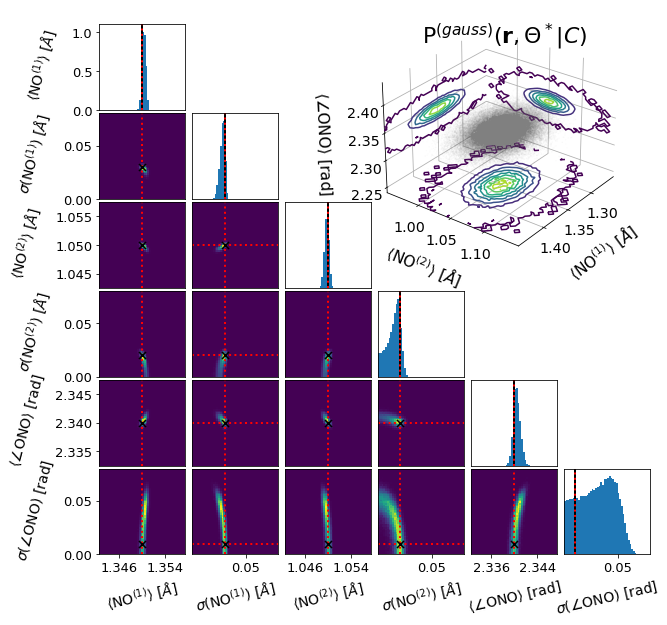

In [7]:
bp, tp, lp, rp = 0.07, 0.06, 0.105, 0.0101
bp, tp, lp, rp = 0.1, 0.01, 0.14, 0.0101


hpSep = 0.011
vpSep = 0.005
vsSep = 0
proj_w = 0.3

vdim = (1. - (5*vpSep+bp+tp))/6.
hdim = (1. - (5*hpSep+lp+rp))/6.

fig = plt.figure(figsize=(9,9/(vdim/hdim)))
label_size, tick_size = 14, 13
dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
corner_column(fig, dims, [theta_gauss], modes=[modes_gauss], centers=[cn_gauss],
             ranges_3d=ranges_3d, labels_3d=labels_delta,
             ranges_proj=[ranges_gauss], labels_proj=[labels_gauss],
             label_size=label_size, tick_size=tick_size)
#fig.savefig(os.path.join(
#    "./plots", dp1r["molecule"], dp1r["experiment"], "sim", dp1r["density_model"], "response_gauss.png"))

### N2O Data

In [ ]:
dpdt = get_parameters_data()
dpdt["init_geo_xyz"] = "XYZ/N2O.xyz"
cn_n2o = np.array([1.128, 1.184, np.pi])

# Import Data Chain
ex_n2o = density_extraction(dpdt,
    get_molecule_init_geo,
    get_scattering_amplitudes,
    log_prior=input_log_prior,
    density_generator=input_density_generator,
    ensemble_generator=None,
    get_ADMs=get_ADMs,
    results_only=False)
data_theta = ex_n2o.get_mcmc_results(plot=False)

# Import mode search results
fName = ex_n2o.get_fileName()
find = fName.rfind("/")
fName = fName[:find+1] + "mode_search_" + fName[find+1:]
fileName = os.path.join(dpdt["output_dir"], fName+".h5")
if os.path.exists(fileName):
    with h5py.File(fileName, "r") as h5:
        modes_n2o = h5["ths_mean"][:]
else:
    modes_n2o = None

# Print Results
print("Modes: {}".format(modes_n2o))
print("STD: {}".format(np.std(data_theta, axis=0)))

INFO: Making output folder
INFO: Setup Multiprocessing
INFO: Importing ground state geometry
	 N: 0.000000 0.000000 0.000000
	 N: 0.000000 0.000000 1.125700
	 O: 0.000000 0.000000 -1.186300
INFO: Setting up moment of inertia calculation
INFO: Rotating initial state molecular frame
INFO: Getting data
looking at file:  /cds/group/ued/scratch/N2O/UED_fit_results_Temp-30.0-150.0-121_Ints-1.0-10.0-91_filteredOffset.h5
INFO: Using dom from data
INFO: Getting scattering amplitudes
INFO: Pruning data
INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.128      0.05       1.184      0.05       3.14159265 0.05      ]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.128      1.184      3.14159265]

#####  STD molecule thetas  #####
[0.05 0.05 0.05]

#####  Mean molecule cartesian  #####
[[ 6.89994215e-17  0.00000000e+00  1.12764756e+00]
 [ 0.00000000e+00  0.00000000e+00  0.0

['$\\langle NN \\rangle$ $[\\AA]$', '$\\sigma (NN)$ $[\\AA]$', '$\\langle NO \\rangle$ $[\\AA]$', '$\\sigma (NO)$ $[\\AA]$', '$\\langle \\angle NNO \\rangle$ [rad]', '$\\sigma (\\angle NNO)$ [rad]']


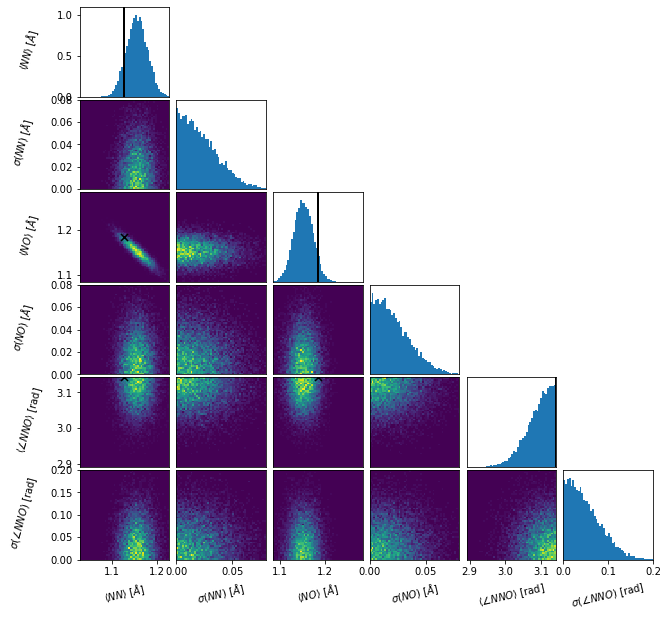

In [8]:
bp, tp, lp, rp = 0.07, 0.06, 0.105, 0.0101

hpSep = 0.011
vpSep = 0.005
vsSep = 0
proj_w = 0.3

vdim = (1. - (5*vpSep+bp))/6.
hdim = (1. - (5*hpSep+lp+rp))/6.

if len(data_parameters["sim_thetas"]) > 4:
    cn_n2o = np.array(dpdt["sim_thetas"])[np.array([0,2,4])]
else:
    cn_n2o = np.array(dpdt["sim_thetas"]) 
ranges_n2o = np.array([[x-0.1, x+0.1] for x in cn_n2o])
ranges_n2o[-1][-1] = np.pi
ranges_n2o[-1][0] = np.pi-0.25
ranges_theta_n2o = np.array([[x-0.1, x+0.1] for x in cn_n2o])
ranges_theta_n2o[-1][-1] = np.pi
ranges_theta_n2o[-1][0] = np.pi-0.25
labels_n2o = [r"$\langle NN \rangle$ $[\AA]$", r"$\langle NO \rangle$ $[\AA]$", r"$\langle \angle NNO \rangle$ [rad]"]
labels_sig_n2o = [r"$\sigma (NN)$ $[\AA]$", r"$\sigma (NO)$ $[\AA]$", r"$\sigma (\angle NNO)$ [rad]"]
if len(dpdt["sim_thetas"]) > 4:
    cn_gauss_n2o = data_parameters["sim_thetas"][:-1]
    ranges_gauss_n2o = []
    labels_gauss_n2o = []
    for ic, c in enumerate(cn_gauss_n2o):
        if ic%2 == 0:
            ranges_gauss_n2o.append(ranges_theta_n2o[ic//2])
            labels_gauss_n2o.append(labels_n2o[ic//2])
        else:
            ranges_gauss_n2o.append(np.array([0, 0.08]))
            labels_gauss_n2o.append(labels_sig_n2o[ic//2])

ranges_gauss_n2o = np.array(ranges_gauss_n2o)
ranges_gauss_n2o[-1,-1] *= 2.5

print(labels_gauss_n2o)
cn_n2o_ = copy(dpdt["sim_thetas"][:-1])
cn_n2o_[np.array([1,3,5])] = -1
fig = plt.figure(figsize=(9,9/(vdim/hdim)))
dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
corner_column(fig, dims, [data_theta], modes=[modes_n2o], 
        centers=[cn_n2o_], ranges_proj=[ranges_gauss_n2o],
        labels_proj=[labels_gauss_n2o], set_ticks=[False], do_3d=[False])
fig.savefig("./plots/{}/response_gauss.png".format(dpdt["molecule"]))

In [63]:
#cn_n2o = np.array([1.128, 0, 1.184, 0, 3.142, 0])
#for i in range(len(modes_n2o)//2):
#    print("&  & {} & {} & {} \\".format(cn_n2o[i], 
#            np.round(modes_n2o[i*2], 1-(int(np.floor(np.log10(abs(modes_n2o[i*2])))) - 1)), np.round(np.std(data_theta[:,i*2])*1000)/1000))

(106,) (250, 106)


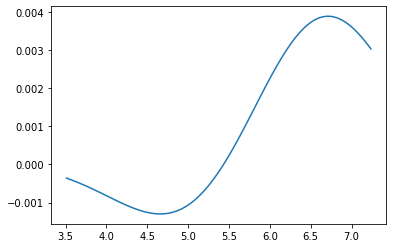

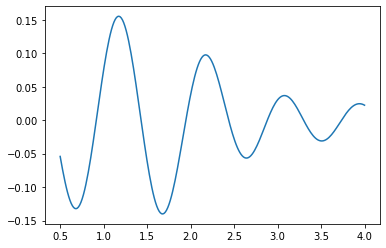

In [9]:
dm = np.linspace(0,20, 300)
dm = ex_n2o.dom
all_dists = calc_dists(ex_n2o.atom_positions)
dists = all_dists[ex_n2o.dist_inds]
sim_dfrctn = np.sum(ex_n2o.dist_sms_scat_amps[0]*np.sinc(np.expand_dims(dists[:,0], 1)*dm/np.pi), 0)
sim_sms = sim_dfrctn*dm/ex_n2o.atm_scat
#sim_dfrctn = np.sum(np.sinc(np.expand_dims(dists[:,0], 1)*dm/np.pi), 0)
#sim_sms = sim_dfrctn*dm
plt.figure()
plt.plot(dm, sim_sms)


sr_eval = np.linspace(0.5, 4, 250)
sines = np.sin(np.expand_dims(sr_eval, 1)*dm)
print(sim_sms.shape, sines.shape)
ovrlp = np.sum(sim_sms*sines, -1)
plt.figure()
plt.plot(sr_eval, ovrlp)

[ 1.128      -1.          1.184      -1.          3.14159265 -1.        ]
letter 0 1 False 1
1.3499754216806805 1.0498808317386201 2.339972765224626
SSS (100000,) (100000,) (100000,)
letter 0 3 True 1


'\nranges_proj=ranges_gauss, ranges_3d=ranges_3d,\n        labels_proj=labels_gauss, labels_3d=labels_delta,\nall_axs = corner_column(fig, dims, [data_theta], modes=np.array([modes_n2o]), \n        centers=cn_n2o_, ranges_proj=ranges_gauss_n2o, ranges_3d=ranges_n2o,\n        labels_proj=labels_gauss_n2o, labels_3d=labels_n2o, set_ticks=False,\n        label_size=label_size, tick_size=tick_size, do_3d=False)\n'

<Figure size 648x545.047 with 0 Axes>

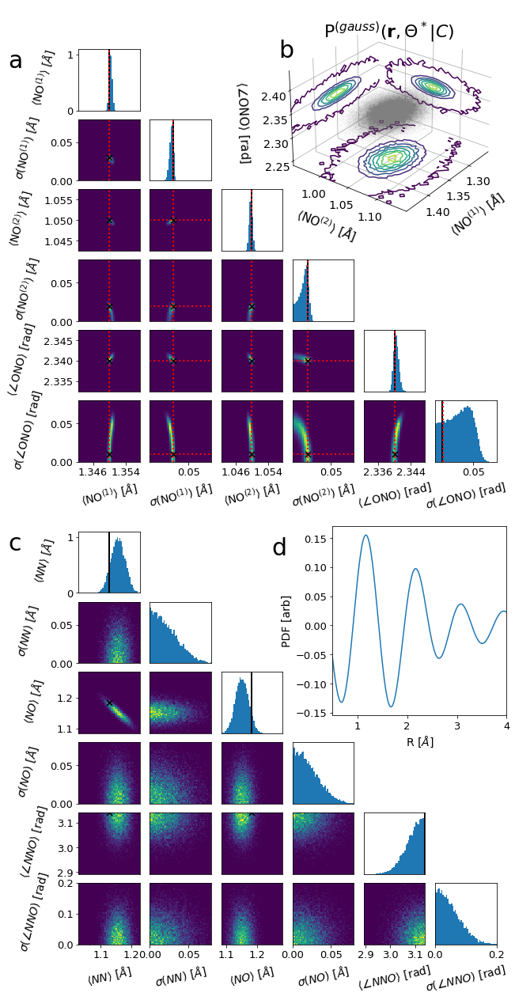

In [12]:
bp, tp, lp, rp = 0.1, 0.01, 0.14, 0.0101

print(cn_n2o_)
hpSep = 0.011
vpSep = 0.005
proj_w = 0.3

bp, tp, lp, rp = 0.07, 0.03, 0.15, 0.035
label_size, tick_size = 14, 13
hpSep = 0.016
vpSep = 0.005
vsSep = bp
proj_w = 0.3


#bp, tp, lp, rp = 0.07, 0.06, 0.08, 0.01
hpSep = 0.019
vpSep = 0.0088
proj_w = 0.3

vdim = (1. - (5*vpSep+bp+tp))/6.
hdim = (1. - (5*hpSep+lp+rp))/6.

fig = plt.figure(figsize=(9,9/(vdim/hdim)))
label_size, tick_size = 14, 13
dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)

samples_plot = [theta_gauss, data_theta]
N_theta = theta_gauss.shape[-1]
vdim = (1. - (len(samples_plot)*((N_theta-1)*vpSep+bp)+tp))/(len(samples_plot)*N_theta)
hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
fig_scale = 9.*N_theta/6.
fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
corner_column(fig, dims, samples_plot, modes=[modes_gauss, modes_n2o],
        centers=[cn_gauss,cn_n2o_], ranges_proj=[ranges_gauss, ranges_gauss_n2o],
        labels_proj=[labels_gauss, labels_gauss_n2o],
        ranges_3d=ranges_3d, labels_3d=labels_delta, label_size=label_size,
        tick_size=tick_size, do_3d=[True, False], set_ticks=[True, False])

# Plot calculated PDF
ax_pdf = fig.add_axes((0.645, 0.3, 0.34, 0.19))
ax_pdf.plot(sr_eval, ovrlp)
ax_pdf.set_xlim(sr_eval[0], sr_eval[-1])
ax_pdf.set_xlabel(r'R $[\AA]$', fontsize=label_size)
ax_pdf.set_ylabel("PDF [arb]", fontsize=label_size)
ax_pdf.tick_params(axis='x', labelsize=tick_size)
ax_pdf.tick_params(axis='y', labelsize=tick_size)
ax_pdf.text(-0.35, 0.85, s="d", transform=ax_pdf.transAxes, fontsize=30)

fig.savefig(os.path.join(
            "plots", dp1r["molecule"], dp1r["experiment"], "response_gauss.png"))

"""
ranges_proj=ranges_gauss, ranges_3d=ranges_3d,
        labels_proj=labels_gauss, labels_3d=labels_delta,
all_axs = corner_column(fig, dims, [data_theta], modes=np.array([modes_n2o]), 
        centers=cn_n2o_, ranges_proj=ranges_gauss_n2o, ranges_3d=ranges_n2o,
        labels_proj=labels_gauss_n2o, labels_3d=labels_n2o, set_ticks=False,
        label_size=label_size, tick_size=tick_size, do_3d=False)
"""

2.718281828459045 2.6881171418161356e+43


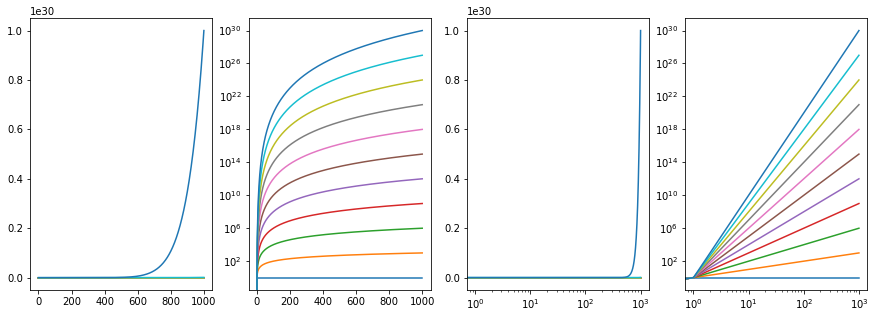

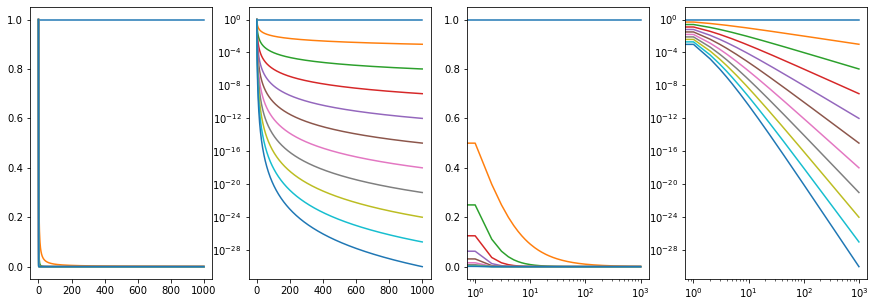

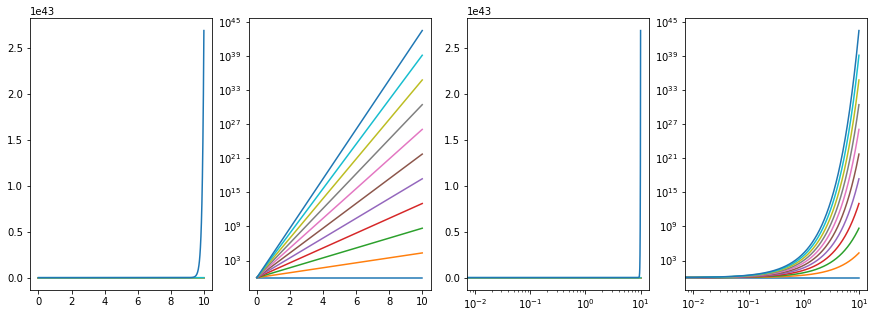

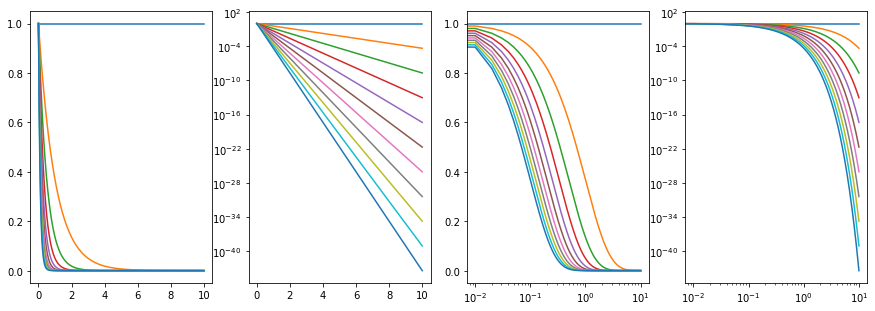

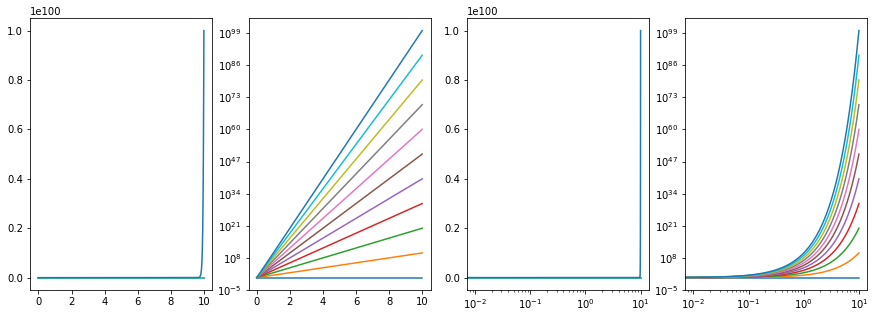

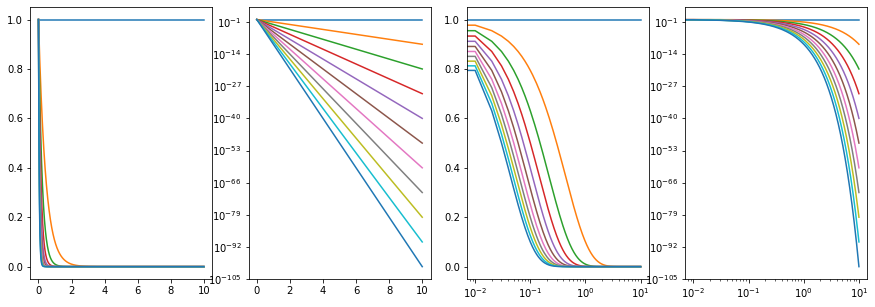

In [236]:
def fx(x, i):
    return x**i

x = np.linspace(0, 1000, 1000)
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(11):
    for j in range(4):
        ax[j].plot(x, fx(x,i), label=str(i))

    ax[1].set_yscale('log')
    ax[2].set_xscale('log')
    ax[3].set_yscale('log')
    ax[3].set_xscale('log')
    
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(11):
    for j in range(4):
        ax[j].plot(x, fx(x+1,-1*i), label=str(i))

    ax[1].set_yscale('log')
    ax[2].set_xscale('log')
    ax[3].set_yscale('log')
    ax[3].set_xscale('log')

def fx(x, i):
    return np.exp(x*i)

x = np.linspace(0, 10, 1000)
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(11):
    for j in range(4):
        ax[j].plot(x, fx(x,i), label=str(i))

    ax[1].set_yscale('log')
    ax[2].set_xscale('log')
    ax[3].set_yscale('log')
    ax[3].set_xscale('log')
    
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(11):
    for j in range(4):
        ax[j].plot(x, fx(x,-1*i), label=str(i))

    ax[1].set_yscale('log')
    ax[2].set_xscale('log')
    ax[3].set_yscale('log')
    ax[3].set_xscale('log')
print(np.exp(1),np.exp(100))

def fx(x, i):
    return 10**(x*i)

x = np.linspace(0, 10, 1000)
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(11):
    for j in range(4):
        ax[j].plot(x, fx(x,i), label=str(i))

    ax[1].set_yscale('log')
    ax[2].set_xscale('log')
    ax[3].set_yscale('log')
    ax[3].set_xscale('log')
    
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(11):
    for j in range(4):
        ax[j].plot(x, fx(x,-1*i), label=str(i))

    ax[1].set_yscale('log')
    ax[2].set_xscale('log')
    ax[3].set_yscale('log')
    ax[3].set_xscale('log')
#fig.legend()

## Compare S/N Effects

INFO: Making output folder
INFO: Setup Multiprocessing
INFO: Importing ground state geometry
	 O: 0.000000 1.098900 0.465300
	 N: 0.000000 0.000000 0.000000
	 O: 0.000000 -1.098900 0.465300
INFO: Setting up moment of inertia calculation
INFO: Rotating initial state molecular frame
INFO: Getting data
INFO: Getting scattering amplitudes
INFO: Simulate data
INFO: /cds/group/ued/scratch/khegazy/TeDDE/saved_simulations/NO2/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5 exist, now loading data
INFO: Pruning data


/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self.data_params["dom"] is None or "ata" in self.data_params["dom"]:


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 1.6596794685627646e-13 at index 25 ... Passed
L = 4 	 Largest std = 1.40548

IndexError: boolean index did not match indexed array along dimension 1; dimension is 236 but corresponding boolean dimension is 1

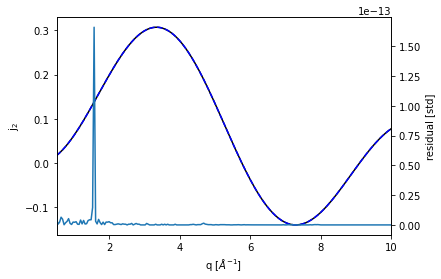

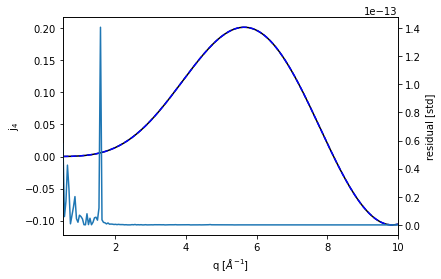

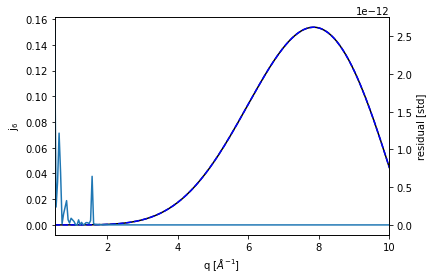

In [6]:
dp = copy(data_parameters)
#dp["simulate_error"] = ("constant_sigma", 1)
ex_sn = density_extraction(dp,
        get_molecule_init_geo,
        get_scattering_amplitudes,
        log_prior=input_log_prior,
        density_generator=input_density_generator,
        ensemble_generator=input_ensemble_generator,
        get_ADMs=get_ADMs)

print(np.array([[ex_sn.atom_positions]]))
print([ex_sn.atom_types])
atm_diffraction, mol = diffraction_calculation(
          np.array([np.zeros(3)]), np.array([np.ones(1)]),
          np.array([[ex_sn.atom_positions]]), [ex_sn.atom_types],
          ex_sn.scat_amps_interp, np.array([dp["dom"]]), ex_sn.data_params["detector_dist"],
          freq=ex_sn.data_params["wavelength"]) 

In [7]:
dpsn = copy(data_parameters)
dpsn["molecule"] = "NO2_symbreak"
dpsn["experiment"] = "3dof"
dpsn["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dpsn["density_model"] = "PDF"
dpsn["fit_range"] = [0.5, 10]
dpdsn = copy(dpsn)
dpdsn["density_model"] = "delta"
samples_sn, samples_delta_sn = [], []
modes_sn, modes_delta_sn = [], []

StoN = np.array([25, 50, 100, 200, 400])
for sn in StoN:
    #####  Gaussian Response  #####
    dpsn["simulate_error"] = ("StoN", (sn, [0.5,4]))
    results, modes = get_mcmc_results_mode(dpsn)
    samples_sn.append(copy(results))
    modes_sn.append(copy(modes))  
    
    #####  Delta Fxn Response  #####
    dpdsn["simulate_error"] = ("StoN", (sn, [0.5,4]))
    results, modes = get_mcmc_results_mode(dpdsn)
    samples_delta_sn.append(copy(results))
    modes_delta_sn.append(copy(modes)) 

modes_sn, modes_delta_sn = np.array(modes_sn), np.array(modes_delta_sn)
for i,(s,m) in enumerate(zip(samples_sn, modes_sn)):
    print("S/N {} with size {}".format(StoN[i], s.shape))
    print("\tModes: {}".format(m))
    print("\tMean: {}".format(np.mean(s, 0)))
    print("\tSTD: {}".format(np.std(s, 0)))
    print("\tScale: {}".format(np.abs(np.mean(s, 0)-cn_gauss)/np.std(s, 0)))

INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-25.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-25.h5
	 The chain has converged
INFO: Setting up MCMC
INFO: Autocorrelation Times [ 90.09629164 100.18234782  89.99812938 103.4237619   91.35267284
 103.98836707]
mode name /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/mode_search_results_sim_range-0.5-10.0_error-ston_scale-25.h5
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-25.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-25.h5
	 The chain has converged
INFO: 

1.350001539278612 1.0499879756901773 2.340019402644989
SSS (100000,) (100000,) (100000,)
letter 0 2 True 3
1.349974193386283 1.050134216322987 2.3400268892919285
SSS (100000,) (100000,) (100000,)
letter 0 4 True 3
1.349881105902903 1.050054409730428 2.3399791143725013
SSS (100000,) (100000,) (100000,)
letter 0 6 True 3


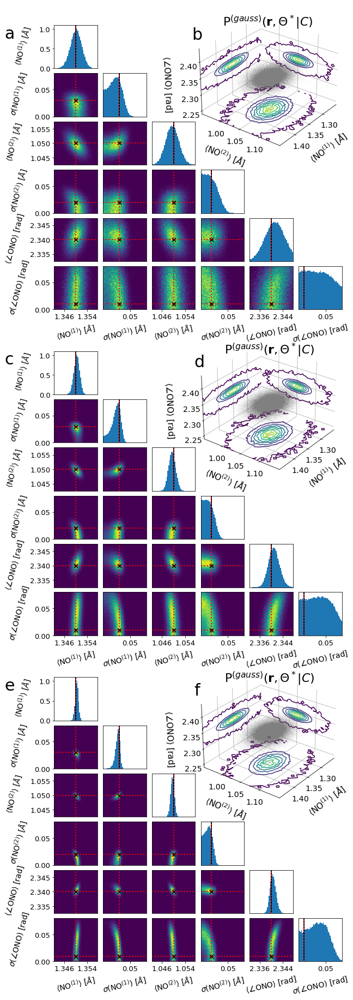

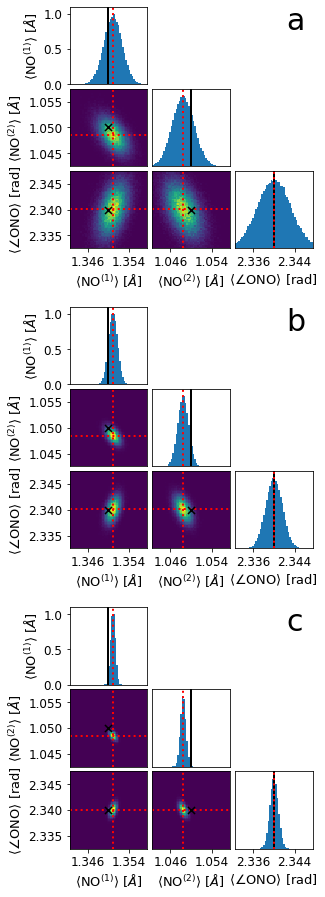

In [8]:
############################################
#####  Make Corner Plots and 3d Inset  #####
############################################

# Global plot parameters
bp, tp, lp, rp = 0.025, 0.05, 0.105, 0.0101
#bp, tp, lp, rp = 0.07, 0.06, 0.08, 0.01
hpSep = 0.016
vpSep = 0.005
proj_w = 0.3

for i, (samples, modes) in enumerate(zip([samples_sn, samples_delta_sn], [modes_sn, modes_delta_sn])):
    
    # Select samples/modes to plot
    if len(samples) > 3:
        samples_plot = []
        modes_plot = []
        for ss in [50, 100, 200]:
            samples_plot.append(samples[int(np.where(StoN==ss)[0])])
            modes_plot.append(modes[int(np.where(StoN==ss)[0])])
        modes_plot = modes_plot
    else:
        samples_plot = samples
        modes_plot = modes
    if np.any(np.isnan(modes_plot)):
        modes_plot = None
    
    # Configure plot parameters
    N_theta = samples[0].shape[-1]
    if i == 0:
        density_model = "PDF"
        bp, tp, lp, rp, vsSep = 0.035, 0.01, 0.15, 0.035, 8.5*vpSep
        label_size, tick_size = 14, 13
        inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
        vdims_3d = [(0.192, 0.15), (0.527, 0.15), (0.857, 0.155)]
    else:
        density_model = "delta"
        bp, tp, lp, rp, vsSep = 0.05, 0.015, 0.2, 0.05, 13*vpSep
        label_size, tick_size = 13, 12
        inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
        vdims_3d = None
    
    vdim = (1. - (len(samples_plot)*((N_theta-1)*vpSep)+(len(samples_plot)-1)*vsSep+bp+tp))/(len(samples_plot)*N_theta)
    hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
    fig_scale = 9.*N_theta/6.
    fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
    dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
    
    
    # Plot
    corner_column(fig, dims, samples_plot, modes=modes_plot,
            centers=[inp_cn,]*len(samples_plot), ranges_proj=[inp_range,]*len(samples_plot),
            labels_proj=[inp_labels,]*len(samples_plot), ranges_3d=ranges_3d, labels_3d=labels_delta,
            label_size=label_size, tick_size=tick_size, vdims_3d=vdims_3d)
    fig.savefig(os.path.join(
            "plots", dpsn["molecule"], dpsn["experiment"], "sim", density_model, "correlations_sn.png"))

/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


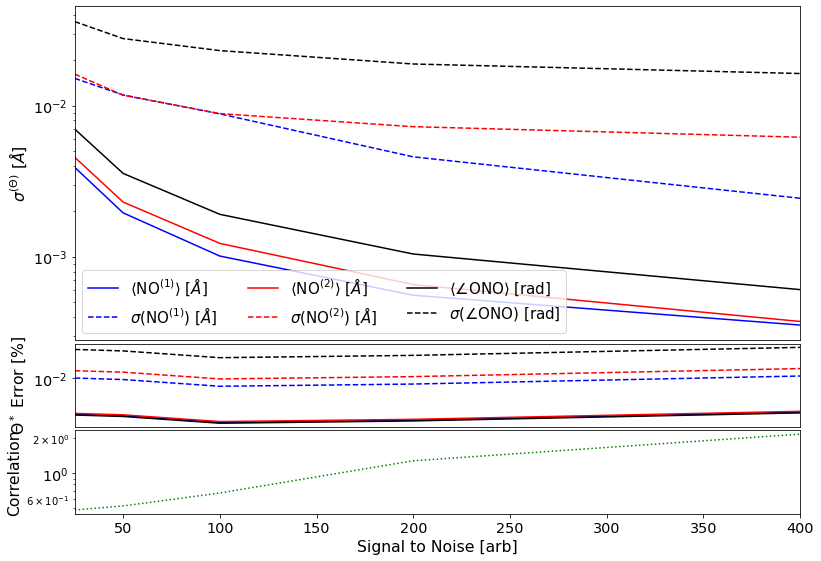

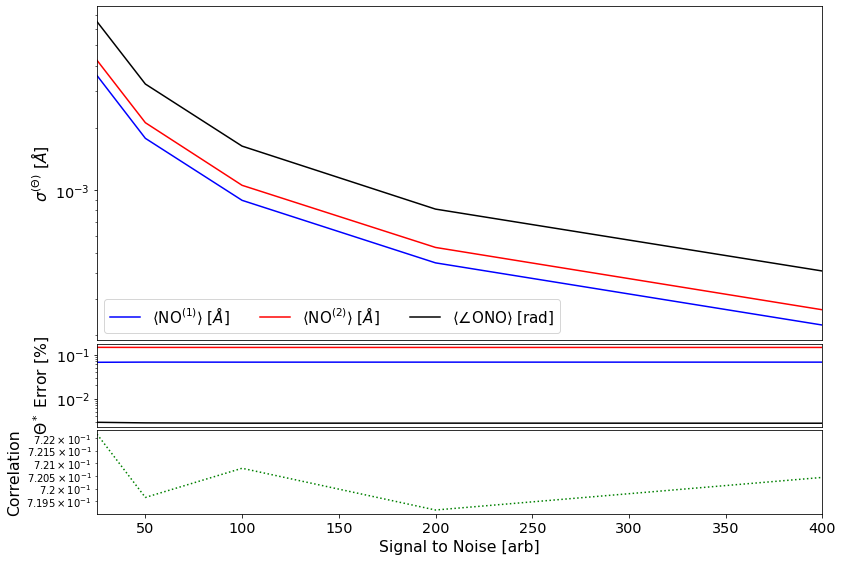

In [9]:
###########################
#####  Summary Plots  #####
###########################
clrs = ['b', 'r', 'k']

###  Precisions and Correlations  ###
for i,samples in enumerate([samples_sn, samples_delta_sn]):
    precs, corrs = get_precision_correlation(samples)
    if i == 0:
        precision_gauss_sn, corrs_gauss_sn = np.array(precs), np.array(corrs)
    else:
        precision_delta_sn, corrs_delta_sn = np.array(precs), np.array(corrs)

# Plotting
for i in range(2):
    if i == 0:
        density_model, ylim = "PDF", [2e-4, 4e-2]
        modes, prec, corrs = modes_sn, precision_gauss_sn, corrs_gauss_sn
        inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
    else:
        density_model, ylim = "delta", [4e-3, 1.8e-3]
        modes, prec, corrs = modes_delta_sn, precision_delta_sn, corrs_delta_sn
        inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
    
    fig = plot_trends_single(StoN, prec, modes, inp_cn, "Signal to Noise [arb]", corrs,
                labels=inp_labels, label_size=label_size, tick_size=tick_size, colors=clrs)
    fig.savefig(os.path.join(
                "plots", dpsn["molecule"], dpsn["experiment"], "sim", density_model, "trend_sn.png"))

## Looking at q Effects

In [10]:
########################################
#####  Get MCMC Results and Modes  #####
########################################

dpqe = copy(data_parameters)
dpqe["molecule"] = "NO2_symbreak"
dpqe["experiment"] = "3dof"
dpqe["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dpqe["density_model"] = "PDF"
dpdqe = copy(dpqe)
dpdqe["density_model"] = "delta"
samples_q, samples_delta_q = [], []
modes_q, modes_delta_q = [], []

q_max = np.array([5, 7.5, 10, 12.5, 15, 17.5, 20])
for q in q_max:   
    #####  Gaussian Response  #####
    dpqe["fit_range"] = [0.5, q]
    dpqe["simulate_error"] = ("StoN", (100, [0.5,4]))
    dpqe = setup_dom(dpqe)
    results, modes = get_mcmc_results_mode(dpqe)
    samples_q.append(copy(results))
    modes_q.append(copy(modes))  
    
    #####  Delta Fxn Response  #####
    dpdqe["fit_range"] = [0.5, q]
    dpdqe["simulate_error"] = ("StoN", (100, [0.5,4]))
    dpdqe = setup_dom(dpdqe)
    results, modes = get_mcmc_results_mode(dpdqe)
    samples_delta_q.append(copy(results))
    modes_delta_q.append(copy(modes)) 

modes_q, modes_delta_q = np.array(modes_q), np.array(modes_delta_q)
for i,(s,m) in enumerate(zip(samples_q, modes_q)):
    print("Q max {} with size {}".format(q_max[i], s.shape))
    print("\tModes: {}".format(m))
    print("\tMean: {}".format(np.mean(s, 0)))
    print("\tSTD: {}".format(np.std(s, 0)))
    print("\tScale: {}".format(np.abs(np.mean(s, 0)-cn_gauss)/np.std(s, 0)))

INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-5.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-5.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Setting up MCMC
INFO: Autocorrelation Times [ 99.02205855 106.56995071  99.24236698 113.78157299 102.44594426
 117.29089971]
mode name /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/mode_search_results_sim_range-0.5-5.0_error-ston_scale-100.h5
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/results_sim_range-0.5-5.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/results_sim_range-0.5-5.0_error-ston_scale-100.h5
	 The chain has converged
INFO: 

	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/results_sim_range-0.5-20.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Setting up MCMC
INFO: Autocorrelation Times [34.19663994 33.99772528 34.58273762]
mode name /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/mode_search_results_sim_range-0.5-20.0_error-ston_scale-100.h5
Q max 5.0 with size (300400, 6)
	Modes: [1.34999392 0.03001914 1.05000408 0.02010388 2.3399918  0.00890843]
	Mean: [1.35199001 0.03218022 1.04689995 0.02033733 2.3436433  0.04513707]
	STD: [0.00351757 0.01884214 0.00495576 0.01331782 0.00491179 0.03008732]
	Scale: [0.5657338  0.11570951 0.62554548 0.02532899 0.74174451 1.16783644]
Q max 7.5 with size (91000, 6)
	Modes: [1.34999993 0.03000027 1.05000006 0.0200008  2.33999992 0.0099908 ]
	Mean: [1.35021567 0.02172478 1.04952092 0.01568828 2.34080439 0.03652977]
	STD: [0.00143432 0.01154637 0.001695

1.349890976063545 1.0499589645229594 2.340009288607551
SSS (100000,) (100000,) (100000,)
letter 0 2 True 2
1.3500694188445546 1.050011711840029 2.3400238712315935
SSS (100000,) (100000,) (100000,)
letter 0 4 True 2


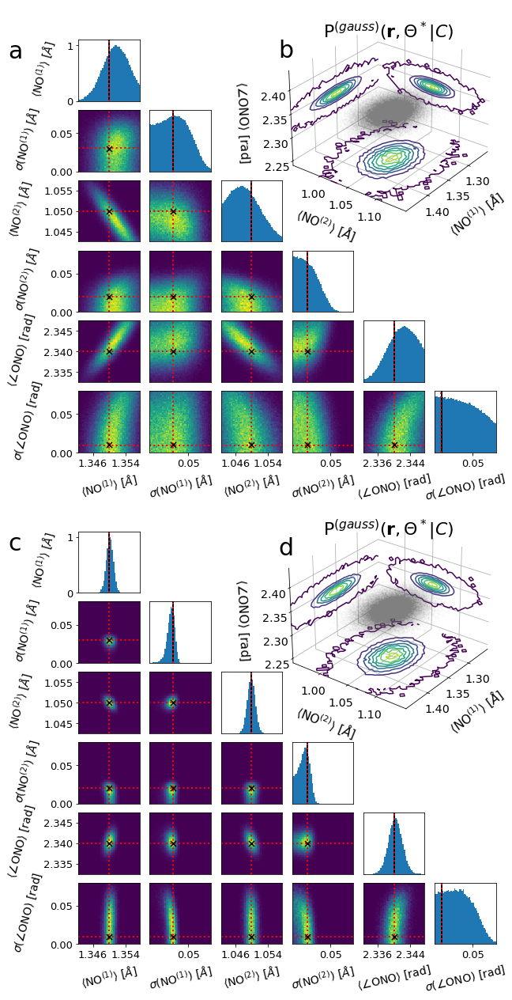

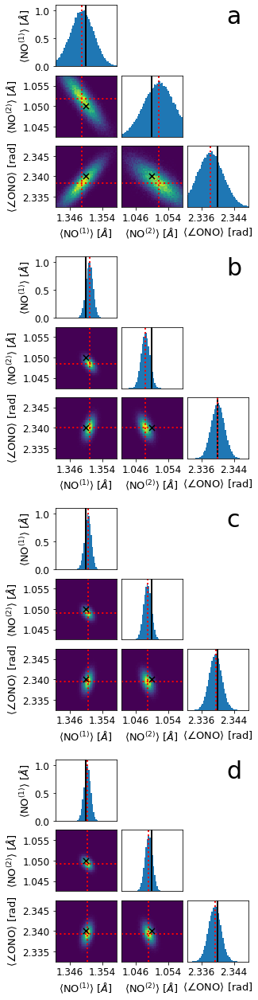

In [14]:
############################################
#####  Make Corner Plots and 3d Inset  #####
############################################

# Global plot parameters
bp, tp, lp, rp = 0.025, 0.05, 0.105, 0.0101
#bp, tp, lp, rp = 0.07, 0.06, 0.08, 0.01
hpSep = 0.016
vpSep = 0.005
proj_w = 0.3


#bp, tp, lp, rp = 0.07, 0.06, 0.08, 0.01
hpSep = 0.019
vpSep = 0.0088
proj_w = 0.3

for i, (samples, modes) in enumerate(zip([samples_q, samples_delta_q], [modes_q, modes_delta_q])):
    
    if i == 0:
        bp, tp, lp, rp, vsSep = 0.07, 0.03, 0.15, 0.035, 9*vpSep
        label_size, tick_size = 14, 13
        select_q = [5,20]
    else:
        bp, tp, lp, rp, vsSep = 0.05, 0.015, 0.2, 0.05, 5.5*vpSep
        label_size, tick_size = 13, 12
        select_q = [5, 10, 15, 20]
    
    # Select samples/modes to plot
    if len(samples) > 2:
        samples_plot = []
        modes_plot = []
        for qq in select_q:
            samples_plot.append(samples[int(np.where(q_max==qq)[0])])
            modes_plot.append(modes[int(np.where(q_max==qq)[0])])
        modes_plot = modes_plot
    else:
        samples_plot = samples
        modes_plot = modes
    if np.any(np.isnan(modes_plot)):
        modes_plot = None
    
    # Configure plot parameters
    N_theta = samples[0].shape[-1]
    vdim = (1. - (len(samples_plot)*((N_theta-1)*vpSep+bp)+tp))/(len(samples_plot)*N_theta)
    hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
    fig_scale = 9.*N_theta/6.
    fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
    dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
    if i == 0:
        density_model = "PDF"
        inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
    else:
        density_model = "delta"
        inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
    
    # Plot
    corner_column(fig, dims, samples_plot, modes=modes_plot,
            centers=[inp_cn,]*len(samples_plot), ranges_proj=[inp_range,]*len(samples_plot), labels_proj=[inp_labels,]*len(samples_plot),
            ranges_3d=ranges_3d, labels_3d=labels_delta,  
            label_size=label_size, tick_size=tick_size)
    fig.savefig(os.path.join(
            "plots", dpqe["molecule"], dpqe["experiment"], "sim", density_model, "correlations_q.png"))

/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


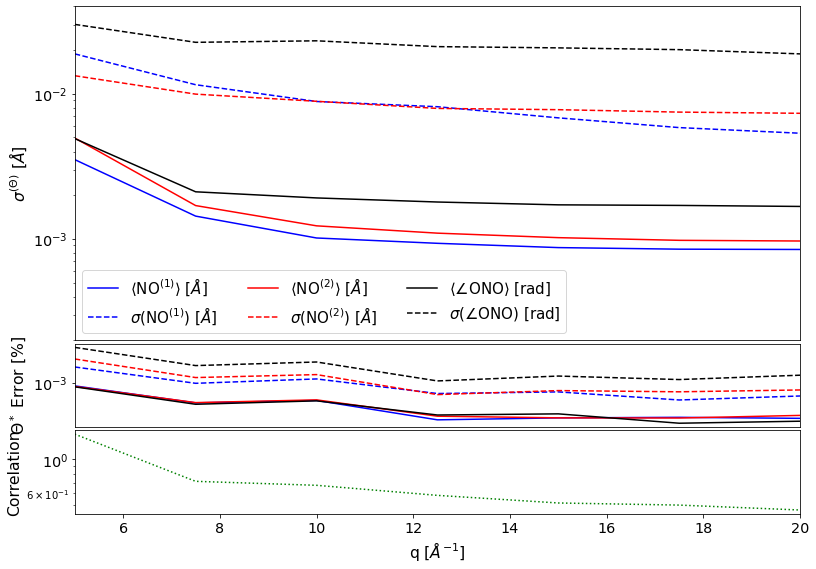

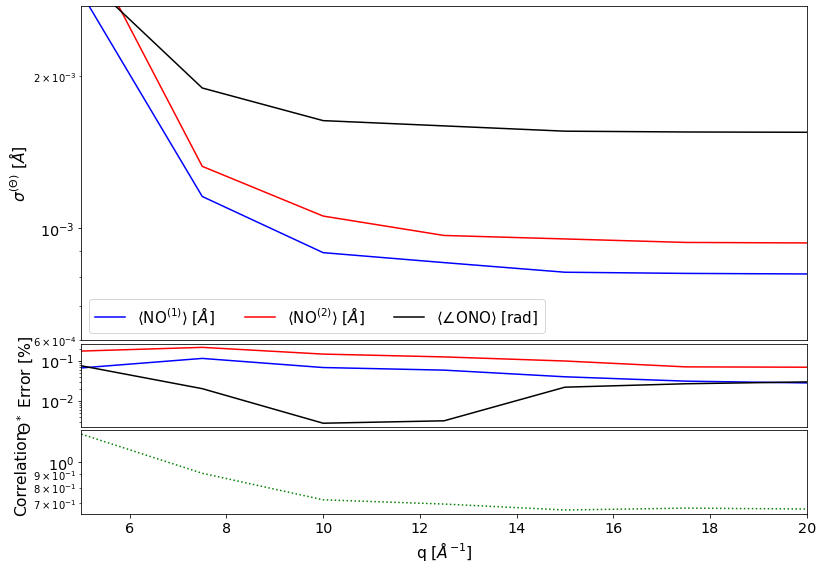

In [12]:
###########################
#####  Summary Plots  #####
###########################
clrs = ['b', 'r', 'k']

###  Precisions and Correlations  ###
for i,samples in enumerate([samples_q, samples_delta_q]):
    precs, corrs = get_precision_correlation(samples)
    if i == 0:
        precision_gauss_q, corrs_gauss_q = np.array(precs), np.array(corrs)
    else:
        precision_delta_q, corrs_delta_q = np.array(precs), np.array(corrs)

# Plotting
for i in range(2):
    if i == 0:
        density_model, ylim = "PDF", [2e-4, 4e-2]
        modes, prec, corrs = modes_q, precision_gauss_q, corrs_gauss_q
        inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
    else:
        density_model, ylim = "delta", [6e-4, 2.75e-3]
        modes, prec, corrs = modes_delta_q, precision_delta_q, corrs_delta_q
        inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
    
    fig = plot_trends_single(q_max, prec, modes, inp_cn, "q $[\AA^{-1}]$", corrs,
            labels=inp_labels, ylim=ylim, label_size=label_size, tick_size=tick_size)
    fig.savefig(os.path.join(
                "plots", dpqe["molecule"], dpqe["experiment"], "sim", density_model, "trend_q.png"))

1.3500243353410473 1.050051299734756 2.3399991008063887
SSS (100000,) (100000,) (100000,)
letter 0 2 True 2
1.3500556621332684 1.0499646018147288 2.3399050597137956
SSS (100000,) (100000,) (100000,)
letter 0 4 True 2


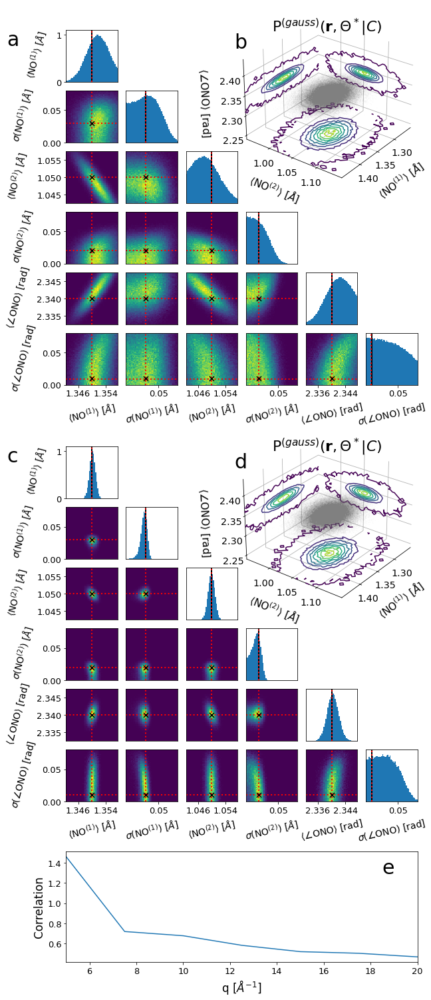

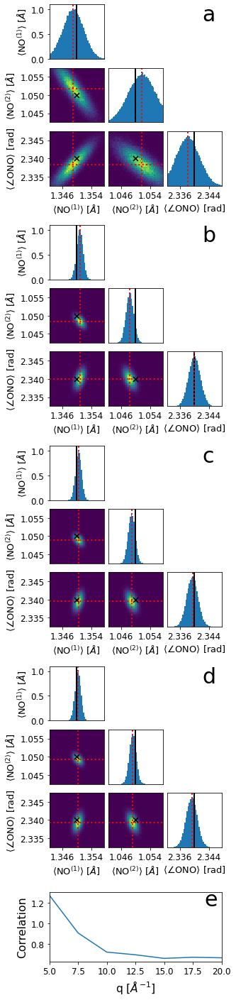

In [15]:
############################################
#####  Make Corner Plots and 3d Inset  #####
############################################

# Global plot parameters
bp, tp, lp, rp = 0.15, 0.05, 0.105, 0.0101
#bp, tp, lp, rp = 0.07, 0.06, 0.08, 0.01
hpSep = 0.016
vpSep = 0.005
proj_w = 0.3


#bp, tp, lp, rp = 0.07, 0.06, 0.08, 0.01
hpSep = 0.019
vpSep = 0.0088
proj_w = 0.3

for i, (samples, modes) in enumerate(zip([samples_q, samples_delta_q], [modes_q, modes_delta_q])):
    
    if i == 0:
        bp, tp, lp, rp, vsSep = 0.2, 0.03, 0.15, 0.035, 7*vpSep
        label_size, tick_size = 14, 13
        select_q = [5,20]
        vdims_3d = [(0.364, 0.24), (0.783, 0.24)]
        q_corr = corrs_gauss_q
        corr_dims = (lp,0.04,1-lp-rp,0.11)
    else:
        bp, tp, lp, rp, vsSep = 0.15, 0.0015, 0.2, 0.05, 4.5*vpSep
        label_size, tick_size = 13, 12
        select_q = [5, 10, 15, 20]
        vdims_3d = None
        q_corr = corrs_delta_q
        corr_dims = (lp,0.035,1-lp-rp,0.07)
    
    # Select samples/modes to plot
    if len(samples) > 2:
        samples_plot = []
        modes_plot = []
        for qq in select_q:
            samples_plot.append(samples[int(np.where(q_max==qq)[0])])
            modes_plot.append(modes[int(np.where(q_max==qq)[0])])
        modes_plot = modes_plot
    else:
        samples_plot = samples
        modes_plot = modes
    if np.any(np.isnan(modes_plot)):
        modes_plot = None
    
    # Configure plot parameters
    N_theta = samples[0].shape[-1]
    vdim = (1. - (len(samples_plot)*((N_theta-1)*vpSep)+(len(samples_plot)-1)*vsSep+bp+tp))/(len(samples_plot)*N_theta)
    hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
    fig_scale = 9.*N_theta/6.
    fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
    dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
    if i == 0:
        density_model = "PDF"
        inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
    else:
        density_model = "delta"
        inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
    
    # Plot
    corner_column(fig, dims, samples_plot, modes=modes_plot,
            centers=[inp_cn,]*len(samples_plot), ranges_proj=[inp_range,]*len(samples_plot), labels_proj=[inp_labels,]*len(samples_plot),
            ranges_3d=ranges_3d, labels_3d=labels_delta,
            label_size=label_size, tick_size=tick_size, vdims_3d=vdims_3d)
    
    ax_corr = fig.add_axes(corr_dims)
    ax_corr.set_xlabel("q [$\AA^{-1}$]", fontsize=label_size*1.2)
    ax_corr.set_ylabel("Correlation", fontsize=label_size*1.2)
    ax_corr.tick_params(axis='y', labelsize=tick_size)
    ax_corr.tick_params(axis='x', labelsize=tick_size)
    ax_corr.plot(q_max, q_corr)
    ax_corr.set_xlim([q_max[0], q_max[-1]])
    ax_corr.text(0.9, 0.8, "e", fontsize=30, transform=ax_corr.transAxes)
    
    fig.savefig(os.path.join(
            "plots", dpqe["molecule"], dpqe["experiment"], "sim", density_model, "correlations_q.png"))

## Delta Function Q Dependence

INFO: Making output folder
INFO: Setup Multiprocessing
INFO: Importing ground state geometry
	 O: 0.000000 0.526705 1.243013
	 N: 0.000000 0.000000 0.000000
	 O: 0.000000 0.409659 -0.966789
INFO: Setting up moment of inertia calculation
INFO: Rotating initial state molecular frame
INFO: Getting data
INFO: Getting scattering amplitudes
INFO: Simulate data
INFO: /cds/group/ued/scratch/khegazy/TeDDE/saved_simulations/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-20.0_error-ston_scale-100.h5 exist, now loading data
INFO: Pruning data


/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self.data_params["dom"] is None or "ata" in self.data_params["dom"]:


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 2.3983169551066e-14 at index 25 ... Passed
L = 4 	 Largest std = 1.29320366

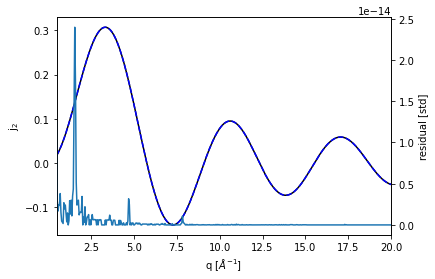

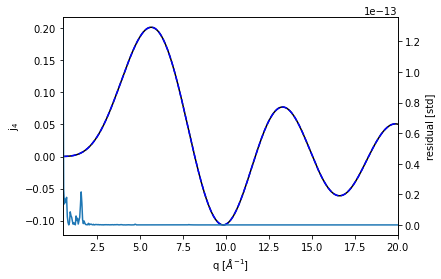

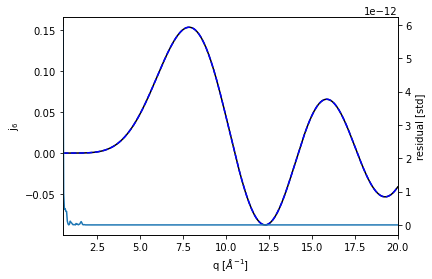

In [15]:
dp = copy(input_data_parameters)
dp["molecule"] = "NO2_symbreak"
dp["experiment"] = "3dof"
dp["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dp["fit_range"] = [0.5, 20]
dp["density_model"] = "PDF"
dp["simulate_error"] = ("StoN", (100, [0.5,4]))#("constant_sigma", 0.1)
dp = setup_dom(dp)

exx = density_extraction(dp,
    get_molecule_init_geo,
    get_scattering_amplitudes,
    log_prior=input_log_prior,
    density_generator=input_density_generator,
    ensemble_generator=input_ensemble_generator,
    get_ADMs=get_ADMs)
print("TEST SHAPE FIN", exx.data_coeffs.shape)
lmk_delta_q = copy(exx.data_LMK)
data_delta_q = copy(exx.data_coeffs)
var_delta_q = copy(exx.data_coeffs_var)
delta_q = copy(exx.dom)

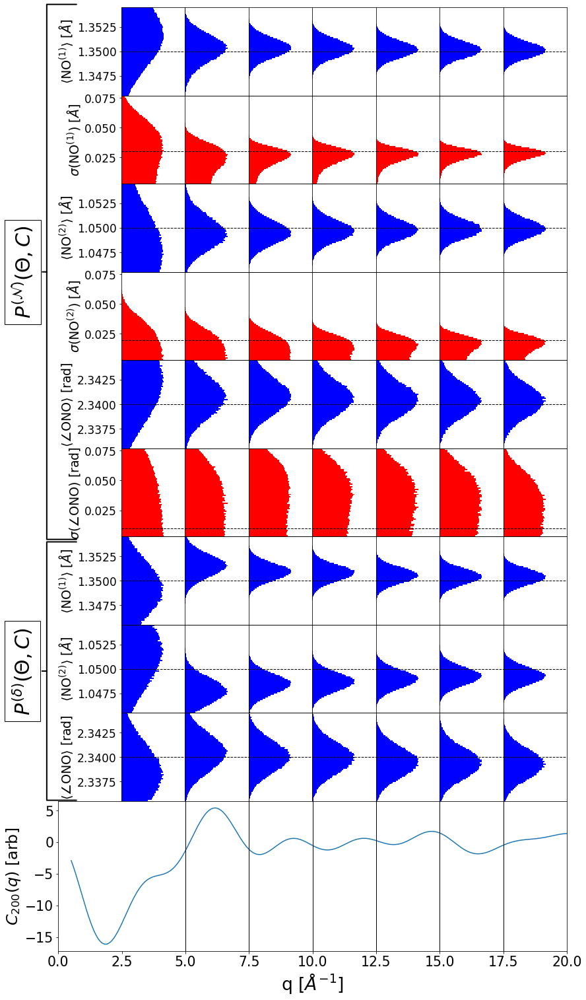

In [16]:
fig = plt.figure(figsize=(12, 21))#17
ax_hg = []
label_size, tick_size = 19, 17
c_height = 0.15
lb = 0.05
lbb = 0.2135
N_thetas = modes_delta_q.shape[-1] + modes_q.shape[-1]
hdim, vdim = (1-lbb-0.005)/len(q_max), (0.995-lb-c_height)/N_thetas
for v in range(N_thetas):
    ax_hg.append([])
    for h in range(len(q_max)):
        ax_hg[-1].append(fig.add_axes((lbb+h*hdim, lb+c_height+v*vdim, hdim, vdim)))
        ax_hg[-1][-1].xaxis.set_visible(False)
        if h > 0:
            ax_hg[-1][-1].yaxis.set_visible(False)
ax_c = fig.add_axes((0.103, lb, 0.892, c_height))

for ith in range(N_thetas):
    clr = 'b'
    if ith < modes_delta_q.shape[-1]:
        ith_ = ith
        samples_ = samples_delta_q
        ranges_ = ranges_delta
        cn_ = cn_delta
        labels_ = labels_delta
    else:
        ith_ = ith - modes_delta_q.shape[-1]
        samples_ = samples_q
        ranges_ = ranges_gauss
        cn_ = cn_gauss
        labels_ = labels_gauss
        if ith_ % 2 == 0:
            clr = 'r'
    ax_hg[ith][0].set_ylabel(labels_[-1*ith_-1], fontsize=label_size)
    ax_hg[ith][0].tick_params(axis='y', labelsize=tick_size)
    for iq in range(len(q_max)):
        bins = np.linspace(ranges_[-1*ith_-1][0]+0.003, ranges_[-1*ith_-1][1]-0.003, 69)
        n, x = np.histogram(samples_[iq][:,-1*ith_-1], bins=bins)#[-1*v-1])
        n = n/np.amax(n)
        ax_hg[ith][iq].barh((x[1:]+x[:-1])/2., n, height=x[1]-x[0], align='center', color=clr)
        ax_hg[ith][iq].set_xlim(0,1.5)
        ax_hg[ith][iq].set_ylim(bins[0], bins[-1])
        #axs0[v][h].plot((x[1:]+x[:-1])/2., n, '--k')

        ax_hg[ith][iq].plot([0, 1.5], [cn_[-1*ith_-1], cn_[-1*ith_-1]], '--k', linewidth=1)

dind = np.where((lmk_delta_q[:,0]==2)*(lmk_delta_q[:,1]==0)*(lmk_delta_q[:,2]==0))[0][0]
ax_c.plot(delta_q, data_delta_q[dind,:])
ax_c.set_xlim(0, delta_q[-1])
ax_c.set_xlabel(r"q $[\AA^{-1}]$", fontsize=label_size*1.4)
ax_c.set_ylabel(r"$C_{200}(q)$ [arb]", fontsize=tick_size*1.4)
ax_c.tick_params(axis='y', labelsize=tick_size*1.2)
ax_c.tick_params(axis='x', labelsize=tick_size*1.2)
ymin, ymax = ax_c.get_ylim()
for iq in q_max:
    ax_c.plot([iq, iq], [ymin, ymax], '-k', linewidth=1)
ax_c.set_ylim(ymin, ymax)

ax_hg[1][0].annotate(r"$P^{(\delta)}(\Theta, C)$", xy=(-1.15, 0.475), xytext=(-1.55, 0.475), xycoords='axes fraction', 
            fontsize=30, ha='center', va='center', rotation=90,
            bbox=dict(boxstyle='square', fc="w"),
            arrowprops=dict(arrowstyle='-[, widthB=6.52, lengthB=1.5', lw=2.0,#6.305
                           connectionstyle="angle3,angleA=90,angleB=180"))
ax_hg[5][0].annotate(r"$P^{(\mathcal{N})}(\Theta, C)$", xy=(-1.15, 1), xytext=(-1.55, 1), xycoords='axes fraction', 
            fontsize=30, ha='center', va='center', rotation=90,
            bbox=dict(boxstyle='square', fc="w"),
            arrowprops=dict(arrowstyle='-[, widthB=13.5, lengthB=1.5', lw=2.0,#13.15
                           connectionstyle="angle3,angleA=90,angleB=180"))

fig.savefig(os.path.join(
        "plots", dpqe["molecule"], dpqe["experiment"], "sim", "theta_peaks_q.png"))

## Looking at LMK Effects

In [17]:
########################################
#####  Get MCMC Results and Modes  #####
########################################
qlk = 10
sig = 100
dplk = copy(data_parameters)
dplk["molecule"] = "NO2_symbreak"
dplk["experiment"] = "3dof"
dplk["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dplk["fit_range"] = [0.5, qlk]
dplk["simulate_error"] = ("StoN", (sig, [0.5,4]))
dplk = setup_dom(dplk)
dpdlk = copy(dplk)
dpdlk["density_model"] = "delta"
samples_lmk, samples_lmk_delta = [], []
modes_lmk, modes_lmk_delta = [], []
fluence_info = [[25, 12.5], [25, 25], [25, 50], [25, 100]]
temp_info = [[12.5, 100], [25, 100], [50, 100], [100, 100]]
lmk_info = []
for inf in fluence_info:
    if inf not in lmk_info:
        lmk_info.append(inf)
for inf in temp_info:
    if inf not in lmk_info:
        lmk_info.append(inf)

for itn in lmk_info:
      
    #####  Gaussian Response  #####
    dplk["ADM_params"]["temperature"] = itn[0]
    dplk["ADM_params"]["probe_FWHM"] = itn[1] 
    results, modes = get_mcmc_results_mode(dplk)
    samples_lmk.append(copy(results))
    modes_lmk.append(copy(modes))
    
    
    #####  Delta Fxn Response  #####
    dpdlk["ADM_params"]["temperature"] = itn[0]
    dpdlk["ADM_params"]["probe_FWHM"] = itn[1]
    results, modes = get_mcmc_results_mode(dpdlk)
    samples_lmk_delta.append(copy(results))
    modes_lmk_delta.append(copy(modes))
    

modes_lmk, modes_lmk_delta = np.array(modes_lmk), np.array(modes_lmk_delta)

INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/25K_10TW_12.5fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/25K_10TW_12.5fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Setting up MCMC
INFO: Autocorrelation Times [ 87.8945754  100.55214439  88.97140069  99.24815585  92.23337062
 102.55669997]
mode name /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/PDF/25K_10TW_12.5fs/mode_search_results_sim_range-0.5-10.0_error-ston_scale-100.h5
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/25K_10TW_12.5fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/25K_10TW_12.5fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5
	 The chain has converged
I

	 The chain has converged
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/results_sim_range-0.5-10.0_error-ston_scale-100.h5
	 The chain has converged
INFO: Setting up MCMC
INFO: Autocorrelation Times [34.94013852 34.40924693 34.61743144]
mode name /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/delta/100K_10TW_100fs/mode_search_results_sim_range-0.5-10.0_error-ston_scale-100.h5


(25, 12.5) (array([0]),)
(25, 25) (array([1]),)
(25, 100) (array([3]),)
1.3500294239805353 1.0498622341759662 2.3399631002594683
SSS (100000,) (100000,) (100000,)
letter 0 2 True 3
1.3500455095541917 1.0500334827881914 2.339952901644311
SSS (100000,) (100000,) (100000,)
letter 0 4 True 3
1.3498468092529807 1.0500564930915934 2.3400149802394377
SSS (100000,) (100000,) (100000,)
letter 0 6 True 3
(12.5, 100) (array([4]),)
(25, 100) (array([3]),)
(100, 100) (array([6]),)
1.3499356895760133 1.0499422443909996 2.339992785343972
SSS (100000,) (100000,) (100000,)
letter 0 2 True 3
1.3501404952510205 1.0500172741874088 2.3399889913973335
SSS (100000,) (100000,) (100000,)
letter 0 4 True 3
1.350112153814802 1.0499753466564872 2.340006354973053
SSS (100000,) (100000,) (100000,)
letter 0 6 True 3
(25, 12.5) (array([0]),)
(25, 25) (array([1]),)
(25, 100) (array([3]),)
(12.5, 100) (array([4]),)
(25, 100) (array([3]),)
(100, 100) (array([6]),)


<Figure size 648x1955.91 with 0 Axes>

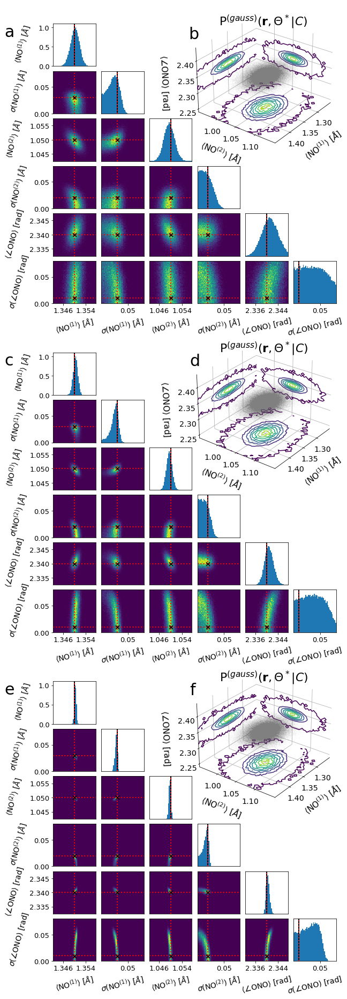

<Figure size 648x1764 with 0 Axes>

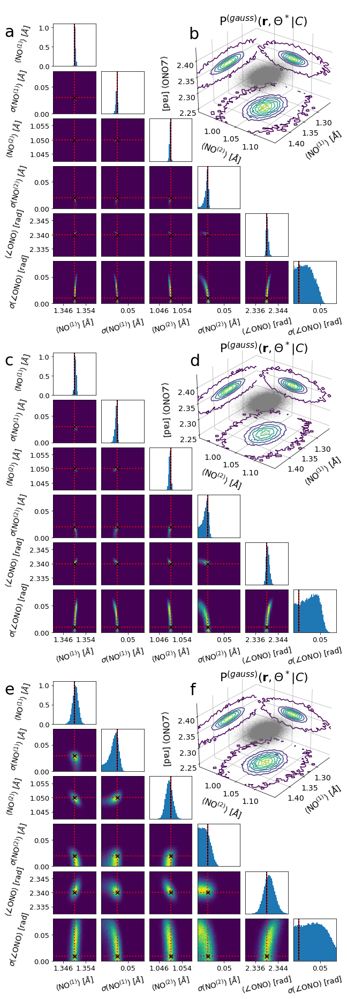

<Figure size 324x890.147 with 0 Axes>

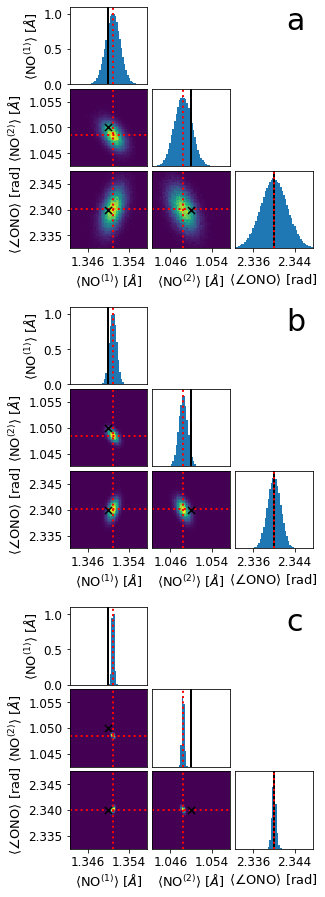

<Figure size 324x866.952 with 0 Axes>

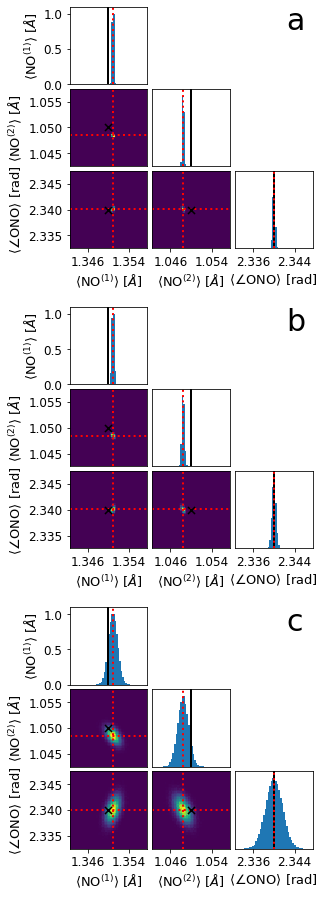

In [20]:
############################################
#####  Make Corner Plots and 3d Inset  #####
############################################

# Global plot parameters
bp, tp, lp, rp = 0.025, 0.05, 0.105, 0.0101
#bp, tp, lp, rp = 0.07, 0.06, 0.08, 0.01
hpSep = 0.016
vpSep = 0.005
proj_w = 0.3
lmk_info_ = np.array(lmk_info)

for i, (samples, modes) in enumerate(zip([samples_lmk, samples_lmk_delta], [modes_lmk, modes_lmk_delta])):
    
    #####  Fluence Scan  #####
    # Select samples/modes to plot
    if len(samples) > 3:
        samples_plot = []
        modes_plot = []
        for lk in [(25, 12.5), (25, 25), (25, 100)]:
            print(lk, np.where((lmk_info_==lk).all(axis=1)))
            samples_plot.append(samples[int(np.where((lmk_info_==lk).all(axis=1))[0])])
            modes_plot.append(modes[int(np.where((lmk_info_==lk).all(axis=1))[0])])
        modes_plot = modes_plot
    else:
        samples_plot = samples
        modes_plot = modes
    if np.any(np.isnan(modes_plot)):
        modes_plot = None
    
    # Configure plot parameters
    N_theta = samples[0].shape[-1]
    vdim = (1. - (3*((N_theta-1)*vpSep+bp)+tp))/(3.*N_theta)
    hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
    fig_scale = 9.*N_theta/6.
    fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
    dims = (vdim, hdim, vpSep, hpSep, bp, tp, lp)
    if i == 0:
        density_model = "PDF"
        inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
        bp, tp, lp, rp, vsSep = 0.035, 0.01, 0.15, 0.035, 10*vpSep
        label_size, tick_size = 14, 13
        vdims_3d = [(0.192, 0.15), (0.527, 0.15), (0.857, 0.155)]
    else:
        density_model = "delta"
        inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
        bp, tp, lp, rp, vsSep = 0.05, 0.015, 0.2, 0.05, 13*vpSep
        label_size, tick_size = 13, 12
        vdims_3d = None
    
    vdim = (1. - (len(samples_plot)*((N_theta-1)*vpSep)+(len(samples_plot)-1)*vsSep+bp+tp))/(len(samples_plot)*N_theta)
    hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
    fig_scale = 9.*N_theta/6.
    fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
    dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
    
    # Plot
    corner_column(fig, dims, samples_plot, modes=modes_plot,
            centers=[inp_cn]*len(samples_plot),
            ranges_proj=[inp_range]*len(samples_plot),
            labels_proj=[inp_labels]*len(samples_plot),
            ranges_3d=ranges_3d, labels_3d=labels_delta,
            label_size=label_size, tick_size=tick_size,
            vdims_3d=vdims_3d)
    fig.savefig(os.path.join(
            "plots", dplk["molecule"], dplk["experiment"], "sim", density_model, "correlations_fluence.png"))
    
    
    #####  Fluence Scan  #####
    # Select samples/modes to plot
    if len(samples) > 3:
        samples_plot = []
        modes_plot = []
        for lk in [(12.5, 100), (25, 100), (100, 100)]:
            print(lk, np.where((lmk_info_==lk).all(axis=1)))
            samples_plot.append(samples[int(np.where((lmk_info_==lk).all(axis=1))[0])])
            modes_plot.append(modes[int(np.where((lmk_info_==lk).all(axis=1))[0])])
        modes_plot = modes_plot
    else:
        samples_plot = samples
        modes_plot = modes
    if np.any(np.isnan(modes_plot)):
        modes_plot = None
    
    # Configure plot parameters
    N_theta = samples[0].shape[-1]
    vdim = (1. - (3*((N_theta-1)*vpSep+bp)+tp))/(3.*N_theta)
    hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
    fig_scale = 9.*N_theta/6.
    fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
    dims = (vdim, hdim, vpSep, hpSep, bp, tp, lp)
    if i == 0:
        density_model = "PDF"
        inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
    else:
        density_model = "delta"
        inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
    
    vdim = (1. - (len(samples_plot)*((N_theta-1)*vpSep)+(len(samples_plot)-1)*vsSep+bp+tp))/(len(samples_plot)*N_theta)
    hdim = (1. - ((N_theta-1)*hpSep+lp+rp))/N_theta
    fig_scale = 9.*N_theta/6.
    fig = plt.figure(figsize=(fig_scale, fig_scale/(vdim/hdim)))
    dims = (vdim, hdim, vsSep, vpSep, hpSep, bp, tp, lp)
    
    # Plot
    corner_column(fig, dims, samples_plot, modes=modes_plot,
            centers=[inp_cn]*len(samples_plot),
            ranges_proj=[inp_range]*len(samples_plot),
            labels_proj=[inp_labels]*len(samples_plot),
            ranges_3d=ranges_3d, labels_3d=labels_delta,
            label_size=label_size, tick_size=tick_size,
            vdims_3d=vdims_3d)
    fig.savefig(os.path.join(
            "plots", dplk["molecule"], dplk["experiment"], "sim", density_model, "correlations_temperature.png"))

/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/cds/home/k/khegazy/TeDDE/NO2/modules/plot_functions.py:451: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


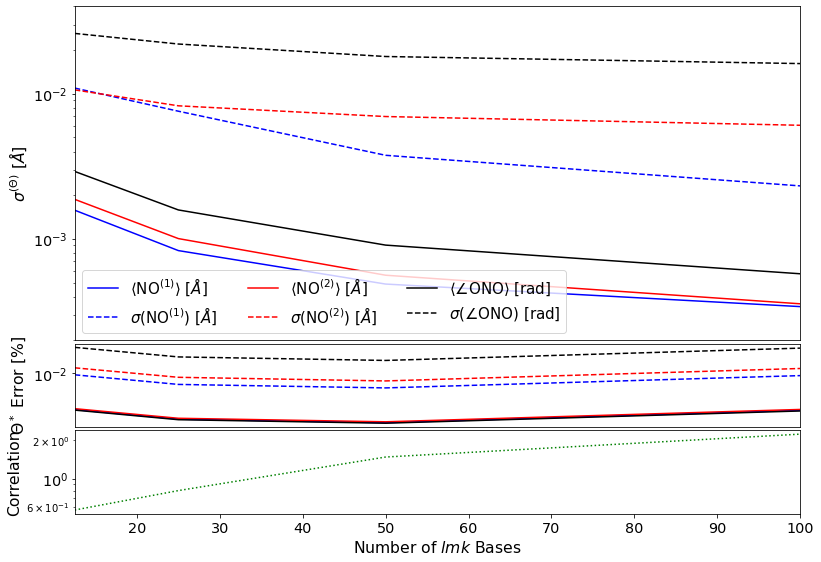

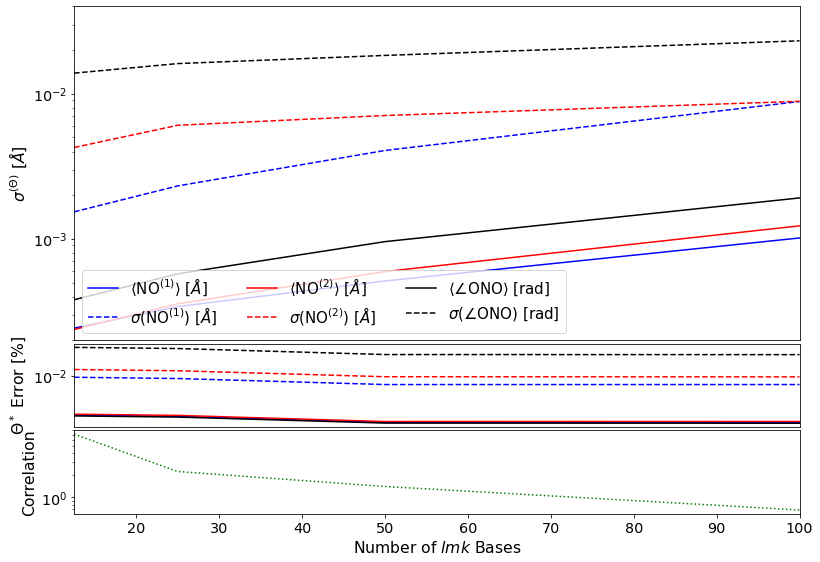

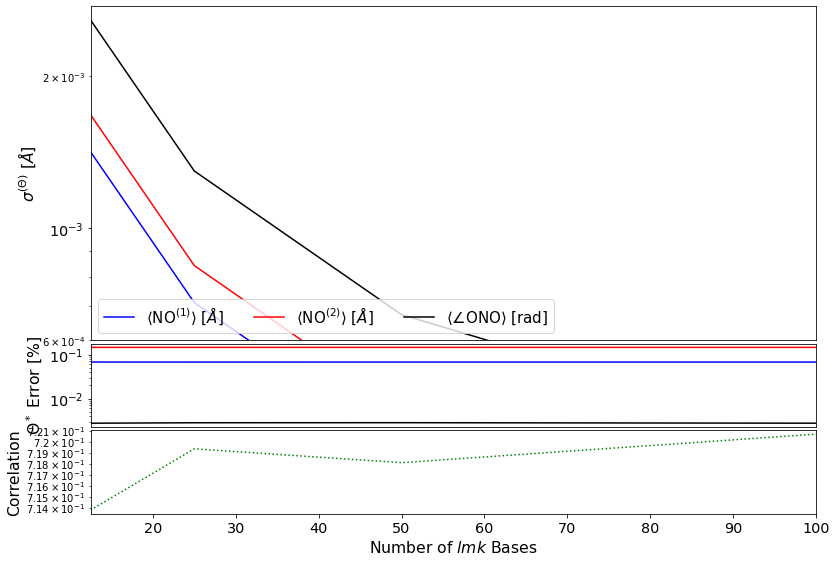

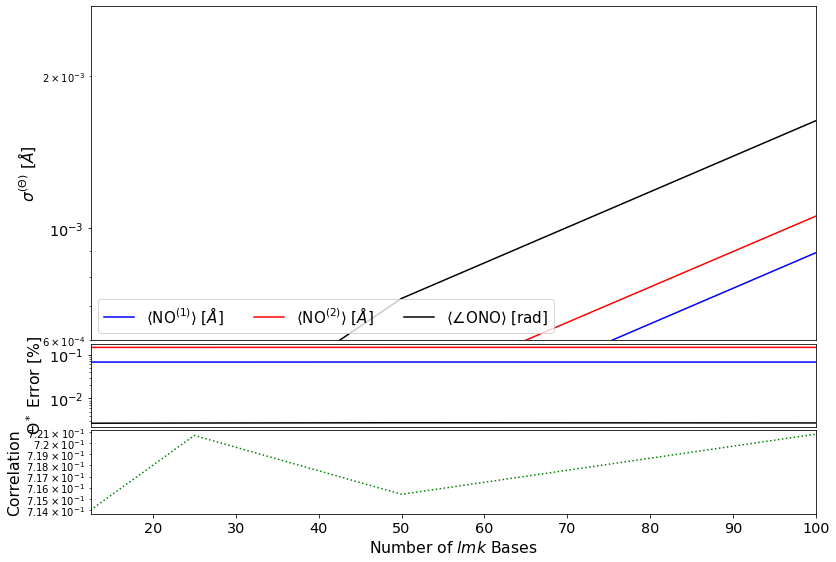

In [21]:
###########################
#####  Summary Plots  #####
###########################
clrs = ['b', 'r', 'k']

###  Precisions and Correlations  ###
for i,samples in enumerate([samples_lmk, samples_lmk_delta]):
    precs, corrs = get_precision_correlation(samples)
    if i == 0:
        precision_gauss_lmk, corrs_gauss_lmk = np.array(precs), np.array(corrs)
    else:
        precision_delta_lmk, corrs_delta_lmk = np.array(precs), np.array(corrs)

modes_gauss_fluence, modes_delta_fluence = [], []
modes_gauss_temp, modes_delta_temp = [], []
precision_gauss_fluence, precision_delta_fluence = [], []
precision_gauss_temp, precision_delta_temp = [], []
corrs_gauss_fluence, corrs_delta_fluence = [], []
corrs_gauss_temp, corrs_delta_temp = [], []
for inf in np.array(fluence_info):
    modes_gauss_fluence.append(modes_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    modes_delta_fluence.append(modes_lmk_delta[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    precision_gauss_fluence.append(precision_gauss_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    precision_delta_fluence.append(precision_delta_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    corrs_gauss_fluence.append(corrs_gauss_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    corrs_delta_fluence.append(corrs_delta_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
for inf in np.array(temp_info):
    modes_gauss_temp.append(modes_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    modes_delta_temp.append(modes_lmk_delta[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    precision_gauss_temp.append(precision_gauss_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    precision_delta_temp.append(precision_delta_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    corrs_gauss_temp.append(corrs_gauss_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])
    corrs_delta_temp.append(corrs_delta_lmk[int(np.where((lmk_info_==inf).all(axis=1))[0])])

modes_gauss_fluence, modes_delta_fluence = np.array(modes_gauss_fluence), np.array(modes_delta_fluence)
modes_gauss_temp, modes_delta_temp = np.array(modes_gauss_temp), np.array(modes_delta_temp)
precision_gauss_fluence, precision_delta_fluence = np.array(precision_gauss_fluence), np.array(precision_delta_fluence)
precision_gauss_temp, precision_delta_temp = np.array(precision_gauss_temp), np.array(precision_delta_temp)
corrs_gauss_fluence, corrs_delta_fluence = np.array(corrs_gauss_fluence), np.array(corrs_delta_fluence)
corrs_gauss_temp, corrs_delta_temp = np.array(corrs_gauss_temp), np.array(corrs_delta_temp)
    
# Plotting
for i in range(2):
    for j in range(2):
        if i == 0:
            density_model, ylim = "PDF", [2e-4, 4e-2]
            inp_range, inp_labels, inp_cn = ranges_gauss, labels_gauss, cn_gauss
            if j == 0:
                modes, prec, corrs = modes_gauss_fluence, precision_gauss_fluence, corrs_gauss_fluence
            else:
                modes, prec, corrs = modes_gauss_temp, precision_gauss_temp, corrs_gauss_temp
        else:
            density_model, ylim = "delta", [6e-4, 2.75e-3]
            modes, prec, corrs = modes_lmk_delta, precision_delta_lmk, corrs_delta_lmk
            inp_range, inp_labels, inp_cn = ranges_delta, labels_delta, cn_delta
            if j == 0:
                modes, prec, corrs = modes_delta_fluence, precision_delta_fluence, corrs_delta_fluence
            else:
                modes, prec, corrs = modes_delta_temp, precision_delta_temp, corrs_delta_temp

        if j == 0:
            x = np.array(fluence_info)[:,1]
        else:
            x = np.array(temp_info)[:,0]
        
        fig = plot_trends_single(x, prec, modes, inp_cn, "Number of $lmk$ Bases", corrs,
                labels=inp_labels, ylim=ylim, label_size=label_size, tick_size=tick_size)
        fig.savefig(os.path.join(
                    "plots", dplk["molecule"], dplk["experiment"], "sim", density_model, "trend_lmk.png"))

# Trend Plots

<ipython-input-22-d574797740fb>:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-22-d574797740fb>:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


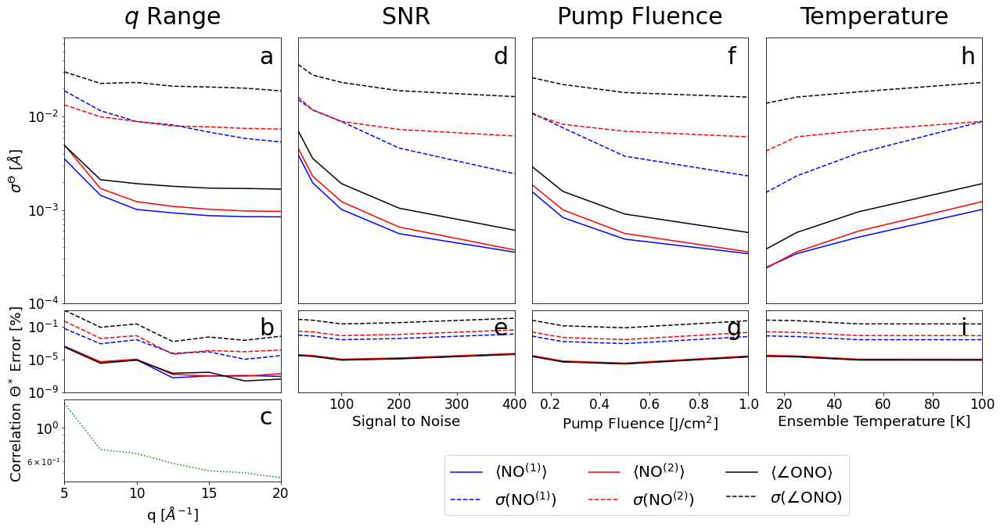

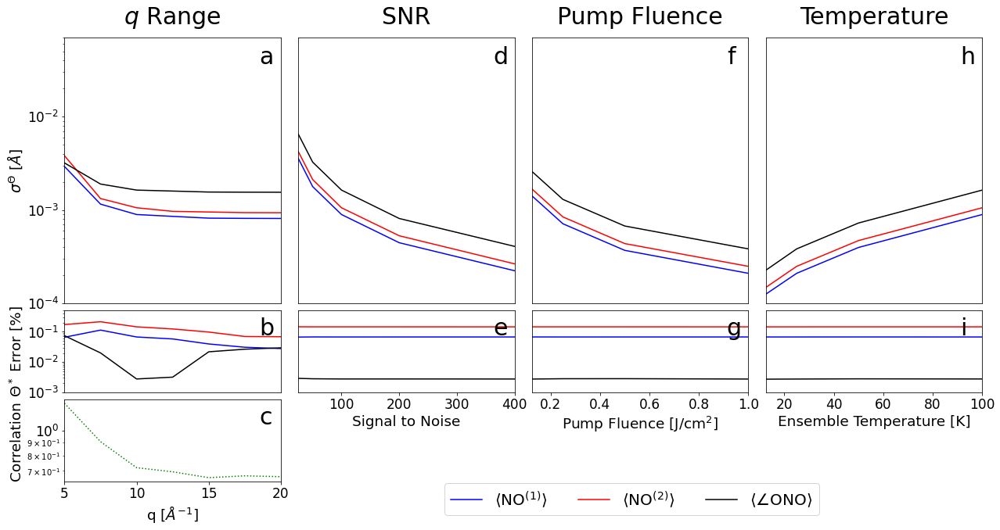

In [22]:
label_size_tp = 18.5
tick_size_tp = 17

precisions = [precision_gauss_q, precision_gauss_sn, precision_gauss_fluence, precision_gauss_temp]
modes = [modes_q, modes_sn, modes_gauss_fluence, modes_gauss_temp]
correlations = [corrs_gauss_q, corrs_gauss_sn, corrs_gauss_fluence, corrs_gauss_temp]
X = [q_max, StoN, np.array(fluence_info)[:,1]*0.01, np.array(temp_info)[:,0]]
precisions_delta = [precision_delta_q, precision_delta_sn, precision_delta_fluence, precision_delta_temp]
modes_delta = [modes_delta_q, modes_delta_sn, modes_delta_fluence, modes_delta_temp]
correlations_delta = [corrs_delta_q, corrs_delta_sn, corrs_delta_fluence, corrs_delta_temp]
samples_trend = [(precisions, modes, correlations), (precisions_delta, modes_delta, correlations_delta)]
X = [q_max, StoN, np.array(fluence_info)[:,1]*0.01, np.array(temp_info)[:,0]]
X_labels = ["q $[\AA^{-1}]$", "Signal to Noise", "Pump Fluence [J/cm$^2$]", "Ensemble Temperature [K]"]
count = 0
letters = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm']
for s, samples in enumerate(samples_trend):
    count = 0
    precs, mods, corrs = samples
    if s == 0:
        cn = cn_gauss
    else:
        cn = cn_delta
    fig, ax = plt.subplots(3, 4, figsize=(18,9.5),
        gridspec_kw={'height_ratios': [3.25, 1, 1], 'hspace':0.05, 'wspace':0.08,
                    'left':0.075, 'right': 0.98, 'top': 0.93, 'bottom': 0.1})
    for i, (prec, mode, corr, x) in enumerate(zip(precs, mods, corrs, X)):
        for j in range(prec.shape[1]):
            if s == 0:
                clr = clrs[j//2]
                lbl = labels_gauss[j]
                if j%2 == 0:
                    ltp = '-'
                else:
                    ltp = "--"
            else:
                clr = clrs[j]
                lbl = labels_delta[j]
                ltp = '-'
            lbl = lbl[:lbl.find("$ ")+1]
            
            ax[0][i].plot(x, prec[:,j], ltp+clr, label=lbl)
            ax[1][i].plot(x, 100*np.abs((mode[:,j]-cn[j])/cn[j]), ltp+clr, label=lbl)

        if i == 0:
            ax[2][i].plot(x, corr, ':g', label="Correlations")
            ax[2][i].set_xlim([x[0], x[-1]])
            ax[2][i].set_ylabel("Correlation", fontsize=label_size_tp)
            ax[2][i].set_xlabel(X_labels[i], fontsize=label_size_tp)
            ax[2][i].tick_params(axis='x', labelsize=tick_size_tp)
            #ax[2][i].legend(loc='upper right', fontsize=15,
            #           bbox_transform=plt.gcf().transFigure)
            ax[0][i].set_ylabel("$\sigma^{\Theta}$ $[\AA]$", fontsize=label_size_tp)
            ax[1][i].set_ylabel("$\Theta^*$ Error [%]", fontsize=label_size_tp)
            ax[2][i].tick_params(axis='y', labelsize=tick_size_tp)
            #ax[2][i].yaxis.set_major_formatter(ticker.NullFormatter())
            #ax[2][i].yaxis.set_ticklabels([1])
            ax[2][i].set_yscale('log')
            ax[0][i].xaxis.set_visible(False)
            ax[1][i].xaxis.set_visible(False)
        else:
            ax[2][i].set_visible(False)
            ax[0][i].yaxis.set_visible(False)
            ax[1][i].yaxis.set_visible(False)
            ax[0][i].xaxis.set_visible(False)
            ax[1][i].set_xlabel(X_labels[i], fontsize=label_size_tp)
            ax[1][i].tick_params(axis='x', labelsize=tick_size_tp)      


        ax[0][i].set_xlim([x[0], x[-1]])
        ax[1][i].set_xlim([x[0], x[-1]])

        ax[0][i].tick_params(axis='y', labelsize=tick_size_tp)
        ax[0][i].set_yscale('log')
        ax[0][i].set_ylim([1e-4, 7e-2])
        if s == 0:
            ax[1][i].set_ylim([1e-9, 10])
        else:
            ax[1][i].set_ylim([1e-3, 0.5])
        ax[1][i].tick_params(axis='y', labelsize=tick_size_tp)
        ax[1][i].set_yscale('log')

        for j in range(3):
            if j == 2 and i != 0:
                continue
            if j == 0:
                y_ = 0.9
            else:
                y_ = 0.7
            ax[j][i].text(0.9, y_, letters[count], fontsize=30, transform=ax[j][i].transAxes)
            count += 1


    ax[1][1].legend(loc='lower left', fontsize=20,
            ncol=3, bbox_to_anchor=(0.64, -1.6, 2.5, 0.1))
    tfont_size = 30
    ax[0][0].text(0.5, 1.05, r"$q$ Range", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][0].transAxes)
    ax[0][1].text(0.5, 1.05, r"SNR", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][1].transAxes)
    ax[0][2].text(0.5, 1.05, r"Pump Fluence", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][2].transAxes)
    ax[0][3].text(0.5, 1.05, r"Temperature", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][3].transAxes)
    if s == 0:
        dense_model = "PDF"
    else:
        dense_model = "delta"
    fig.savefig(os.path.join("plots", input_data_parameters["molecule"], data_parameters["experiment"],
            "sim", dense_model, "trends_q_sn_lmk.png"))
    
    plt.tight_layout()

<ipython-input-23-11e68cad9469>:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-23-11e68cad9469>:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


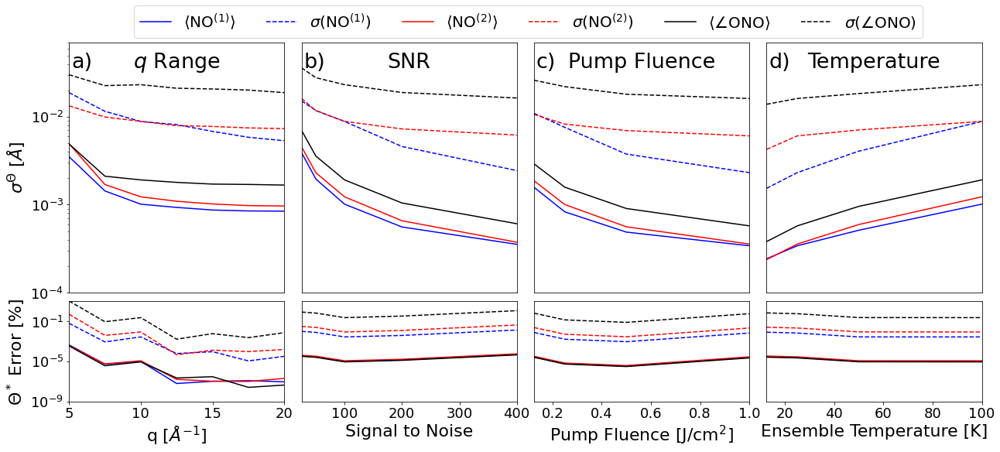

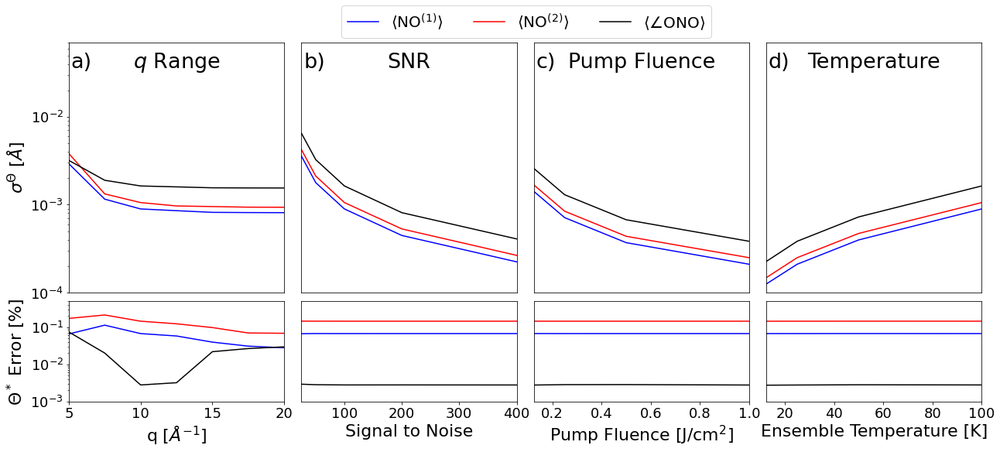

In [23]:
label_size_tp = 22
tick_size_tp = 18

precisions = [precision_gauss_q, precision_gauss_sn, precision_gauss_fluence, precision_gauss_temp]
modes = [modes_q, modes_sn, modes_gauss_fluence, modes_gauss_temp]
correlations = [corrs_gauss_q, corrs_gauss_sn, corrs_gauss_fluence, corrs_gauss_temp]
X = [q_max, StoN, np.array(fluence_info)[:,1]*0.01, np.array(temp_info)[:,0]]
precisions_delta = [precision_delta_q, precision_delta_sn, precision_delta_fluence, precision_delta_temp]
modes_delta = [modes_delta_q, modes_delta_sn, modes_delta_fluence, modes_delta_temp]
correlations_delta = [corrs_delta_q, corrs_delta_sn, corrs_delta_fluence, corrs_delta_temp]
samples_trend = [(precisions, modes, correlations), (precisions_delta, modes_delta, correlations_delta)]
X = [q_max, StoN, np.array(fluence_info)[:,1]*0.01, np.array(temp_info)[:,0]]
X_labels = ["q $[\AA^{-1}]$", "Signal to Noise", "Pump Fluence [J/cm$^2$]", "Ensemble Temperature [K]"]
count = 0
letters = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm']
for s, samples in enumerate(samples_trend):
    count = 0
    precs, mods, corrs = samples
    if s == 0:
        cn = cn_gauss
    else:
        cn = cn_delta
    fig, ax = plt.subplots(2, 4, figsize=(18,8),
        gridspec_kw={'height_ratios': [2.5, 1], 'hspace':0.05, 'wspace':0.08,
                    'left':0.07, 'right': 0.98, 'top': 0.905, 'bottom': 0.1})
    for i, (prec, mode, corr, x) in enumerate(zip(precs, mods, corrs, X)):
        for j in range(prec.shape[1]):
            if s == 0:
                clr = clrs[j//2]
                lbl = labels_gauss[j]
                if j%2 == 0:
                    ltp = '-'
                else:
                    ltp = "--"
            else:
                clr = clrs[j]
                lbl = labels_delta[j]
                ltp = '-'
            lbl = lbl[:lbl.find("$ ")+1]
            
            ax[0][i].plot(x, prec[:,j], ltp+clr, label=lbl)
            ax[1][i].plot(x, 100*np.abs((mode[:,j]-cn[j])/cn[j]), ltp+clr, label=lbl)

        if i == 0:
            ax[0][i].set_ylabel("$\sigma^{\Theta}$ $[\AA]$", fontsize=label_size_tp)
            ax[1][i].set_ylabel("$\Theta^*$ Error [%]", fontsize=label_size_tp)
            ax[0][i].xaxis.set_visible(False)
        else:
            ax[0][i].yaxis.set_visible(False)
            ax[1][i].yaxis.set_visible(False)
            ax[0][i].xaxis.set_visible(False)
        ax[1][i].set_xlabel(X_labels[i], fontsize=label_size_tp)
        ax[1][i].tick_params(axis='x', labelsize=tick_size_tp)      


        ax[0][i].set_xlim([x[0], x[-1]])
        ax[1][i].set_xlim([x[0], x[-1]])

        ax[0][i].tick_params(axis='y', labelsize=tick_size_tp)
        ax[0][i].set_yscale('log')
        #ax[0][i].set_xscale('log')
        ax[0][i].set_ylim([1e-4, 7e-2])
        if s == 0:
            ax[1][i].set_ylim([1e-9, 10])
        else:
            ax[1][i].set_ylim([1e-3, 0.5])
        ax[1][i].tick_params(axis='y', labelsize=tick_size_tp)
        ax[1][i].set_yscale('log')
        #ax[1][i].set_xscale('log')

        for j in range(2):
            if j > 0:
                continue
            if j == 2 and i != 0:
                continue
            if j == 0:
                y_ = 0.9
            else:
                y_ = 0.7
            ax[j][i].text(0.01, y_, letters[count]+")", fontsize=27, transform=ax[j][i].transAxes)
            count += 1


    
    
    tfont_size = 27
    ax[0][0].text(0.5, 0.9, r"$q$ Range", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][0].transAxes)
    ax[0][1].text(0.5, 0.9, r"SNR", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][1].transAxes)
    ax[0][2].text(0.5, 0.9, r"Pump Fluence", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][2].transAxes)
    ax[0][3].text(0.5, 0.9, r"Temperature", fontsize=tfont_size, horizontalalignment='center', transform=ax[0][3].transAxes)
    if s == 0:
        dense_model = "PDF"
        ax[0][1].legend(loc='upper right', fontsize=20,
            ncol=6, bbox_to_anchor=(0.42, 1.08, 2.5, 0.1))
    else:
        dense_model = "delta"
        ax[0][0].legend(loc='upper right', fontsize=20,
            ncol=3, bbox_to_anchor=(0.52, 1.08, 2.5, 0.1))
    fig.savefig(os.path.join("plots", input_data_parameters["molecule"], data_parameters["experiment"],
            "sim", dense_model, "trends_q_sn_lmk.png"))
    
    plt.tight_layout()

## Time Dependent Anisotropy

In [32]:
bases_dict, norms_dict = {}, {}
Ls_dict, Ms_dict = {}, {}
LMK_dict, times_dict = {}, {}
fluence_info_plot = [[25, 12.5], [25, 25], [25, 50], [25, 100]]
temp_info_plot = [[12.5, 100], [25, 100], [50, 100], [100, 100]]
lmk_info_plot = []
for inf in fluence_info_plot:
    if inf not in lmk_info_plot:
        lmk_info_plot.append(inf)
for inf in temp_info_plot:
    if inf not in lmk_info_plot:
        lmk_info_plot.append(inf)

for inf in lmk_info_plot:
    ii = tuple(inf)
    bases_dict[ii] = {}
    norms_dict[ii] = {}
    LMK_dict[ii], Ls_dict[ii] = [], []
    Ms_dict[ii] = defaultdict(list)
    folder = os.path.join("/cds/group/ued/scratch/khegazy/TeDDE/axis_distributions/NO2/ADMs",
            "temp-{}K".format(inf[0]), "10TW_{}fs".format(inf[1]))
    with open(os.path.join(folder, "times.npy"), "rb") as file:
        times_dict[ii] = np.load(file)
    files = glob.glob(os.path.join(folder, "*.npy"))
    for fl in files:
        if "times" in fl:
            continue
        L = int(fl[-6])
        M = int(fl[-5])
        if L not in Ls_dict[ii]:
            Ls_dict[ii].append(L)
        Ms_dict[ii][L].append(M)
        with open(fl, "rb") as file:
            bases_dict[ii][(L,M)] = np.load(file)
        if M != 0:
            bases_dict[ii][(L,M)] *= 2
    basisList = []
    normsList = []
    Ls_dict[ii].sort()
    for l in Ls_dict[ii]:
        for m in np.sort(Ms_dict[ii][l]):
            basisList.append(np.expand_dims(bases_dict[ii][(l,m)], axis=0))
            LMK_dict[ii].append(np.array([l,0,m], dtype=int))

    bases_dict[ii] = np.concatenate(basisList, axis=0)


    ## Create evenly spaced values
    #if bases_dict[ii].shape[-1] > 1:
    #    bases_interp = interp1d(times_dict[ii], bases_dict[ii], axis=-1, kind='cubic')
    #    times_dict[ii] = np.linspace(times_dict[ii][0], times_dict[ii][-1], 1000)
    #    bases_dict[ii] = bases_interp(times_dict[ii])

(25, 12.5)
(25, 25)
(25, 50)
(25, 100)
(12.5, 100)
(25, 100)
(50, 100)
(100, 100)


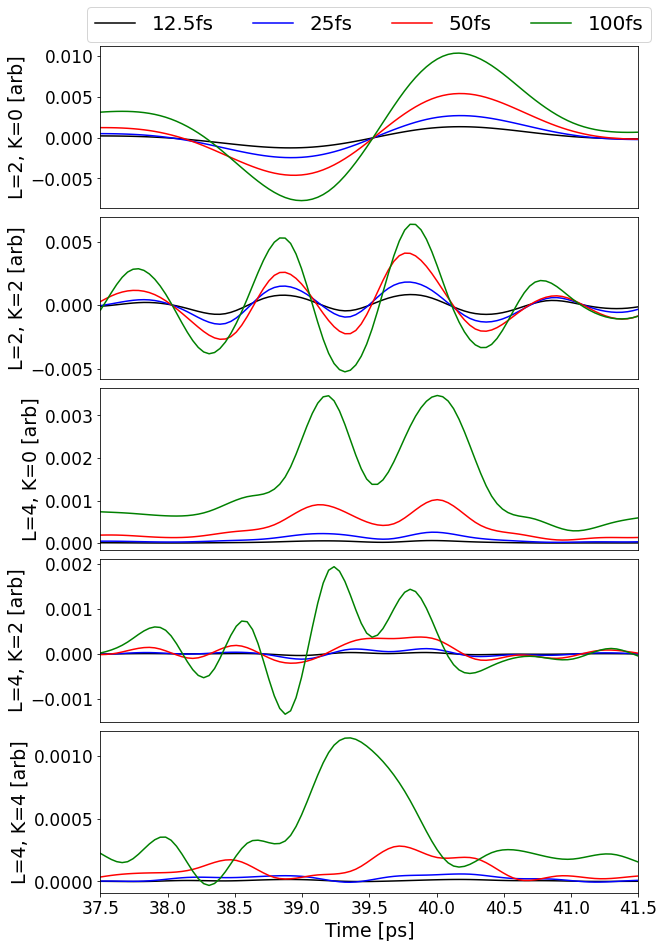

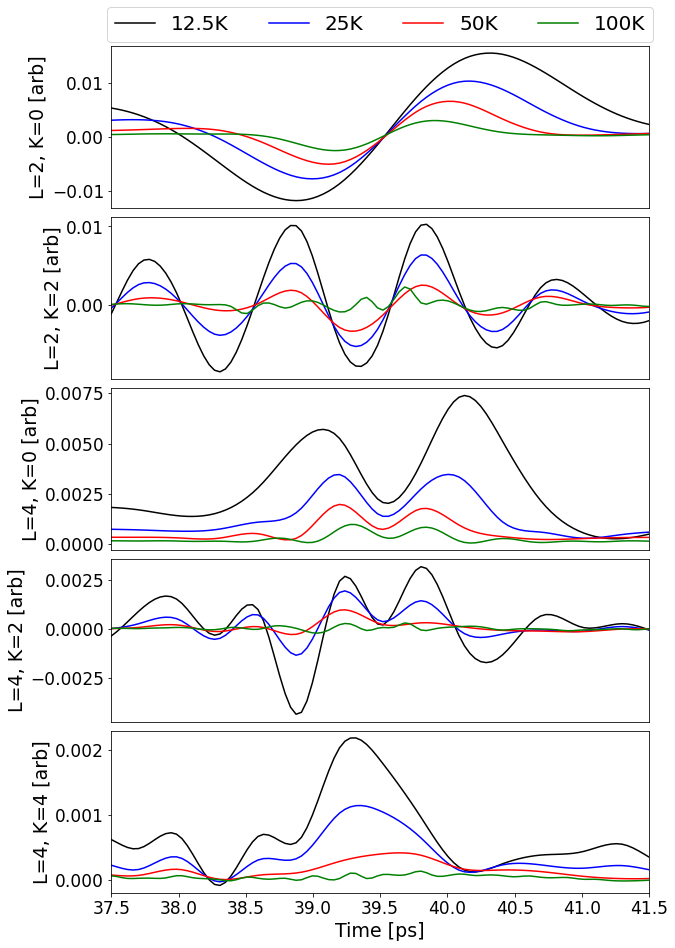

In [33]:
N_bases = 5
label_size, tick_size = 19, 17
cl_bases = ['k', 'b', 'r', 'g', 'teal']
tms = data_parameters["ADM_params"]["eval_times"]
for inn, info in enumerate([fluence_info_plot, temp_info_plot]):
    fig, axs = plt.subplots(N_bases, 1, figsize=(9,13),
        gridspec_kw={'hspace':0.055, 'wspace':0.02,
                    'left':0.15, 'right': 0.98, 'top': 0.955, 'bottom': 0.05})
    for iin,inf in enumerate(info):
        ii = tuple(inf)
        print(ii)
        if inn == 0:
            lbl = "{}fs".format(ii[1])
        else:
            lbl = "{}K".format(ii[0])
        for i in range(N_bases):
            #print(ii,times_dict[ii].shape, bases_dict[ii][i].shape)
            bs_interp = interp1d(times_dict[ii], bases_dict[ii][i], axis=-1, kind='cubic')
            axs[i].plot(tms, bs_interp(tms),
                        color=cl_bases[iin], label=lbl)
        for i in range(len(axs)):
            axs[i].set_xlim(tms[0], tms[-1])
            axs[i].set_ylabel("L={}, K={} [arb]".format(LMK_dict[ii][i][0], LMK_dict[ii][i][2]), fontsize=label_size)
            axs[i].tick_params(axis='y', labelsize=tick_size)
            if i != len(axs)-1:
                axs[i].xaxis.set_visible(False)
        axs[-1].set_xlabel("Time [ps]", fontsize=label_size)
        axs[-1].tick_params(axis='x', labelsize=tick_size)
    
    axs[0].legend(loc='upper center', fontsize=20,
        ncol=4, bbox_to_anchor=(0.15, 1.2, 0.7, 0.1))
    if inn == 0:
        fig.savefig("./plots/ADMs_fluence.png")
    else:
        fig.savefig("./plots/ADMs_temperature.png")

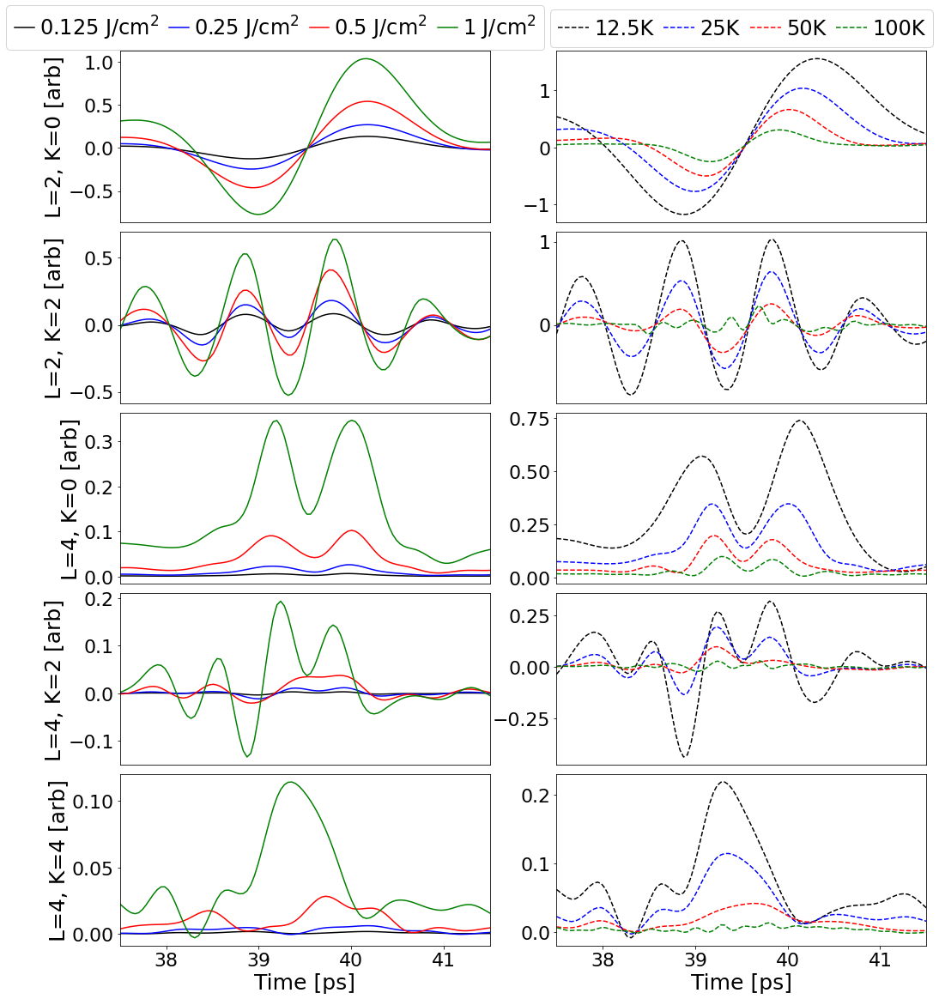

In [34]:
N_bases = 5
label_size, tick_size = 25, 22
cl_bases = ['k', 'b', 'r', 'g', 'teal']
tms = data_parameters["ADM_params"]["eval_times"]
fig, axs = plt.subplots(N_bases, 2, figsize=(15,16),
    gridspec_kw={'hspace':0.055, 'wspace':0.18,
                'left':0.11, 'right': 0.98, 'top': 0.955, 'bottom': 0.05})
for inn, info in enumerate([fluence_info_plot, temp_info_plot]):

    for iin,inf in enumerate(info):
        ii = tuple(inf)
        if inn == 0:
            n = str(ii[1]*0.01)
            if n[-1] == "0":
                n = n[:n.find(".")]
            lbl = "{} J/cm$^2$".format(n)
            fmt = '-'
        else:
            lbl = "{}K".format(ii[0])
            fmt = '--'
        for i in range(N_bases):
            bs_interp = interp1d(times_dict[ii], bases_dict[ii][i]*100, axis=-1, kind='cubic')
            axs[i][inn].plot(tms, bs_interp(tms), fmt,
                        color=cl_bases[iin], label=lbl)
        for i in range(len(axs)):
            axs[i][inn].set_xlim(tms[0], tms[-1])
            axs[i][inn].tick_params(axis='y', labelsize=tick_size)
            if inn == 0:
                axs[i][inn].set_ylabel("L={}, K={} [arb]".format(LMK_dict[ii][i][0], LMK_dict[ii][i][2]), fontsize=label_size)
            if i != len(axs)-1:
                axs[i][inn].xaxis.set_visible(False)
        axs[-1][inn].set_xlabel("Time [ps]", fontsize=label_size)
        axs[-1][inn].tick_params(axis='x', labelsize=tick_size)
    

    #axs[0][0].text(0.8, 0.09, r'$\times 10^5$', fontsize=25, transform=axs[0][0].transAxes)
    #axs[0][1].text(0.8, 0.09, r'$\times 10^3$', fontsize=25, transform=axs[0][1].transAxes)
    if inn == 0:
        axs[0][inn].legend(loc='upper center', fontsize=24,
            ncol=4, columnspacing=0.5, handletextpad=0.25, handlelength=0.95, bbox_to_anchor=(0.32, 1.225, 0.2, 0.1))
    else:
        axs[0][inn].legend(loc='upper center', fontsize=24,
            ncol=4, columnspacing=0.5, handletextpad=0.25, handlelength=1.5, bbox_to_anchor=(0.4, 1.2, 0.2, 0.1))
    fig.savefig("./plots/ADMs_fluence_temp.png")


2 0 0


<ipython-input-35-9c950848f6e9>:48: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  D_ME = np.exp(np.complex(0,-1)*m*phi_ea)*d*np.exp(np.complex(0,-1)*k*chi_ea)


2 0 2
4 0 0
4 0 2
4 0 4
6 0 0
6 0 2
6 0 4
6 0 6
8 0 0
8 0 2
8 0 4
8 0 6
8 0 8


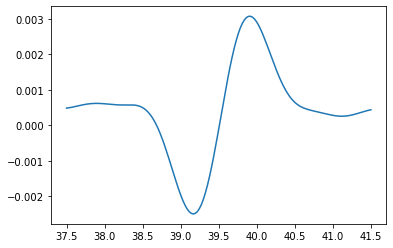

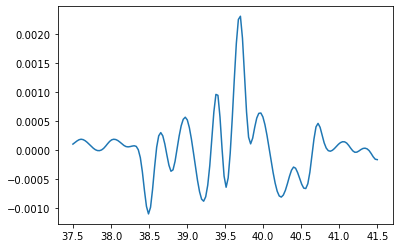

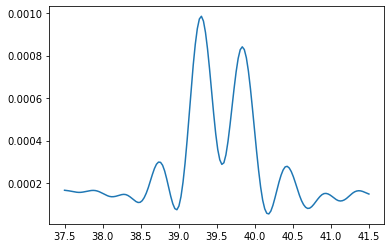

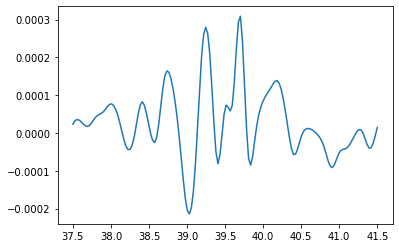

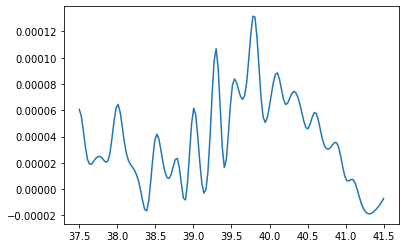

...

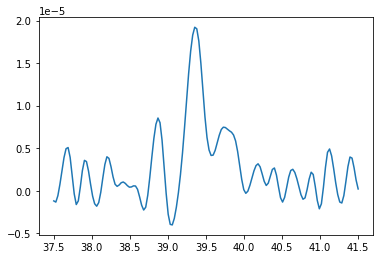

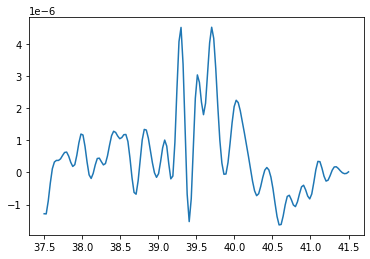

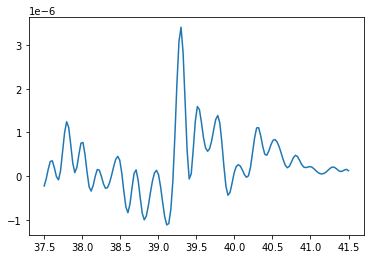

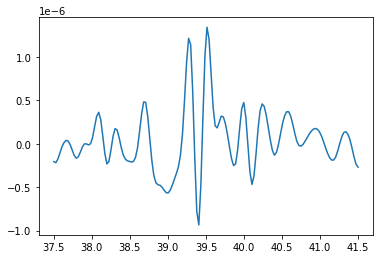

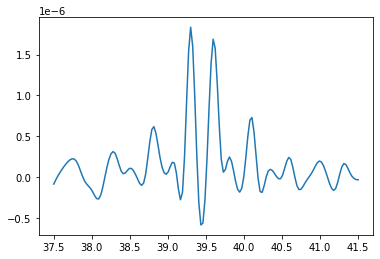

In [35]:
import subprocess
from collections import defaultdict
from scipy.special import factorial, jacobi

def nCk_np(n, k):
    return factorial(n)/(factorial(k)*factorial(n-k))

def get_wignerD_3d(phi_ea, theta_ea, chi_ea, l, m, k):
    # Return array of D matrices with L, M, K as l, [-l, l], m
    # Calculation based off of below derivation
    # https://en.wikipedia.org/wiki/Wigner_D-matrix#Wigner_(small)_d-matrix

    m = np.expand_dims(m, 0)
    phi_ea    = np.expand_dims(phi_ea, axis=-1)
    theta_ea  = np.expand_dims(theta_ea, axis=-1)
    chi_ea    = np.expand_dims(chi_ea, axis=-1)

    k_array = np.array([l+k, l-k, l, l], dtype=int)
    k_matrix = np.tile(np.expand_dims(k_array, -1), m.shape[1])

    k_matrix[2,:] += m[0]
    k_matrix[3,:] -= m[0]

    a_array = np.array([-1*k, k, k, -1*k])
    a_matrix = np.tile(np.expand_dims(a_array, -1), m.shape[1])
    a_matrix += np.array([[1,-1,-1,1]]).transpose()*m

    k_inds = np.argmin(k_matrix, axis=0)
    k_, a = np.zeros_like(m), np.zeros_like(m)
    ii = np.arange(k_inds.shape[0])
    k_[0,:] = k_matrix[k_inds[ii],ii]
    a[0,:] = a_matrix[k_inds[ii],ii]
    b = 2*l - 2*k_ - a
    lmbd = (m - k)*np.maximum(0, (1-(k_inds%3)))

    # Calculate little d
    d_coeff = (-1)**lmbd*np.sqrt(nCk_np(2*l-k_, k_+a))/np.sqrt(nCk_np(k_+b, b))\
      *np.sin(theta_ea/2)**a*np.cos(theta_ea/2)**b
    d = np.zeros_like(d_coeff)
    cos_theta = np.cos(theta_ea)
    jac = []
    for im in range(m.shape[-1]):
        p = jacobi(k_[0,im], a[0,im], b[0,im])
        jac.append(np.polyval(p, cos_theta)[:,0])
        d[:,im] = d_coeff[:,im]*np.polyval(p, cos_theta)[:,0]

    # Calculate D matrix element
    D_ME = np.exp(np.complex(0,-1)*m*phi_ea)*d*np.exp(np.complex(0,-1)*k*chi_ea)

    return D_ME.transpose().astype(np.complex64)


ani_key = (100, 100)
bases_interp = interp1d(times_dict[ani_key], bases_dict[ani_key], axis=-1, kind='cubic')
times = np.linspace(37.5, 41.5, 150)
bases = bases_interp(times)
for i, (L, M, K) in enumerate(LMK_dict[ani_key]):
    fig, ax = plt.subplots()
    ax.plot(times, bases[i])

   
    
N = 150
phi = np.linspace(0, 2*np.pi, N+1)[:-1] + 2*np.pi/(2*N)
theta = np.linspace(0, np.pi, N+1)[:-1] + np.pi/(2*N)
chi = np.linspace(0, 2*np.pi, N+1)[:-1] + 2*np.pi/(2*N)
angles = np.zeros((N,N,N,3))
for i in range(N):
    angles[i,:,:,0]  = phi[i]
    for k in range(N):
        angles[:,k,:,1] = theta[k]
        angles[i,k,:,2]  = chi

angles = np.reshape(angles, (N**3, 3))


wigD_eval = []
for (l,m,k) in LMK_dict[ani_key]:
    print(l,m,k)
    #if l > 2:
    #    break
    wigD_eval.append((2*l + 1)/(8*np.pi**2)*get_wignerD_3d(angles[:,0], angles[:,1], angles[:,2], l, [m], k))
    
wigD_eval = np.reshape(np.array(wigD_eval), (len(wigD_eval), N, N, N))


In [36]:
jac_th = np.expand_dims(np.ones((1,1,len(theta)))*np.sin(theta), -1)
dphi, dtheta, dchi = 2*np.pi/N, np.pi/N, 2*np.pi/N
print("SHAPES",wigD_eval.shape, jac_th.shape, np.reshape(theta, (1,1,-1,1,1)).shape)
exp_phi = np.sum(np.sum(wigD_eval*jac_th*dtheta*dchi, 3), 2)
exp_theta = np.sum(np.sum(wigD_eval*dphi*dchi, 3), 1)
exp_chi = np.sum(np.sum(wigD_eval*jac_th*dtheta*dphi, 2), 1)

print(exp_theta.shape)
exp_phi = np.expand_dims(exp_phi, -1)*np.expand_dims(bases, 1)
exp_theta = np.expand_dims(exp_theta, -1)*np.expand_dims(bases, 1)
exp_chi = np.expand_dims(exp_chi, -1)*np.expand_dims(bases, 1)

print(exp_theta.shape)
# Sum over bases and add in D000
iso_val = np.array([(2*2*np.pi)/(8*np.pi**2), (2*2*np.pi)/(8*np.pi**2), (2*np.pi)**2/(8*np.pi**2)])
exp_phi = np.sum(exp_phi, 0) + iso_val[0]
exp_chi = np.sum(exp_chi, 0) + iso_val[1]
exp_theta = np.sum(exp_theta, 0) + iso_val[2]#*np.expand_dims(jac_th[0,0,:,0], -1)

print(exp_chi.shape)
angles = np.array([phi, chi, theta])
exp_angles = np.array([exp_phi, exp_chi, exp_theta])

SHAPES (14, 150, 150, 150) (1, 1, 150, 1) (1, 1, 150, 1, 1)
(14, 150)
(14, 150, 150)
(150, 150)


done
what's good
done


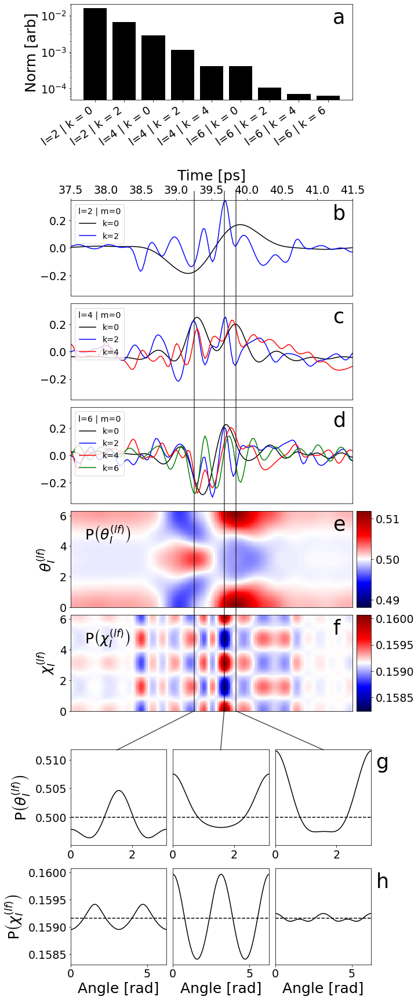

In [37]:
axs = []
eval_times = [39.05, 39.25, 39.68, 39.85, 40.05]
eval_times = [39.25, 39.68, 39.85]
dfrctn = []
label_size = 25
tick_size = 19
ADM_col = ['k','b', 'r', 'g']
xl, yl = 0.93, 0.8
plt_label_size = 35

if False:
    for tm in eval_times:
        fName = os.path.join("output", "NO2_sim_diffraction-analytic_Qmax-15_time-{0:.6g}.h5".format(float(tm)))
        print(fName)
        if not os.path.exists(fName):
            #p = subprocess.run(["python3", "../diffraction.py", "--molecule", "NO2", "--calculation_type", "analytic",
            #                "--xyz_file", "NO2.xyz", "--basis_folder", 
            #                "/cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K",
            #                "--eval_time", str(tm)], check=True, stdout=subprocess.PIPE)
            pp = subprocess.run("python ../diffraction.py --molecule NO2 --calculation_type analytic --xyz_file NO2.xyz --basis_folder /cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K --eval_time {}".format(tm),
                            shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            print(pp.stdout)
            print(pp.stderr)
            #p.wait()
            #os.system("python3 ../diffraction.py --molecule NO2 --calculation_type analytic --xyz_file NO2.xyz --basis_folder /cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K --eval_time {}".format(tm))
            print("python3 ../diffraction.py --molecule NO2 --calculation_type analytic --xyz_file NO2.xyz --basis_folder /cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K --eval_time {}".format(tm))
            if not os.path.exists(fName):
                print("FAILED TO MAKE " + fName)
                sys.exit(0)

        with h5py.File(fName, "r") as h5:
            dfrctn.append(h5["mod_diffraction"][:])
            q = h5["q"][:]
    dfrctn = np.array(dfrctn)
    sz = q.shape[-1]//2
    q = q[sz:,sz:]
    dfrctn = dfrctn[:,sz:,sz:]
    dfrctn /= np.max([np.abs(np.amin(dfrctn)), np.amax(dfrctn)])
        #h5.close()



top_pad = 0.01
bot_pad = 0.045
vert_pad = 0.0075
vert_dim = (1 - (bot_pad + top_pad + 26*vert_pad))/8

horz_pad = 0.015
left_pad = 0.17
right_pad = 0.11
cbar_pad = 0.01
cbar_sz = 0.035
horz_dim = (1 - (left_pad + right_pad + 2*horz_pad))/3

fig_ratio = vert_dim/horz_dim
fig = plt.figure(figsize=(10,10/fig_ratio))


vert_anch = []
extra_v = 0
for v in range(8):
    if v == 1:
        extra_v += 2
    if v == 2:
        extra_v += 4
    if v == 7:
        extra_v += 12
    
    vert_anch.append(bot_pad + v*(vert_pad + vert_dim) + extra_v*vert_pad)
            
horz_anch = []
for h in range(len(eval_times)):
    horz_anch.append(left_pad + (horz_dim + horz_pad)*h)

caxs = []
rr = 0
for v in range(8):
    if v >= 2:
        axs.append(fig.add_axes((left_pad, vert_anch[v], 1-(left_pad+right_pad+cbar_pad+cbar_sz), vert_dim)))
        if v < 4:
            caxs.append(fig.add_axes((1-(right_pad+cbar_sz), vert_anch[v], cbar_sz, vert_dim)))
        continue
    else:
        axs.append([])
        for h in range(len(eval_times)):
            axs[v].append(fig.add_axes((horz_anch[h], vert_anch[v], horz_dim, vert_dim)))
        #caxs.append(fig.add_axes((horz_anch[cc]+horz_dim+0.1*right_pad, vert_anch[rr], right_pad*0.2, vert_dim)))
        #rr += 1

###  Filling Plots  ###
tInds = []
for t in eval_times:
    tInds.append(np.argmin(np.abs(times-t)))

lines_list = []
exp_labels = ['\phi', '\chi', '\\theta']
X_tm,Y_tm = np.meshgrid(np.append(times-(times[1]-times[0])/2, [times[-1]+(times[1]-times[0])/2]), np.linspace(0, 2*np.pi, N+1))
rng = []
for i in range(len(angles)):
    rng.append([])
    if v == 0:
        rng[-1].append(1./(2*np.pi) - 0.001)
        rng[-1].append(1./(2*np.pi) + 0.001)
    else:
        rng[-1].append(np.amin(np.real(exp_angles[i,:,:]))*0.9995)
        rng[-1].append(np.amax(np.real(exp_angles[i,:,:]))*1.0005)
rng = np.array(rng)


# Plot bases
norms = []
norm_ticks = []
for bs,lmk in zip(bases, LMK_dict[ani_key]):
    if lmk[0] <= 6:
        mn = np.mean(bs)
        nrm = np.sqrt(np.sum((bs-mn)**2))
        norms.append(nrm)
        norm_ticks.append("l={} | k = {}".format(lmk[0], lmk[-1]))
        axs[8-lmk[0]//2-1].plot(times, (bs-mn)/nrm,
            color=ADM_col[lmk[-1]//2], label="k={}".format(lmk[-1]))
        axs[8-lmk[0]//2-1].set_xlim([times[0], times[-1]])
        axs[8-lmk[0]//2-1].set_ylim([-0.35, 0.35])
        axs[8-lmk[0]//2-1].xaxis.set_visible(False)
        #axs[8-lmk[0]//2-1].set_ylabel("Anisotropy [arb]", fontsize=label_size)
        axs[8-lmk[0]//2-1].tick_params(axis='y', labelsize=tick_size)
plt_labels = ['b', 'c', 'd']
for i in range(3):
    axs[-1*(i+2)].legend(title="l={} | m=0".format((i+1)*2), loc='upper left',
            fontsize=tick_size*3/4, title_fontsize=tick_size*3/4)
    axs[-1*(i+2)].text(xl, yl, plt_labels[i], fontsize=plt_label_size, transform=axs[-1*(i+2)].transAxes)
axs[-1].bar(np.arange(len(norms)), norms, color='k', align='center', log=True)
axs[-1].tick_params(axis='y', labelsize=tick_size)
axs[-1].set_ylabel("Norm [arb]", fontsize=label_size)
axs[-1].set_xticks(np.arange(len(norms)))
axs[-1].set_xticklabels(norm_ticks, fontsize=tick_size, rotation=35, ha="right")
axs[-1].text(xl, yl, "a", fontsize=plt_label_size, transform=axs[-1].transAxes)

for v in range(4):
    if v < 2:
        hrz_ln = 1./(2*np.pi)
        if v == 1:
            hrz_ln = 0.5

        if v == 1:
            axs[v][0].set_ylabel(r"P$\left( \theta^{(lf)}_I \right)$", fontsize=label_size)
        else:
            axs[v][0].set_ylabel(r"P$\left( \chi^{(lf)}_I \right)$", fontsize=label_size)
        
        for h, itm in enumerate(tInds):
            axs[v][h].plot(angles[v+1], np.real(exp_angles[v+1,:,itm]), '-k')
            axs[v][h].set_ylim(rng[v+1])
            axs[v][h].set_xlim([0, angles[v+1][-1]])
            axs[v][h].axhline(hrz_ln, color='k', linestyle='--')
            axs[v][h].tick_params(axis='y', labelsize=tick_size)
            axs[v][h].tick_params(axis='x', labelsize=tick_size)
            if h > 0:
                axs[v][h].yaxis.set_visible(False)
            if v == 1:
                axs[v][h].set_xlabel("", fontsize=0)
            if v == 0:
                axs[v][h].set_xlabel("Angle [rad]", fontsize=label_size)
        plt_labels = ['h', 'g']
        axs[v][h].text(1.05, yl, plt_labels[v-2], fontsize=plt_label_size, transform=axs[v][h].transAxes)
    
    else:
        if v == 0:
            rng_max = hrz_ln + 0.001
            rng_min = hrz_ln - 0.001
        if v == 5:
            Y_tm_ = Y_tm/2
        else:
            Y_tm_ = Y_tm
        drng = np.amax(np.abs(rng[v-1]-iso_val[v-1]))
        pcm = axs[v].pcolormesh(X_tm, Y_tm_, np.real(exp_angles[int(v-1),:,:]),
                    cmap='seismic', vmin=iso_val[v-1]-drng, vmax=iso_val[v-1]+drng)
        axs[v].xaxis.set_visible(False)
        cbar = fig.colorbar(pcm, cax=caxs[v-2])
        cbar.ax.tick_params(labelsize=int(tick_size))
        if v != 3:
            tm_pos = [38.15, 39.63, 41.1]
            for itm,tm in enumerate(eval_times):
                """
                transFigure = fig.transFigure.inverted()
                coord1 = transFigure.transform(axs[v].transData.transform([tm,1]))
                coord2 = transFigure.transform(axs[v].transData.transform([tm,5]))


                fig.lines.append(matplotlib.lines.Line2D((coord1[0],coord2[0]),(coord1[1],coord2[1]),
                               transform=fig.transFigure))
                """
                #axs[v].add_line(matplotlib.lines.Line2D((tm,tm), (-0.05,15)))
                #axs[v].axvline(tm, -0.5, 1, color='k')
                lines_list.append(lines.Line2D([tm, tm], [0, 34.0], transform=axs[v].transData, figure=fig,
                        color='k', alpha=0.7))
                lines_list.append(lines.Line2D([tm, tm_pos[itm]], [0, -2.55], transform=axs[v].transData, figure=fig,
                        color='k', alpha=0.7))
        
        else:
            print("what's good")
            #axs[v].xaxis.tick_top()
            #axs[v].xaxis.set_label_position('top')
            #axs[v].set_xlabel("Time [ps]", fontsize=label_size)
        plt_labels = ['f', 'e']
        axs[v].text(xl, yl, plt_labels[v-2], fontsize=plt_label_size, transform=axs[v].transAxes)
            
        
        if v == 3:
            axs[v].set_ylabel(r'$\theta^{(lf)}_I$', fontsize=label_size)
        else:
            axs[v].set_ylabel(r'$\chi^{(lf)}_I$', fontsize=label_size)
        axs[v].tick_params(axis='y', labelsize=tick_size)
        axs[v].tick_params(axis='x', labelsize=tick_size)
        if v == 3:
            axs[v].text(0.05, 0.7, r'P$\left( \theta^{(lf)}_I \right)$',
                    fontsize=25, transform=axs[v].transAxes)
        else:
            axs[v].text(0.05, 0.7, r'P$\left( \chi^{(lf)}_I \right)$',
                    fontsize=25, transform=axs[v].transAxes)
    
        
        print("done")
axs[-2].xaxis.set_visible(True)
axs[-2].xaxis.tick_top()
axs[-2].tick_params(axis='x', labelsize=tick_size)
axs[-2].xaxis.set_label_position('top')
axs[-2].set_xlabel("Time [ps]", fontsize=label_size, labelpad=8)
fig.lines.extend(lines_list)
"""
for v in len(axs):
    if v >= 3 and v <= 5:
        axs[v].
    else:
        for h in len(axs[v])
"""
fig.savefig("./plots/alignment.png")       

done
what's good
done


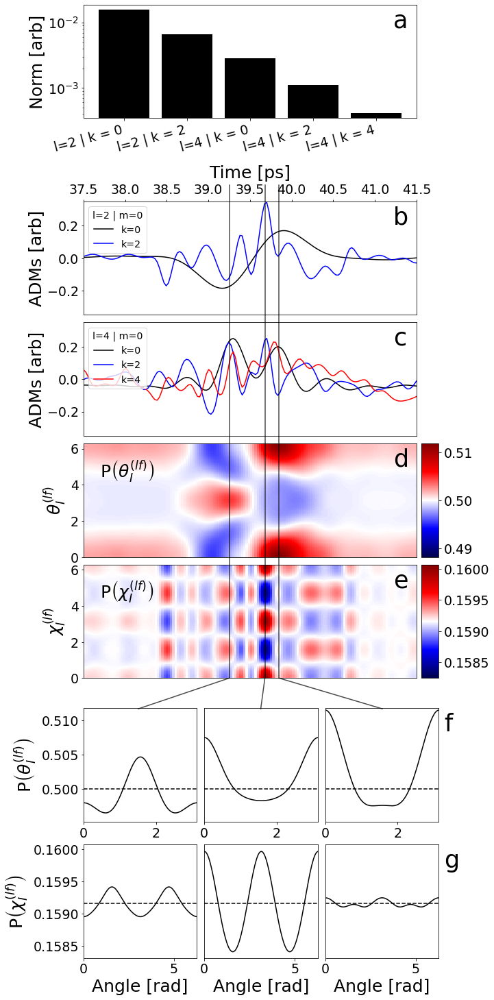

In [38]:
axs = []
eval_times = [39.05, 39.25, 39.68, 39.85, 40.05]
eval_times = [39.25, 39.68, 39.85]
dfrctn = []
label_size = 25
tick_size = 19
ADM_col = ['k','b', 'r', 'g']
xl, yl = 0.93, 0.8
plt_label_size = 35

if False:
    for tm in eval_times:
        fName = os.path.join("output", "NO2_sim_diffraction-analytic_Qmax-15_time-{0:.6g}.h5".format(float(tm)))
        print(fName)
        if not os.path.exists(fName):
            #p = subprocess.run(["python3", "../diffraction.py", "--molecule", "NO2", "--calculation_type", "analytic",
            #                "--xyz_file", "NO2.xyz", "--basis_folder", 
            #                "/cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K",
            #                "--eval_time", str(tm)], check=True, stdout=subprocess.PIPE)
            pp = subprocess.run("python ../diffraction.py --molecule NO2 --calculation_type analytic --xyz_file NO2.xyz --basis_folder /cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K --eval_time {}".format(tm),
                            shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            print(pp.stdout)
            print(pp.stderr)
            #p.wait()
            #os.system("python3 ../diffraction.py --molecule NO2 --calculation_type analytic --xyz_file NO2.xyz --basis_folder /cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K --eval_time {}".format(tm))
            print("python3 ../diffraction.py --molecule NO2 --calculation_type analytic --xyz_file NO2.xyz --basis_folder /cds/group/ued/scratch/N2O/axis_distributions/NO2/A/temp-100K --eval_time {}".format(tm))
            if not os.path.exists(fName):
                print("FAILED TO MAKE " + fName)
                sys.exit(0)

        with h5py.File(fName, "r") as h5:
            dfrctn.append(h5["mod_diffraction"][:])
            q = h5["q"][:]
    dfrctn = np.array(dfrctn)
    sz = q.shape[-1]//2
    q = q[sz:,sz:]
    dfrctn = dfrctn[:,sz:,sz:]
    dfrctn /= np.max([np.abs(np.amin(dfrctn)), np.amax(dfrctn)])
        #h5.close()



top_pad = 0.01
bot_pad = 0.045
vert_pad = 0.0075
vert_dim = (1 - (bot_pad + top_pad + 21*vert_pad))/7

horz_pad = 0.015
left_pad = 0.17
right_pad = 0.11
cbar_pad = 0.01
cbar_sz = 0.035
horz_dim = (1 - (left_pad + right_pad + 2*horz_pad))/3

fig_ratio = vert_dim/horz_dim
fig = plt.figure(figsize=(10,10/fig_ratio))


vert_anch = []
extra_v = 0
for v in range(7):
    if v == 1:
        extra_v += 2
    if v == 2:
        extra_v += 3
    if v == 6:
        extra_v += 10
    
    vert_anch.append(bot_pad + v*(vert_pad + vert_dim) + extra_v*vert_pad)
            
horz_anch = []
for h in range(len(eval_times)):
    horz_anch.append(left_pad + (horz_dim + horz_pad)*h)

caxs = []
rr = 0
for v in range(7):
    if v >= 2:
        axs.append(fig.add_axes((left_pad, vert_anch[v], 1-(left_pad+right_pad+cbar_pad+cbar_sz), vert_dim)))
        if v < 4:
            caxs.append(fig.add_axes((1-(right_pad+cbar_sz), vert_anch[v], cbar_sz, vert_dim)))
        continue
    else:
        axs.append([])
        for h in range(len(eval_times)):
            axs[v].append(fig.add_axes((horz_anch[h], vert_anch[v], horz_dim, vert_dim)))
        #caxs.append(fig.add_axes((horz_anch[cc]+horz_dim+0.1*right_pad, vert_anch[rr], right_pad*0.2, vert_dim)))
        #rr += 1

###  Filling Plots  ###
tInds = []
for t in eval_times:
    tInds.append(np.argmin(np.abs(times-t)))

lines_list = []
exp_labels = ['\phi', '\chi', '\\theta']
X_tm,Y_tm = np.meshgrid(np.append(times-(times[1]-times[0])/2, [times[-1]+(times[1]-times[0])/2]), np.linspace(0, 2*np.pi, N+1))
rng = []
for i in range(len(angles)):
    rng.append([])
    if v == 0:
        rng[-1].append(1./(2*np.pi) - 0.001)
        rng[-1].append(1./(2*np.pi) + 0.001)
    else:
        rng[-1].append(np.amin(np.real(exp_angles[i,:,:]))*0.9995)
        rng[-1].append(np.amax(np.real(exp_angles[i,:,:]))*1.0005)
rng = np.array(rng)


# Plot bases
norms = []
norm_ticks = []
for bs,lmk in zip(bases, LMK_dict[ani_key]):
    if lmk[0] < 6:
        mn = np.mean(bs)
        nrm = np.sqrt(np.sum((bs-mn)**2))
        norms.append(nrm)
        norm_ticks.append("l={} | k = {}".format(lmk[0], lmk[-1]))
        axs[7-lmk[0]//2-1].plot(times, (bs-mn)/nrm,
            color=ADM_col[lmk[-1]//2], label="k={}".format(lmk[-1]))
        axs[7-lmk[0]//2-1].set_xlim([times[0], times[-1]])
        axs[7-lmk[0]//2-1].set_ylim([-0.35, 0.35])
        axs[7-lmk[0]//2-1].xaxis.set_visible(False)
        #axs[7-lmk[0]//2-1].set_ylabel("Anisotropy [arb]", fontsize=label_size)
        axs[7-lmk[0]//2-1].tick_params(axis='y', labelsize=tick_size)
plt_labels = ['b', 'c']
for i in range(2):
    axs[-1*(i+2)].legend(title="l={} | m=0".format((i+1)*2), loc='upper left',
            fontsize=tick_size*3/4, title_fontsize=tick_size*3/4)
    axs[-1*(i+2)].text(xl, yl, plt_labels[i], fontsize=plt_label_size, transform=axs[-1*(i+2)].transAxes)
    axs[-1*(i+2)].set_ylabel("ADMs [arb]", fontsize=label_size)
axs[-1].bar(np.arange(len(norms)), norms, color='k', align='center', log=True)
axs[-1].tick_params(axis='y', labelsize=tick_size)
axs[-1].set_ylabel("Norm [arb]", fontsize=label_size)
axs[-1].set_xticks(np.arange(len(norms)))
axs[-1].set_xticklabels(norm_ticks, fontsize=tick_size, rotation=15, ha="right")
axs[-1].text(xl, yl, "a", fontsize=plt_label_size, transform=axs[-1].transAxes)


for v in range(4):
    if v < 2:
        hrz_ln = 1./(2*np.pi)
        if v == 1:
            hrz_ln = 0.5

        if v == 1:
            axs[v][0].set_ylabel(r"P$\left( \theta^{(lf)}_I \right)$", fontsize=label_size)
        else:
            axs[v][0].set_ylabel(r"P$\left( \chi^{(lf)}_I \right)$", fontsize=label_size)
        
        for h, itm in enumerate(tInds):
            axs[v][h].plot(angles[v+1], np.real(exp_angles[v+1,:,itm]), '-k')
            axs[v][h].set_ylim(rng[v+1])
            axs[v][h].set_xlim([0, angles[v+1][-1]])
            axs[v][h].axhline(hrz_ln, color='k', linestyle='--')
            axs[v][h].tick_params(axis='y', labelsize=tick_size)
            axs[v][h].tick_params(axis='x', labelsize=tick_size)
            if h > 0:
                axs[v][h].yaxis.set_visible(False)
            if v == 1:
                axs[v][h].set_xlabel("", fontsize=0)
            if v == 0:
                axs[v][h].set_xlabel("Angle [rad]", fontsize=label_size)
        plt_labels = ['g', 'f']
        axs[v][h].text(1.05, yl, plt_labels[v-2], fontsize=plt_label_size, transform=axs[v][h].transAxes)
    
    else:
        if v == 0:
            rng_max = hrz_ln + 0.001
            rng_min = hrz_ln - 0.001
        if v == 5:
            Y_tm_ = Y_tm/2
        else:
            Y_tm_ = Y_tm
        drng = np.amax(np.abs(rng[v-1]-iso_val[v-1]))
        pcm = axs[v].pcolormesh(X_tm, Y_tm_, np.real(exp_angles[int(v-1),:,:]),
                    cmap='seismic', vmin=iso_val[v-1]-drng, vmax=iso_val[v-1]+drng)
        axs[v].xaxis.set_visible(False)
        cbar = fig.colorbar(pcm, cax=caxs[v-2])
        cbar.ax.tick_params(labelsize=int(tick_size))
        if v != 3:
            tm_pos = [38.15, 39.63, 41.1]
            for itm,tm in enumerate(eval_times):
                """
                transFigure = fig.transFigure.inverted()
                coord1 = transFigure.transform(axs[v].transData.transform([tm,1]))
                coord2 = transFigure.transform(axs[v].transData.transform([tm,5]))


                fig.lines.append(matplotlib.lines.Line2D((coord1[0],coord2[0]),(coord1[1],coord2[1]),
                               transform=fig.transFigure))
                """
                #axs[v].add_line(matplotlib.lines.Line2D((tm,tm), (-0.05,15)))
                #axs[v].axvline(tm, -0.5, 1, color='k')
                lines_list.append(lines.Line2D([tm, tm], [0, 27.3], transform=axs[v].transData, figure=fig,
                        color='k', alpha=0.7))
                lines_list.append(lines.Line2D([tm, tm_pos[itm]], [0, -1.70], transform=axs[v].transData, figure=fig,
                        color='k', alpha=0.7))
        
        else:
            print("what's good")
            #axs[v].xaxis.tick_top()
            #axs[v].xaxis.set_label_position('top')
            #axs[v].set_xlabel("Time [ps]", fontsize=label_size)
        plt_labels = ['e', 'd']
        axs[v].text(xl, yl, plt_labels[v-2], fontsize=plt_label_size, transform=axs[v].transAxes)
            
        
        if v == 3:
            axs[v].set_ylabel(r'$\theta^{(lf)}_I$', fontsize=label_size)
        else:
            axs[v].set_ylabel(r'$\chi^{(lf)}_I$', fontsize=label_size)
        axs[v].tick_params(axis='y', labelsize=tick_size)
        axs[v].tick_params(axis='x', labelsize=tick_size)
        if v == 3:
            axs[v].text(0.05, 0.7, r'P$\left( \theta^{(lf)}_I \right)$',
                    fontsize=25, transform=axs[v].transAxes)
        else:
            axs[v].text(0.05, 0.7, r'P$\left( \chi^{(lf)}_I \right)$',
                    fontsize=25, transform=axs[v].transAxes)
    
        
        print("done")
axs[-2].xaxis.set_visible(True)
axs[-2].xaxis.tick_top()
axs[-2].tick_params(axis='x', labelsize=tick_size)
axs[-2].xaxis.set_label_position('top')
axs[-2].set_xlabel("Time [ps]", fontsize=label_size, labelpad=8)
fig.lines.extend(lines_list)
"""
for v in len(axs):
    if v >= 3 and v <= 5:
        axs[v].
    else:
        for h in len(axs[v])
"""
fig.savefig("./plots/alignment.png")       

## Compare Shot Noise Effects

(473,)
INFO: Making output folder
INFO: Setup Multiprocessing
INFO: Importing ground state geometry
	 O: 0.000000 0.526705 1.243013
	 N: 0.000000 0.000000 0.000000
	 O: 0.000000 0.409659 -0.966789
INFO: Setting up moment of inertia calculation
INFO: Rotating initial state molecular frame
INFO: Getting data
INFO: Getting scattering amplitudes
INFO: Simulate data
INFO: /cds/group/ued/scratch/khegazy/TeDDE/saved_simulations/NO2_symbreak/3dof/sim/PDF/100K_10TW_100fs/results_sim_range-0.5-20.0_error-ston_scale-25.h5 exist, now loading data
INFO: Pruning data


/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 5.9957923877665e-15 at index 25 ... Passed
L = 4 	 Largest std = 3.23300916

/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 1.1991584775533e-14 at index 25 ... Passed
L = 4 	 Largest std = 6.46601833

/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 2.3983169551066e-14 at index 25 ... Passed
L = 4 	 Largest std = 1.29320366

/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 4.7966339102132e-14 at index 25 ... Passed
L = 4 	 Largest std = 2.58640733

/cds/home/k/khegazy/TeDDE/NO2/modules/density_extraction.py:779: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  


INFO: Calculating I0
INFO: Initial thetas used to fit I0
	 [1.35 0.03 1.05 0.02 2.34 0.01]

########################################
#####  Molecular Ensemble Results  #####
########################################

#####  Mean molecule thetas  #####
[1.35 1.05 2.34]

#####  STD molecule thetas  #####
[0.03 0.02 0.01]

#####  Mean molecule cartesian  #####
[[ 0.52669819  0.          1.24299777]
 [ 0.          0.          0.        ]
 [ 0.40965415  0.         -0.96677604]]

#####  STD molecule cartesian  #####
[[0.01325286 0.         0.0277475 ]
 [0.         0.         0.        ]
 [0.00917936 0.         0.01852839]]

#####  Mean d3  #####
2.2129129603522664

#####  STD d3  #####
0.033758951266729426


###############################################################
#####  Checking Scale of Spherical Bessel Function Error  #####
###############################################################
L = 2 	 Largest std = 9.5932678204264e-14 at index 25 ... Passed
L = 4 	 Largest std = 5.17281466

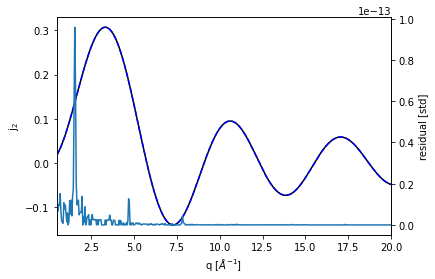

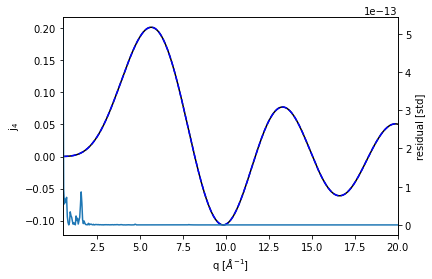

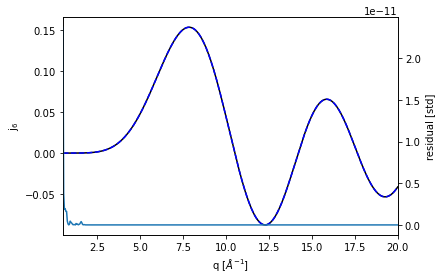

In [40]:
dp = copy(input_data_parameters)
dp["molecule"] = "NO2_symbreak"
dp["experiment"] = "3dof"
dp["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dp["fit_range"] = [0.5, 20]
dp["density_model"] = "PDF"
dp["simulate_error"] = ("StoN", (25, [0.5,4]))#("constant_sigma", 0.1)
dp["ADM_params"]["temperature"] = 100
dp["ADM_params"]["probe_FWHM"] = 100 
dp = setup_dom(dp)

data_err = []
var_err = []
filt_err = []
snr_values = [25, 50, 100, 200, 400]
for sn in snr_values:
    dp["simulate_error"] = ("StoN", (sn, [0.5,4]))
    print(dp["dom"].shape)
    exx = density_extraction(dp,
        get_molecule_init_geo,
        get_scattering_amplitudes,
        log_prior=input_log_prior,
        density_generator=input_density_generator,
        ensemble_generator=input_ensemble_generator,
        get_ADMs=get_ADMs)
    print("TEST SHAPE FIN", exx.data_coeffs.shape)
    data_err.append(copy(exx.data_coeffs))
    var_err.append(copy(exx.data_coeffs_var))
    filt_err.append(copy(exx.wiener))

N=100000
dp = data_parameters
if dp["density_model"] == "PDF":
    thetas = rnd.normal(0, 1, size=(N, 3))\
            *np.array([dp["sim_thetas"][1], dp["sim_thetas"][3], dp["sim_thetas"][5]])
    data_thetas = thetas + np.array([dp["sim_thetas"][0], dp["sim_thetas"][2], dp["sim_thetas"][4]])
else:
    raise ValueError("Initial parameters needs to have PDF")

In [41]:
print(dp["sim_thetas"])
print(np.mean(data_thetas, axis=0))
print(np.std(data_thetas, axis=0))
print(ranges_3d)

[1.35e+00 3.00e-02 1.05e+00 2.00e-02 2.34e+00 1.00e-02 5.10e+01]
[1.34995484 1.04995986 2.34001658]
[0.02998584 0.01998403 0.00999581]
[array([1.25, 1.45]), array([0.95, 1.15]), array([2.24, 2.44])]


(100000, 3)
1.3499548412256144 1.0499598644786408 2.340016579571804
SSS (100000,) (100000,) (100000,)
5.382541962288015 -16.13663059860957 1.6131132954482332
0.4587059444958083 -1.4850610992377848 1.0263551547419765
6.698751111605956 -2.8966268245676763 3.80212428703828
2.771681403337593 -0.7695061756798417 2.0021752276577516
0.1354632275870138 -0.0514718233270395 0.08399140425997428
2.5638487919649413 -4.148631979709316 1.584783187744375


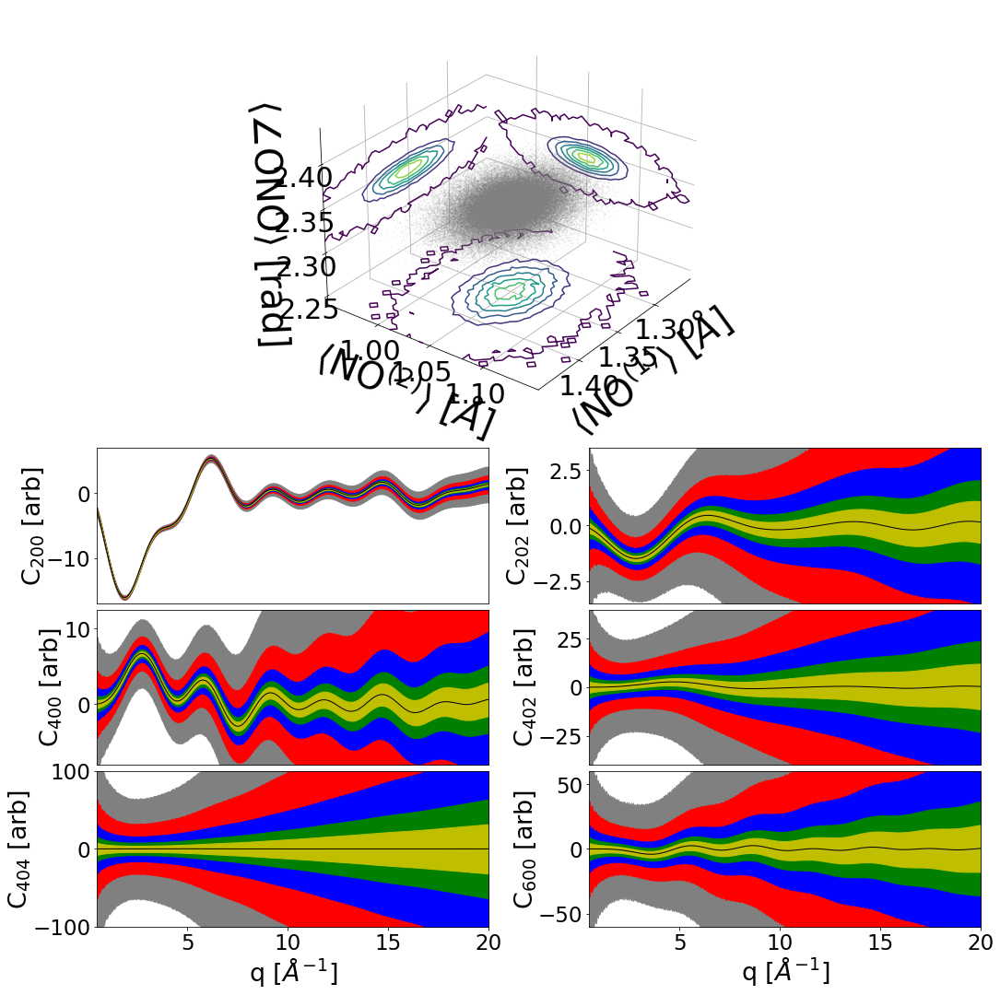

In [42]:
#fig, axs = plt.subplots(3,2, figsize=(10,15))
colors = ['gray', 'r', 'b', 'g', 'y']
label_size_dsn, tick_size_dsn = 27, 23

fig = plt.figure(figsize=(15,15))
Nvert = int(np.ceil(len(exx.data_LMK)/2.))
top_pad, bot_pad, vert_pad = 0.7, 0.13, 0.01
vert_data, vert_filt = 0.25, 0.1
norm = Nvert*(vert_data + vert_pad) - vert_pad + top_pad + bot_pad
top_pad /= norm
bot_pad /= norm
vert_pad /= norm
vert_data /= norm
vert_filt /= norm

left_pad, right_pad = 0.08, 0.02
data_horz, horz_pad = 0.35, 0.09
norm = left_pad + right_pad + horz_pad + 2*data_horz
left_pad /= norm
right_pad /= norm
data_horz /= norm
horz_pad /= norm

data_ranges = [[-17, 7], [-3.5, 3.5], [-8, 12.5], [-40, 40], [-100, 100], [-60, 60]]

print(data_thetas.shape)
axtd = fig.add_axes((0, 1.0-top_pad+4*vert_pad, 1.0, top_pad-4*vert_pad), projection='3d')
plot3d(data_thetas, ranges_3d, ax=axtd, labels=labels_delta,
       label_size=label_size*1.6, tick_size=tick_size*1.6, alpha=0.9)

axs, axs_filt = [], []
for v in range(Nvert):
    vert = 1 - (top_pad + (v+1)*(vert_data + vert_pad))
    axs.append([])
    axs[-1].append(fig.add_axes((left_pad, vert, data_horz, vert_data)))
    axs[-1].append(fig.add_axes((left_pad + data_horz + horz_pad, vert, data_horz, vert_data)))


ic = exx.data_params["dom"].shape[0] - data_err[0][0].shape[0]
for il,lmk in enumerate(exx.data_LMK):
    for isg in range(len(data_err)):
        axs[il//2][il%2].fill_between(exx.data_params["dom"][ic:], data_err[isg][il]-np.sqrt(var_err[isg][il]), data_err[isg][il]+np.sqrt(var_err[isg][il]), color=colors[isg])
        #axs[il//2][il%2].errorbar(exx.data_params["dom"][ic:], data_err[isg][il],
        #        yerr=np.sqrt(var_err[isg][il]), ecolor=colors[isg], fmt='-k', linewidth=0.05, elinewidth=1.5)
        
        #axs_filt[il//2][il%2].plot(ex.data_params["dom"][ic:], filt_err[isg][il], color=colors[isg])
    axs[il//2][il%2].plot(exx.data_params["dom"][ic:], data_err[isg][il], '-k', linewidth=1)
    rng = np.abs(np.amax(data_err[isg][il]) + np.amin(data_err[isg][il]))
    if il == 0:
        rng *= 0.15
    print(np.amax(data_err[isg][il]), np.amin(data_err[isg][il]), rng)
    #axs[il//2][il%2].set_ylim([np.amin(data_err[isg][il])-1.*rng, np.amax(data_err[isg][il])+1.*rng])
    axs[il//2][il%2].set_ylim(data_ranges[il][0], data_ranges[il][1])
    
    axs[il//2][il%2].set_xlim([0.5,exx.data_params["dom"][-1]])
    #axs_filt[il//2][il%2].set_xlim([0.5,ex.data_params["dom"][-1]])
    axs[il//2][il%2].xaxis.set_visible(False)
    #if il//2 != len(axs_filt)-1:
    #    axs_filt[il//2][il%2].xaxis.set_visible(False)
    #else:
    #    axs_filt[il//2][il%2].set_xlabel('q $[\AA^{-1}]$', fontsize=20)
    axs[il//2][il%2].set_ylabel("C$_{"+"{}{}{}".format(*lmk)+"}$ [arb]", fontsize=label_size_dsn, labelpad=0.1)
    axs[il//2][il%2].tick_params(axis='y', labelsize=tick_size_dsn)    


axs[-1][-1].tick_params(axis='x', labelsize=tick_size_dsn)
axs[-1][-1].set_xlabel("q $[\AA^{-1}]$", fontsize=label_size_dsn, labelpad=0.1)
axs[-1][-1].xaxis.set_visible(True)
axs[-1][-2].tick_params(axis='x', labelsize=tick_size_dsn)
axs[-1][-2].set_xlabel("q $[\AA^{-1}]$", fontsize=label_size_dsn, labelpad=1)
axs[-1][-2].xaxis.set_visible(True)

fig.savefig("./plots/{}/data_vs_errors.png".format(dp["molecule"]))
    

1.3499548412256144 1.0499598644786408 2.340016579571804
SSS (100000,) (100000,) (100000,)
5.382541962288015 -16.13663059860957 1.6131132954482332
0.4587059444958083 -1.4850610992377848 1.0263551547419765
6.698751111605956 -2.8966268245676763 3.80212428703828
2.771681403337593 -0.7695061756798417 2.0021752276577516
0.1354632275870138 -0.0514718233270395 0.08399140425997428
2.5638487919649413 -4.148631979709316 1.584783187744375


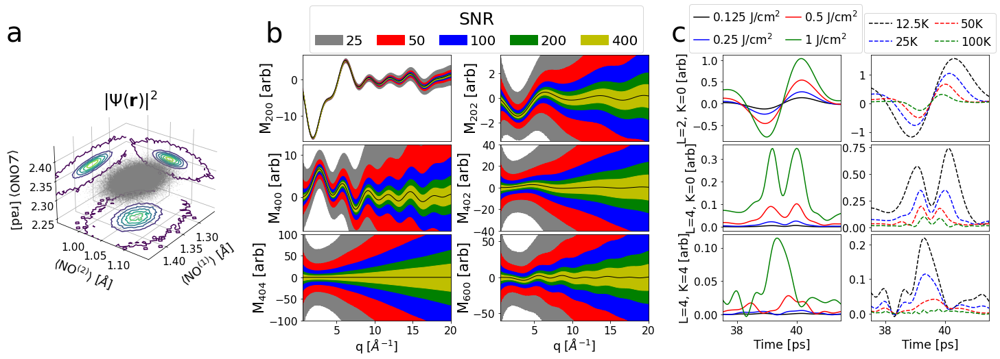

In [43]:
#fig, axs = plt.subplots(3,2, figsize=(10,15))
colors = ['gray', 'r', 'b', 'g', 'y']
label_size_mvr, tick_size_mvr = 17.5, 15.5

fig = plt.figure(figsize=(20,7))
Nvert = int(np.ceil(len(exx.data_LMK)/2.))
top_pad, bot_pad = 0.7, 0.1
vert_data, vert_pad = 0.25, 0.01

left_pad, right_pad = 0.04, 0.005
data_horz, horz_pad = 0.3/2, 0.05
adms_horz = 0.24/2
snr_horz = data_horz*2 + horz_pad


data_ranges = [[-17, 7], [-3.5, 3.5], [-8, 12.5], [-40, 40], [-100, 100], [-60, 60]]

#####  3d Distribution  #####
ax3d_horz = 0.18
axtd = fig.add_axes((left_pad, 0, ax3d_horz, 1.0), projection='3d')
plot3d(data_thetas, ranges_3d, ax=axtd, labels=labels_delta,
       label_size=label_size_mvr, tick_size=tick_size_mvr, alpha=0.9)
axtd.text(0.1, 0.9, 4.3, s="$|\Psi(\mathbf{r})|^2$",
                transform=axtd.transAxes, fontsize=25)


#####  SNR Plots  #####
snr_horz_sep = 0.08
axs, axs_filt = [], []
for v in range(Nvert):
    #vert = 1 - (top_pad + (v+1)*(vert_data + vert_pad))
    vert = bot_pad + ((Nvert-1)-v)*(vert_data + vert_pad)
    axs.append([])
    axs[-1].append(fig.add_axes((left_pad + ax3d_horz + snr_horz_sep, vert, data_horz, vert_data)))
    axs[-1].append(fig.add_axes((left_pad + ax3d_horz + data_horz + horz_pad + snr_horz_sep, vert, data_horz, vert_data)))


ic = exx.data_params["dom"].shape[0] - data_err[0][0].shape[0]
for il,lmk in enumerate(exx.data_LMK):
    #axs[il//2][il%2].plot([],[], ' ', label="SNR:")
    for isg in range(len(data_err)):
        axs[il//2][il%2].fill_between(exx.data_params["dom"][ic:], data_err[isg][il]-np.sqrt(var_err[isg][il]),
                data_err[isg][il]+np.sqrt(var_err[isg][il]), color=colors[isg], label=snr_values[isg])
        #axs[il//2][il%2].errorbar(exx.data_params["dom"][ic:], data_err[isg][il],
        #        yerr=np.sqrt(var_err[isg][il]), ecolor=colors[isg], fmt='-k', linewidth=0.05, elinewidth=1.5)
        
        #axs_filt[il//2][il%2].plot(ex.data_params["dom"][ic:], filt_err[isg][il], color=colors[isg])
    
    axs[il//2][il%2].plot(exx.data_params["dom"][ic:], data_err[isg][il], '-k', linewidth=1)
    rng = np.abs(np.amax(data_err[isg][il]) + np.amin(data_err[isg][il]))
    if il == 0:
        rng *= 0.15
    print(np.amax(data_err[isg][il]), np.amin(data_err[isg][il]), rng)
    #axs[il//2][il%2].set_ylim([np.amin(data_err[isg][il])-1.*rng, np.amax(data_err[isg][il])+1.*rng])
    axs[il//2][il%2].set_ylim(data_ranges[il][0], data_ranges[il][1])
    
    axs[il//2][il%2].set_xlim([0.5,exx.data_params["dom"][-1]])
    #axs_filt[il//2][il%2].set_xlim([0.5,ex.data_params["dom"][-1]])
    axs[il//2][il%2].xaxis.set_visible(False)
    #if il//2 != len(axs_filt)-1:
    #    axs_filt[il//2][il%2].xaxis.set_visible(False)
    #else:
    #    axs_filt[il//2][il%2].set_xlabel('q $[\AA^{-1}]$', fontsize=20)
    axs[il//2][il%2].set_ylabel("M$_{"+"{}{}{}".format(*lmk)+"}$ [arb]", fontsize=label_size_mvr*1.2, labelpad=0.1)
    axs[il//2][il%2].tick_params(axis='y', labelsize=tick_size_mvr)    


axs[-1][-1].tick_params(axis='x', labelsize=tick_size_mvr)
axs[-1][-1].set_xlabel("q $[\AA^{-1}]$", fontsize=label_size_mvr, labelpad=0.1)
axs[-1][-1].xaxis.set_visible(True)
axs[-1][-2].tick_params(axis='x', labelsize=tick_size_mvr)
axs[-1][-2].set_xlabel("q $[\AA^{-1}]$", fontsize=label_size_mvr, labelpad=1)
axs[-1][-2].xaxis.set_visible(True)
legend = axs[0][-2].legend(loc='upper left', fontsize=20, title="SNR",
            ncol=len(snr_values), columnspacing=1, handletextpad=0.25, bbox_to_anchor=(0.0, 1.55, 0.8, 0.1))#(0.0, 1.3, 0.8, 0.1))
plt.setp(legend.get_title(),fontsize=25)
#llines = legend.get_lines()

#plt.setp(llines[0],xdata=np.array([llines[0].get_xdata()[0],\
#                                   llines[0].get_xdata()[1]*1.25]))


#####  ADMs  #####
N_bases = 5
cl_bases = ['k', 'b', 'r', 'g', 'teal']
tms = data_parameters["ADM_params"]["eval_times"]
#fig, axs = plt.subplots(N_bases, 2, figsize=(15,16),
#    gridspec_kw={'hspace':0.055, 'wspace':0.18,
#                'left':0.11, 'right': 0.98, 'top': 0.955, 'bottom': 0.05})
axs_adms = []
for inn, info in enumerate([fluence_info_plot, temp_info_plot]):

    axs_adms.append([])
    for i in range(3):
        axs_adms[-1].append(fig.add_axes((1-(right_pad+2*adms_horz+0.6*horz_pad)+inn*(adms_horz+0.6*horz_pad),
                    bot_pad+i*(vert_data+vert_pad), adms_horz, vert_data)))
    for iin,inf in enumerate(info):
        ii = tuple(inf)
        if inn == 0:
            n = str(ii[1]*0.01)
            if n[-1] == "0":
                n = n[:n.find(".")]
            lbl = "{} J/cm$^2$".format(n)
            fmt = '-'
        else:
            lbl = "{}K".format(ii[0])
            fmt = '--'
        for i in range(N_bases):
            t_lmk = tuple(LMK_dict[ii][i])
            if t_lmk == (2,0,0) or t_lmk == (4,0,0) or t_lmk == (4,0,4):
                if t_lmk[0] == 2:
                    bsc = 2
                elif t_lmk[2] == 0:
                    bsc = 1
                else:
                    bsc = 0
                bs_interp = interp1d(times_dict[ii], bases_dict[ii][i]*100, axis=-1, kind='cubic')
                axs_adms[inn][bsc].plot(tms, bs_interp(tms), fmt,
                            color=cl_bases[iin], label=lbl)
                if inn == 0:
                    axs_adms[inn][bsc].set_ylabel("L={}, K={} [arb]".format(LMK_dict[ii][i][0], LMK_dict[ii][i][2]), fontsize=label_size_mvr)
                if bsc != 0:
                    axs_adms[inn][bsc].xaxis.set_visible(False)
        for i in range(len(axs_adms[inn])):
            axs_adms[inn][i].set_xlim(tms[0], tms[-1])
            axs_adms[inn][i].tick_params(axis='y', labelsize=tick_size_mvr)
            
        axs_adms[inn][0].set_xlabel("Time [ps]", fontsize=label_size_mvr)
        axs_adms[inn][0].tick_params(axis='x', labelsize=tick_size_mvr)


    #axs[0][0].text(0.8, 0.09, r'$\times 10^5$', fontsize=25, transform=axs[0][0].transAxes)
    #axs[0][1].text(0.8, 0.09, r'$\times 10^3$', fontsize=25, transform=axs[0][1].transAxes)
    if inn == 0:
        axs_adms[inn][-1].legend(loc='upper center', fontsize=17,
            ncol=2, columnspacing=0.5, handletextpad=0.25, handlelength=1.3, bbox_to_anchor=(0.35, 1.55, 0.2, 0.1))
    else:
        axs_adms[inn][-1].legend(loc='upper center', fontsize=17,
            ncol=2, columnspacing=0.5, handletextpad=0.25, bbox_to_anchor=(0.40, 1.45, 0.2, 0.1))

        
#####  Labels  #####
plabel_size = 40
axs[0][-2].text(-2.0, 1.15, "a", transform=axs[0][-2].transAxes, fontsize=plabel_size)
axs[0][-2].text(-0.25, 1.15, "b", transform=axs[0][-2].transAxes, fontsize=plabel_size)
axs_adms[0][-1].text(-0.43, 1.15, "c", transform=axs_adms[0][-1].transAxes, fontsize=plabel_size)

fig.savefig("./plots/{}/data_variations.png".format(dp["molecule"]))

# Compare 2 and 3 Degrees of Freedom (Deprecated)

In [ ]:
dp1 = copy(data_parameters)
dp1["molecule"] = "NO2"
dp1["experiment"] = "2dof"
dp1["init_geo_xyz"] = "XYZ/NO2.xyz"
dp1["fit_range"] = [0.01, 10]
#dp1["simulate_error"] = ("constant_sigma", 0.163)
dp2 = copy(dp1)
dp1["molecule"] += "_single"
dp3 = copy(dp1)
dp3["molecule"] = "NO2_single"
dp3["experiment"] = "3dof"

dps = [dp1, dp2, dp3]
samples_dof = []

for i,dp in enumerate(dps):
    ex = density_extraction(dp,
        get_molecule_init_geo,
        get_scattering_amplitudes,
        log_prior=input_log_prior,
        ensemble_generator=None,
        get_ADMs=None, results_only=True)
    
    samples_dof.append(ex.get_mcmc_results(plot=False))
    del ex

for s in samples_dof:
    print("shape", s.shape)
    print("{} +/- {}".format(np.mean(s, 0), np.std(s, 0)))

In [ ]:
fig, axs = column_compare_dists([samples_dof[0], cn2, samples_dof[1]], cn2,
        ranges2, labels2, xticks=[None, [2.338, 2.342]])
fig.savefig("./plots/response_2dof.png")

In [ ]:
rng = [[x-0.016,x+0.016] for x in cn2]
rng = [rng[0]]+rng
fig, axs = column_compare_dists([samples_dof[2]], rng, labels,
        cn=[cn2[0]]+cn2)

Ncrn,Ns = 3,0
bins = []
for ir in rng:
    bins.append(np.linspace(ir[0], ir[1], 51))
for v in range(2):
    for h in range(2):
        if h + v == 1:
            print("BINS", bins[-1*v-1][0], bins[-1*v-1][-1])
            nn, _ = np.histogram(samples_dof[1][:,-1*v-1], bins=bins[-1*v-1], density=True)
            axs[v][h+1].plot((bins[-1*v-1][1:]+bins[-1*v-1][:-1])/2, nn/15, '--k')
            axs[v][h+1].plot([cn[-1*v-1], cn[-1*v-1]], [0,1.25*np.amax(n)], '-k')
        elif h + v > Ncrn-1:
            axs[v][h+1].xaxis.set_visible(False)
            axs[v][h+1].yaxis.set_visible(False)
            axs[v][h+1].set_visible(False)
        else:
            counts, x, y = np.histogram2d(samples_dof[1][:,h], samples_dof[1][:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
            axs[v][h+1].contour(counts.transpose(), levels=5,
                    extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='w')
            axs[v][h+1].scatter(cn[h], cn[-1*v-1], marker='x', color='k')

# Playground

In [ ]:
t = np.linspace(0,2*np.pi,100)
fig,ax = plt.subplots()
ax.plot(t, np.sin(t), '-k')
ax.plot(t, np.sin(0.9*t), '.k')
ax.plot(t, np.sin(1.1*t), '.k')
ax.plot([np.pi/2, np.pi/2], [-1.1,1.1], '-k')
ax.plot([np.pi, np.pi], [-1.1,1.1], '-k')
ax.plot([3*np.pi/2, 3*np.pi/2], [-1.1,1.1], '-k')
ax.set_xlim([0, 2*np.pi])
ax.set_ylim([-1.1, 1.1])
ax.set_xlabel("q [arb]", fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
fig.savefig("plots/Cdist_example.png")

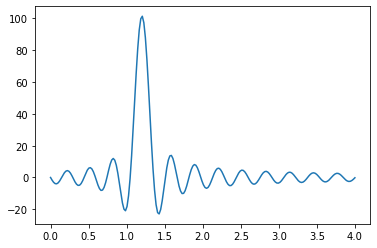

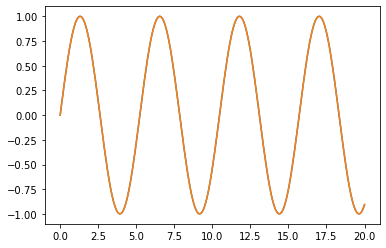

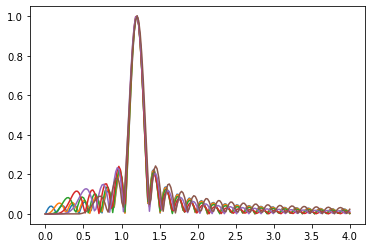

In [118]:
r = 1.2
rs = np.linspace(0, 4, 200)
qs = np.linspace(0,20, 200)
plt.figure()
plt.plot(rs, np.sum(np.sin(r*qs)*np.sin(np.expand_dims(rs,-1)*qs), axis=-1))
plt.figure()
plt.plot(qs, np.sin(r*qs))
plt.plot(qs,r*qs*sp.special.spherical_jn(0, r*qs))
fig, ax = plt.subplots()
for i in np.arange(6)*2:
    #fig, ax = plt.subplots()
    ovr = rs*np.abs(np.sum(qs**2*sp.special.spherical_jn(i, r*qs)*sp.special.spherical_jn(i, np.expand_dims(rs,-1)*qs), axis=-1))
    ax.plot(rs, ovr/np.amax(ovr))

In [185]:
16*931494.32/(9*10**16)

1.655989902222222e-10

In [249]:
def morse_prob(n, re, r, lmb, a, lag=None):
    N = np.expand_dims(np.sqrt(factorial(n)*(2*lmb-2*n-1)/gamma(2*lmb-n)), -1)
    z = 2*lmb*np.exp(-1*a*(r-re))
    #if lag is None:
    #    lag = genlaguerre(n, 2*lmb-2*n-1)
    coeff = N*z**(lmb-np.expand_dims(n, -1)-1./2)*np.exp(-0.5*z)
    prob=0
    for i,nn in enumerate(n):
        prob += (coeff[i,:]*lag[nn](z))**2
    
    return prob

70
(200,)


/cds/home/k/khegazy/.conda/envs/emcee_env/lib/python3.9/site-packages/scipy/special/orthogonal.py:141: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.weights = np.array(list(zip(roots, weights, equiv_weights)))
/cds/home/k/khegazy/.conda/envs/emcee_env/lib/python3.9/site-packages/scipy/special/orthogonal.py:569: RuntimeWarning: overflow encountered in power
  wfunc = lambda x: exp(-x) * x**alpha


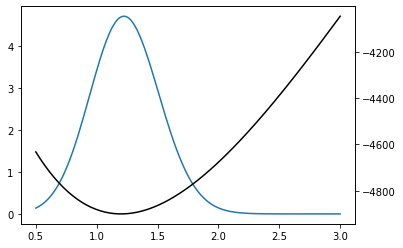

In [270]:
re = 1.2
r = np.linspace(0.5,3,200)
n = np.arange(1)+1
n = np.array([0])
lmb = 70
a = 0.3
print(lmb)


lag = {}
for nn in range(10):
    lag[nn] = genlaguerre(nn, 2*lmb-2*n-1)

res= morse_prob(n, re, r, lmb, a, lag=lag)
print(res.shape)

"""
for ke in [10**25, 10**30, 10**40]:
    De = 400
    a = np.sqrt(ke/(2*De))
    r = np.linspace(0.25,2.25,75)*10**-15
    n = np.arange(1)+1
    n = np.array([0])
    lmb = np.sqrt(2*1.66*10**(-10)*De)/(a*6.582*10**(-16))
"""

fig, ax = plt.subplots()
ax.plot(r, res)
ax2 = ax.twinx()
ax2.plot(r, lmb**2*(np.exp(-2*a*(r-re)) - 2*np.exp(-1*a*(r-re))), '-k')

In [200]:
def morse_prob(n, re, r, ke, De, lag=None):
    a = np.sqrt(ke/(2*De))
    lmb = np.sqrt(2*1.66*10**(-10)*De)/(a*6.582*10**(-16))
    print(a,lmb)
    N = np.expand_dims(np.sqrt(factorial(n)*(2*lmb-2*n-1)/gamma(2*lmb-n)), -1)
    z = 2*lmb*np.exp(-1*a*(r-re))
    #if lag is None:
    #    lag = genlaguerre(n, 2*lmb-2*n-1)
    coeff = N*z**(lmb-np.expand_dims(n, -1)-1./2)*np.exp(-0.5*z)
    prob=0
    for i,nn in enumerate(n):
        prob += (coeff[i,:]*lag[nn](z))**2
    
    return prob

495.20629079218145
(200,)


/cds/home/k/khegazy/.conda/envs/emcee_env/lib/python3.9/site-packages/scipy/special/orthogonal.py:569: RuntimeWarning: overflow encountered in power
  wfunc = lambda x: exp(-x) * x**alpha
/cds/home/k/khegazy/.conda/envs/emcee_env/lib/python3.9/site-packages/scipy/special/orthogonal.py:569: RuntimeWarning: invalid value encountered in multiply
  wfunc = lambda x: exp(-x) * x**alpha
/cds/home/k/khegazy/.conda/envs/emcee_env/lib/python3.9/site-packages/scipy/special/orthogonal.py:141: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.weights = np.array(list(zip(roots, weights, equiv_weights)))


'\nplt.figure()\nplt.plot(r, np.exp(-0.5*z))\nplt.figure()\nplt.plot(r, z**(lmb-2-0.5))\nplt.figure()\nplt.plot(r, np.array(elags).transpose())\n'

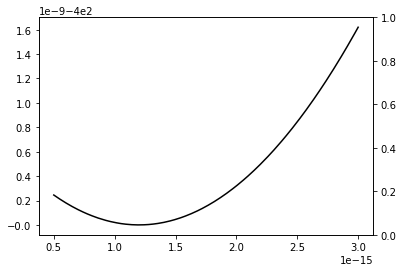

In [285]:
re = 1.2*10**-15
ke = 10**21#5*10**23
De = 400
a = np.sqrt(ke/(2*De))
r = np.linspace(0.5,3,200)*10**-15
n = np.arange(1)+1
n = np.array([0])
lmb = np.sqrt(2*1.66*10**(-10)*De)/(a*6.582*10**(-16))
print(lmb)
lag = {}
for nn in range(10):
    lag[nn] = genlaguerre(nn, 2*lmb-2*n-1)

#res= morse_prob(n, re, r, ke, De, lag=lag)
print(res.shape)

"""
for ke in [10**25, 10**30, 10**40]:
    De = 400
    a = np.sqrt(ke/(2*De))
    r = np.linspace(0.25,2.25,75)*10**-15
    n = np.arange(1)+1
    n = np.array([0])
    lmb = np.sqrt(2*1.66*10**(-10)*De)/(a*6.582*10**(-16))
"""

fig, ax = plt.subplots()
#ax.plot(r, res)
ax2 = ax.twinx()
ax.plot(r, De*(np.exp(-2*a*(r-re)) - 2*np.exp(-1*a*(r-re))), '-k')
#print(lmb**2*(np.exp(-2*a*(r-re)*10**-15) - 2*np.exp(-1*a*(r-re)*10**-15)))
"""
plt.figure()
plt.plot(r, np.exp(-0.5*z))
plt.figure()
plt.plot(r, z**(lmb-2-0.5))
plt.figure()
plt.plot(r, np.array(elags).transpose())
"""


In [25]:
dp = copy(data_parameters)
dp["molecule"] = "NO2_symbreak"
dp["experiment"] = "3dof"
dp["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dp["fit_range"] = [0.05, 10]
dp["simulate_error"] = ("constant_sigma", 0.163)
sigs = [1, 0.163, 0.01, 0.001, 0.0001, 0.00001, 1e-10]
sigs = 1/(10**np.arange(11))
print(sigs)
samples_test = []

for i,ss in enumerate(sigs):
    if True or i == len(sigs)-1:
        dp["fit_range"] = [0.5, 10]
    else:
        dp["fit_range"] = [0.05, 10]
    dp["simulate_error"] = ("constant_sigma", ss)
    ex = density_extraction(dp,
        get_scattering_amplitudes,
        log_prior=input_log_prior,
        theta_to_cartesian=input_theta_to_cartesian,
        ensemble_generator=None,
        get_ADMs=None,
        results_only=True)
    
    samples_test.append(ex.get_mcmc_results(plot=False))

[1.e+00 1.e-01 1.e-02 1.e-03 1.e-04 1.e-05 1.e-06 1.e-07 1.e-08 1.e-09
 1.e-10]
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-10.0_error-constant_sigma_scale-1.h5
NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-10.0_error-constant_sigma_scale-1
FNAME /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-10.0_error-constant_sigma_scale-1.h5
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-10.0_error-constant_sigma_scale-1.h5
NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-10.0_error-constant_sigma_scale-1
Setting up MCMC
The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 44.3184504   96.67995327  49.72535302 109.12451349  42.45128573
  83.18931189]
INFO: Autocorrelation Times [ 44.3184504   96.67995327  

In [26]:
cn = 1
for i,s in enumerate(samples_test):
    print("Error Scale", sigs[i])
    print("shape", s.shape)
    print("{} +/- {}".format(np.mean(s, 0), np.std(s, 0)))


Error Scale 1.0
shape (1900, 6)
[1.35064105 0.50113477 1.04992858 0.48624923 2.33957111 0.04468261] +/- [0.00281869 0.29314424 0.00327486 0.29101523 0.00435766 0.02700235]
Error Scale 0.1
shape (1300, 6)
[1.35012835 0.05818717 1.04995507 0.13451376 2.33994697 0.01769569] +/- [0.00033146 0.02862812 0.00032173 0.1978183  0.00044783 0.01094266]
Error Scale 0.01
shape (600, 6)
[1.34999357 0.04711971 1.0499998  0.04782453 2.34000459 0.00824097] +/- [3.06783554e-05 1.70411579e-02 2.96309671e-05 1.92520290e-02
 4.43547212e-05 3.12442420e-03]
Error Scale 0.001
shape (2100, 6)
[1.34999974 0.04462719 1.0500001  0.01932195 2.34000009 0.00994844] +/- [3.48461686e-06 1.26722263e-02 3.17715325e-06 4.84540008e-04
 4.48712493e-06 3.05462060e-04]
Error Scale 0.0001
shape (1100, 6)
[1.34999998 0.04380766 1.05       0.01921273 2.34000001 0.0099646 ] +/- [3.41793164e-07 9.87147637e-03 3.38613550e-07 4.36299318e-05
 4.55595826e-07 2.91157747e-05]
Error Scale 1e-05
shape (600, 6)
[1.34999999 0.04067781 1.05

INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-5.0_error-constant_sigma_scale-1e-06.h5
NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-5.0_error-constant_sigma_scale-1e-06
FNAME /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-5.0_error-constant_sigma_scale-1e-06.h5
INFO: Loading backend /cds/group/ued/scratch/khegazy/TeDDE/NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-5.0_error-constant_sigma_scale-1e-06.h5
NO2_symbreak/3dof/sim/lg-2-4-6/results_sim_range-0.5-5.0_error-constant_sigma_scale-1e-06
Setting up MCMC
The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 384;
tau: [ 195.6029059  1728.94394285   32.34512451  271.64131717  117.66345618
   85.79860586]
STATS [1.35       0.04013984 1.05       0.01920851 2.34       0.00996829] [7.18528490e-09 1.34052877e-02 8.2379235

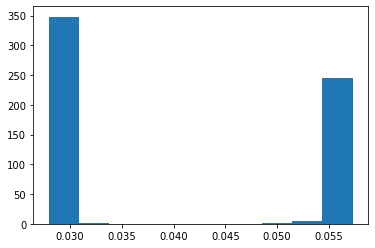

In [40]:
dp = copy(data_parameters)
dp["molecule"] = "NO2_symbreak"
dp["experiment"] = "3dof"
dp["init_geo_xyz"] = "XYZ/NO2_symbreak.xyz"
dp["fit_range"] = [0.5, 5]
dp["simulate_error"] = ("constant_sigma", 1e-6)#("StoN", (300, (0.5, 4)))#("constant_sigma", 1e0)

ex = density_extraction(dp,
        get_scattering_amplitudes,
        log_prior=input_log_prior,
        theta_to_cartesian=input_theta_to_cartesian,
        ensemble_generator=None,
        get_ADMs=None,
        results_only=True)
ex.setup_sampler(expect_file=True)
try:
    tau = ex.sampler.get_autocorr_time()
except Exception as e:
    print(str(e))
    tau = ex.sampler.get_autocorr_time(tol=0)
max_ac = np.amax(tau).astype(int)
chain = ex.sampler.get_chain(discard=5*max_ac, thin=max_ac)

fch = np.reshape(chain, (-1, chain.shape[-1]))
print("STATS", np.mean(fch, axis=0), np.std(fch, axis=0))
print(np.sort(fch[:,1])[:10])
plt.hist(fch[:,1])
inds = np.where(fch[0,1] < 1)[0]
print("Number", len(inds), samples_test[-1].shape)
print(inds)

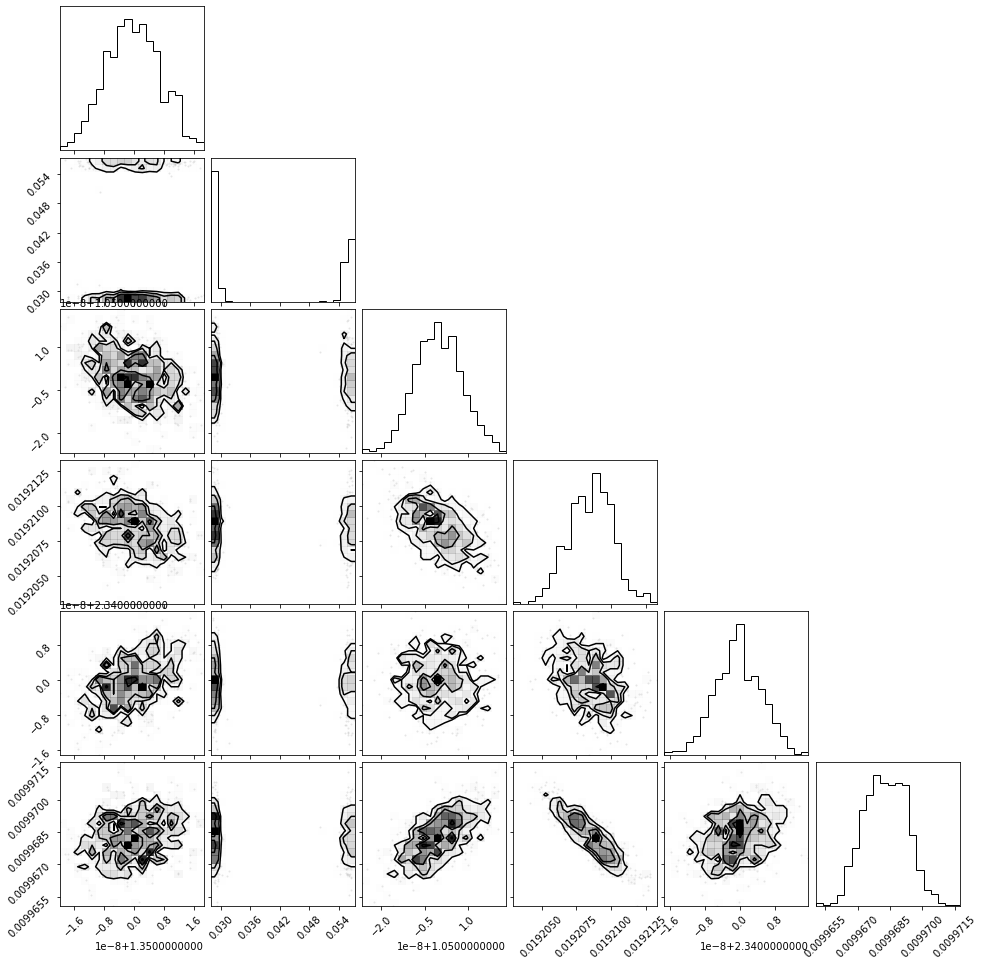

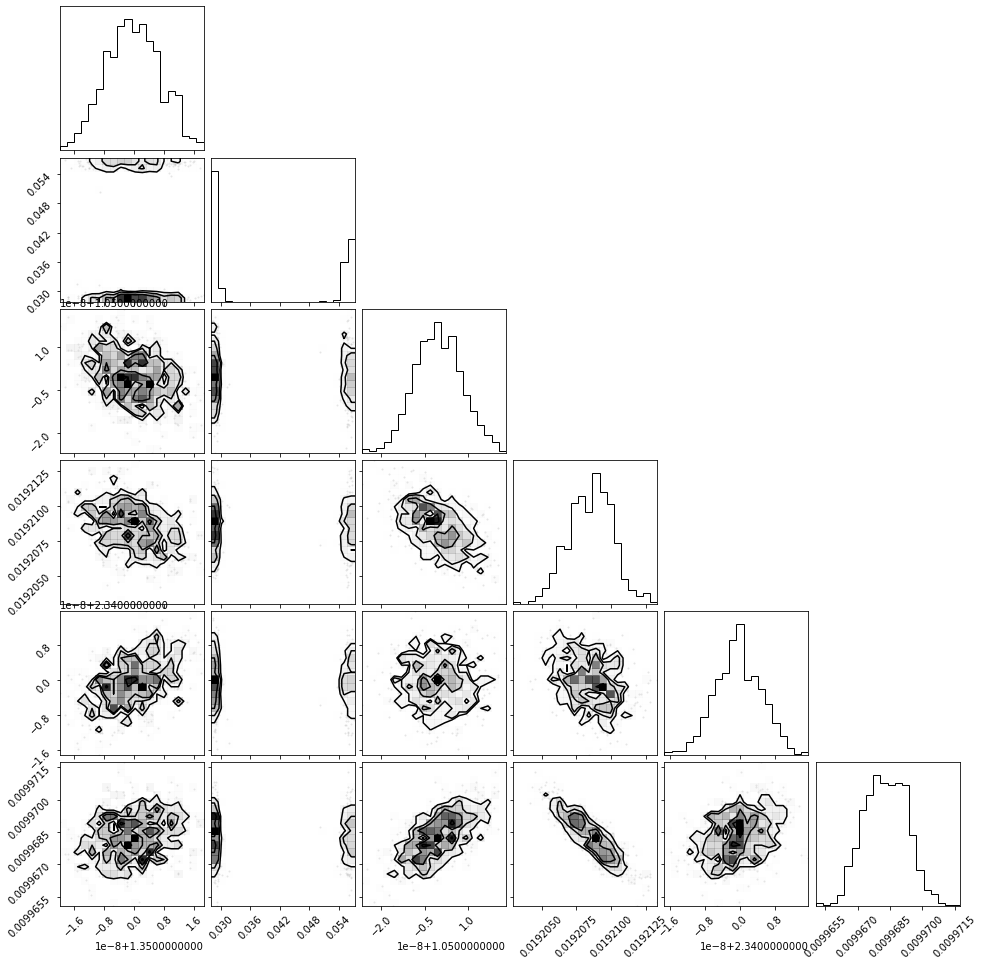

In [41]:
corner.corner(fch)

(500, 6)


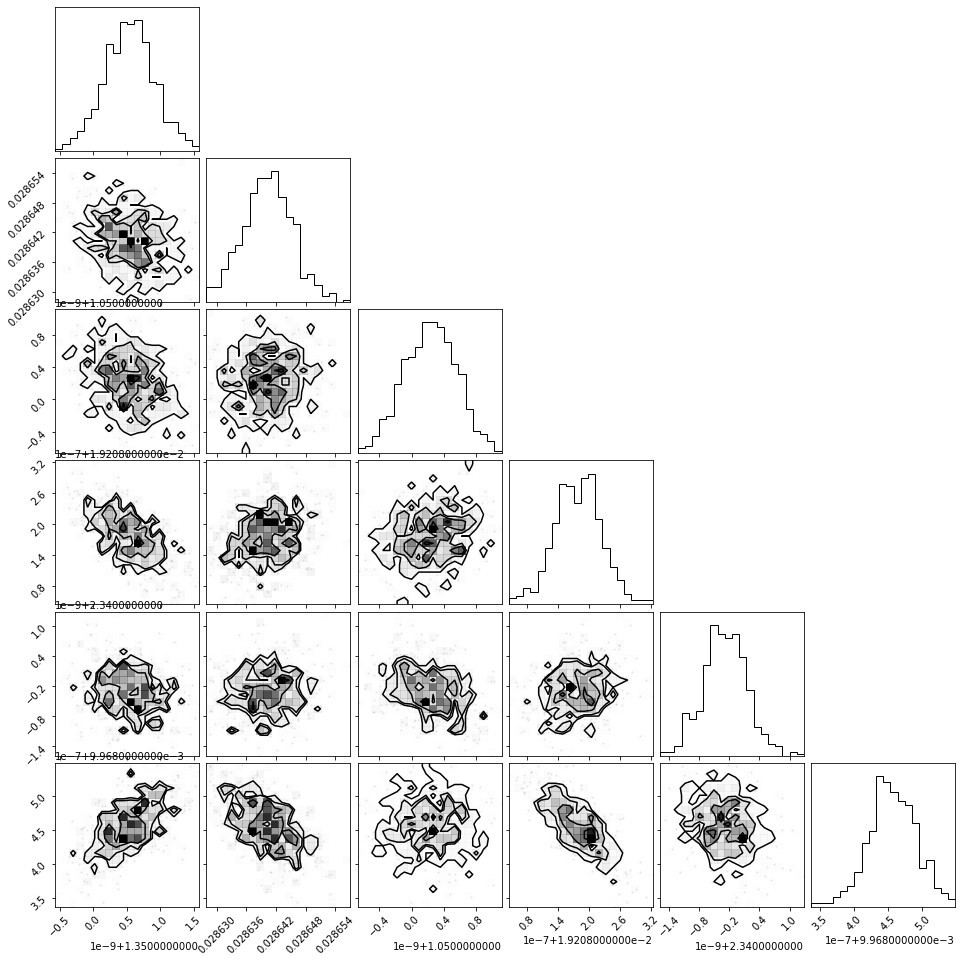

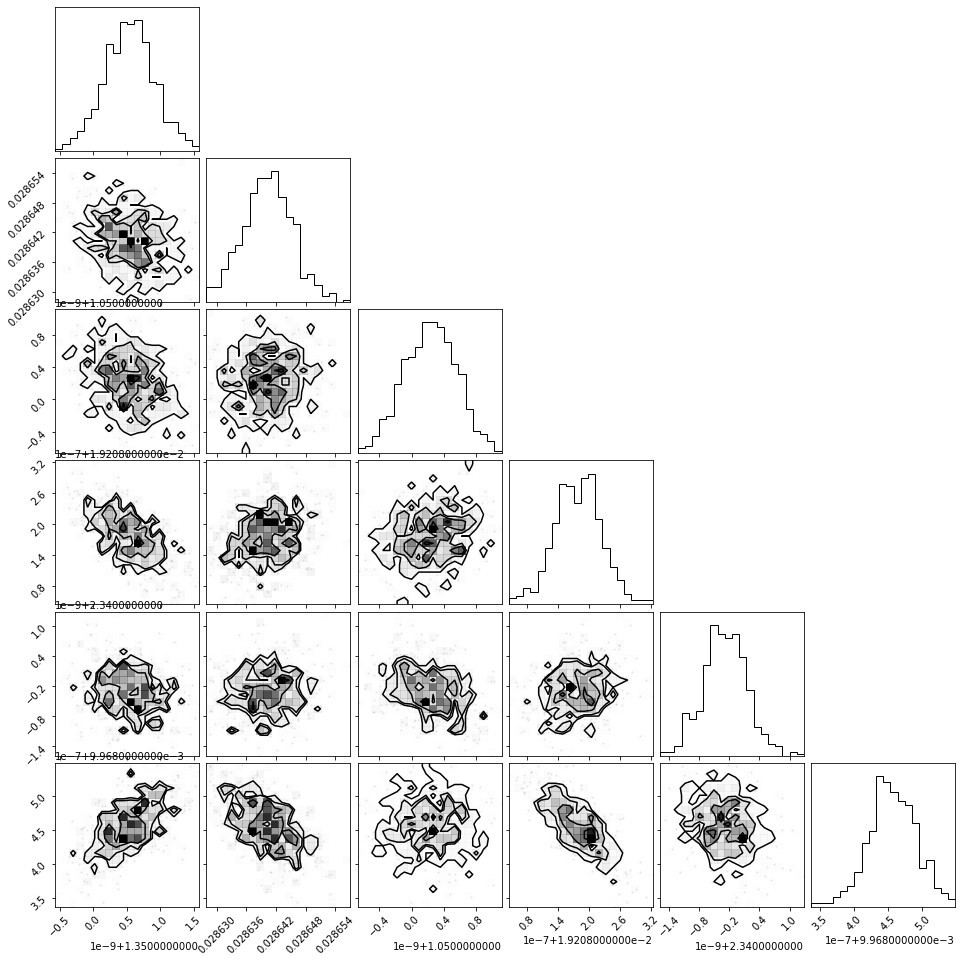

In [39]:
print(fch.shape)
corner.corner(fch)

In [21]:
inds = np.where(samples_test[0][:,1] > 1)[0]
print("N", len(inds))
print(np.mean(samples_test[0][inds,:], 0))
print(samples_test[0][inds,:])

N 1400
[1.35028404e+00 1.63442295e+13 1.04986298e+00 1.64762313e+13
 2.33987159e+00 4.66101861e-02]
[[1.35404947e+00 1.99472400e+05 1.04281670e+00 1.65484094e+05
  2.33083048e+00 5.50686116e-02]
 [1.35204842e+00 1.80272582e+04 1.04808180e+00 1.04775580e+05
  2.34030788e+00 5.73718470e-02]
 [1.35184219e+00 1.21332474e+05 1.05072916e+00 3.67398044e+03
  2.34160186e+00 4.42317941e-02]
 ...
 [1.35583513e+00 6.12031177e+13 1.05449986e+00 1.84709649e+14
  2.33497661e+00 1.90213876e-02]
 [1.34665274e+00 4.45968787e+13 1.04858269e+00 3.56582032e+13
  2.33875408e+00 7.71176205e-02]
 [1.35205051e+00 2.05196644e+13 1.05454612e+00 3.47905248e+13
  2.33943407e+00 7.15922589e-04]]


# Old Code

1.3500006215542428 1.0500007722805056 2.33999690574436
WTF [1.35026503 1.3507071  1.34970011 ... 1.35003263 1.35029448 1.3502111 ] [1.05025888 1.05003235 1.05018698 ... 1.05018285 1.04992381 1.0497427 ]
WTFASDF (10000, 3)
1.3501219253979364 1.049998878725459 2.339887967709155
WTF [1.35983597 1.36999281 1.30246023 ... 1.35839263 1.32758836 1.35099895] [1.04864291 1.04199008 1.05016935 ... 1.0717499  1.05417433 1.03037792]
WTFASDF (100000, 3)
1.35024925472175 1.049453236094642 2.3400262793861435
WTF [1.35001622 1.35038767 1.35067574 ... 1.35102187 1.34984992 1.35068563] [1.04949385 1.04805488 1.05002208 ... 1.04935011 1.04912719 1.0490957 ]


'\ncaxs = []\nrr = 0\nfor v in range(7):\n    if v >= 3 and v <=5:\n        axs.append(fig.add_axes((left_pad, vert_anch[v], 1-(left_pad+right_pad+cbar_pad+cbar_sz), vert_dim)))\n        caxs.append(fig.add_axes((1-(right_pad+cbar_sz), vert_anch[v], cbar_sz, vert_dim)))\n        continue\n    else:\n        axs.append([])\n        for h in range(len(eval_times)):\n            axs[v].append(fig.add_axes((horz_anch[h], vert_anch[v], horz_dim, vert_dim)))\n        #caxs.append(fig.add_axes((horz_anch[cc]+horz_dim+0.1*right_pad, vert_anch[rr], right_pad*0.2, vert_dim)))\n        #rr += 1\n\n\n\nfig = plt.Figure()\nplot3d(samples, ranges)\n'

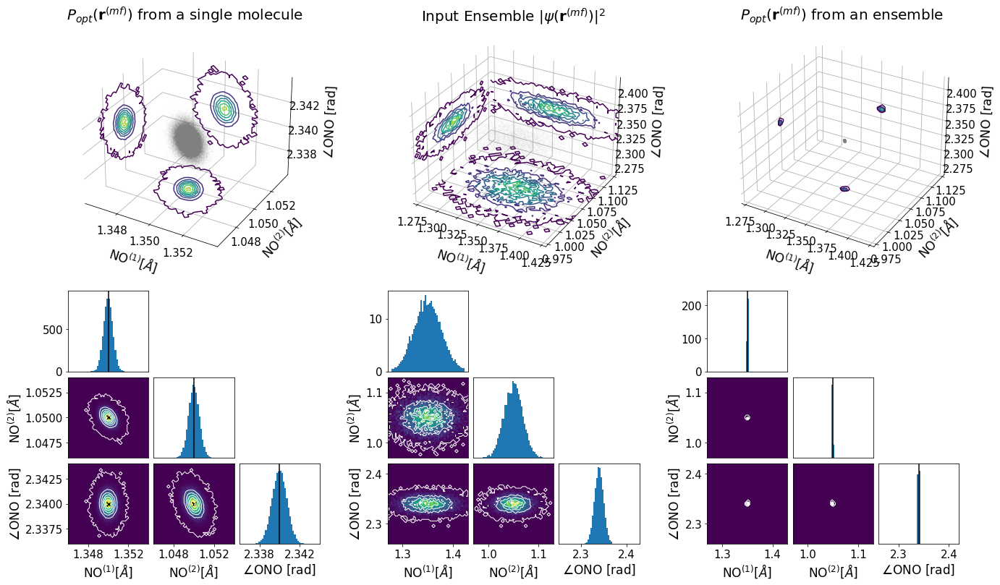

In [17]:
top_pad, bot_pad = 0.04, 0.08
vert_pad, dns_vert = 0.01, 0.4
vert_dim = (1 - (bot_pad + top_pad + 7*vert_pad + dns_vert))/3


left_pad, right_pad, horz_pad = 0.09, 0.055, 0.005
cbar_pad, cbar_sz = 0.01, 0.27
dns_horz, dns_horz_pad = 0.27, 0.045
horz_dim = (1 - (left_pad + right_pad + 32*horz_pad))/9

fig_ratio = vert_dim/horz_dim
fig = plt.figure(figsize=(20,20/fig_ratio))

dns_axs = []
for hh in range(3):
    hz = 0.75*left_pad + hh*(dns_horz + dns_horz_pad)
    vz = 1 - top_pad - dns_vert
    dns_axs.append(fig.add_axes((hz, vz, dns_horz, dns_vert), projection='3d'))

dns_labels = ["$P_{opt} ( \mathbf{r}^{(mf)} )$ from a single molecule", "Input Ensemble $|\psi(\mathbf{r}^{(mf)})|^2$", "$P_{opt} ( \mathbf{r}^{(mf)} )$ from an ensemble"]
for i in range(3):
    rnd_inds = np.random.permutation(samples_response[i].shape[0])[:100000]
    if i == 0:
        plot3d(samples_response[i], ranges_opt, scat_inds=rnd_inds, ax=dns_axs[i],
               labels=labels, label_size=label_size, tick_size=tick_size, alpha=0.2)
    else:
        print("WTFASDF", samples_response[i].shape)
        plot3d(samples_response[i], ranges, scat_inds=rnd_inds, ax=dns_axs[i],
               labels=labels, label_size=label_size, tick_size=tick_size, alpha=0.2)
    
    dns_axs[i].set_title(dns_labels[i], fontsize=20)



vert_anch = []
extra_v = 0
for v in range(3):
    vert_anch.append(bot_pad + v*(vert_dim + vert_pad))
            
horz_anch = [left_pad]

"""
for h in range(3):
    hz = left_pad + h*(dns_horz + dns_horz_pad) + dns_horz/2
    hz -= 1.5*horz_dim + horz_pad
    print(hz)
    for hh in range(3):
        horz_anch.append(hz + hh*(horz_dim + horz_pad))
"""
for h in range(1,9):
    horz_anch.append(horz_anch[-1] + (horz_dim + horz_pad) + 12*int(h%3==0)*horz_pad)

axs = []
for v in range(3):
    axs.append([])
    for h in range(9):
        axs[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], horz_dim, vert_dim)))
        
"""
for i in range(3):
    #cr = corner.corner(np.reshape(samples, (-1, samples[i].shape[-1])))
    axs_cr = cr.axes
    print(len(axs_cr))
    continue
    for v in range(3):
        for h in range(3):
            axs[v][i*3+h]
"""
        
bins = []

for s in range(len(samples_response)):
    bins = []
    
    if s == 0:
        for ir in ranges_opt:
            bins.append(np.linspace(ir[0], ir[1], 51))
    else:
        for ir in ranges:
            bins.append(np.linspace(ir[0], ir[1], 51))
    for h in range(3):
        for v in range(3):
            if h + v == 2:
                n, _, _ = axs[v][s*3+h].hist(samples_response[s][:,-1*v-1], bins=bins[-1*v-1], density=True)
                if s != 1:
                    axs[v][s*3+h].plot([cn[-1*v-1], cn[-1*v-1]], [0,1.25*np.amax(n)], '-k')
                    axs[v][s*3+h].set_xlim([bins[-1*v-1][0], bins[-1*v-1][-1]])
                    axs[v][s*3+h].set_ylim([0, 1.1*np.amax(n)])
            elif h + v > 2:
                axs[v][s*3+h].xaxis.set_visible(False)
                axs[v][s*3+h].yaxis.set_visible(False)
                axs[v][s*3+h].set_visible(False)
            else:
                counts, x, y,image = axs[v][s*3+h].hist2d(samples_response[s][:,h], samples_response[s][:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                axs[v][s*3+h].contour(counts.transpose(), levels=5,
                        extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='w')
                if s != 1:
                    axs[v][s*3+h].scatter(cn[h], cn[-1*v-1], marker='x', color='k')
                        #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)
            
            if v > 0:
                axs[v][s*3+h].xaxis.set_visible(False)
            else:
                axs[v][s*3+h].set_xlabel(labels[h], fontsize=label_size)
                axs[v][s*3+h].tick_params(axis='x', labelsize=tick_size)
                if s == 0:
                    if h == 0:
                        axs[v][s*3+h].set_xticks([1.348, 1.352])
                    elif h == 1:
                        axs[v][s*3+h].set_xticks([1.048, 1.052])
                    else:
                        axs[v][s*3+h].set_xticks([2.338, 2.342])
            if h > 0:
                axs[v][s*3+h].yaxis.set_visible(False)
            elif h < 2 and v < 2:
                axs[v][s*3+h].set_ylabel(labels[-1*v-1], fontsize=label_size)
                axs[v][s*3+h].tick_params(axis='y', labelsize=tick_size)
            if v == 2 and h == 0:
                axs[v][s*3+h].tick_params(axis='y', labelsize=tick_size)
                
fig.savefig("plots/response.png")
#fig.savefig("plots/validation.eps", format="eps")
"""
caxs = []
rr = 0
for v in range(7):
    if v >= 3 and v <=5:
        axs.append(fig.add_axes((left_pad, vert_anch[v], 1-(left_pad+right_pad+cbar_pad+cbar_sz), vert_dim)))
        caxs.append(fig.add_axes((1-(right_pad+cbar_sz), vert_anch[v], cbar_sz, vert_dim)))
        continue
    else:
        axs.append([])
        for h in range(len(eval_times)):
            axs[v].append(fig.add_axes((horz_anch[h], vert_anch[v], horz_dim, vert_dim)))
        #caxs.append(fig.add_axes((horz_anch[cc]+horz_dim+0.1*right_pad, vert_anch[rr], right_pad*0.2, vert_dim)))
        #rr += 1



fig = plt.Figure()
plot3d(samples, ranges)
"""

In [ ]:
def column_compare_dists(samples, ranges, labels, xticks=None, cn=cn):
    Ns = len(samples)
    Ncrn = samples[0].shape[-1]
    do_3d = 1
    if Ncrn == 2:
        do_3d = 0
    if Ncrn == 3:
        top_pad, bot_pad = 0.06*2/Ns, 0.06*2/Ns
    else:
        top_pad, bot_pad = 0.05, 0.15
    
    vert_pad, dns_vert = 0.005, 0.31*2/Ns
    vert_dim = (1 - (bot_pad + top_pad + (8*(Ns-1)+(Ncrn+1))*vert_pad + do_3d*Ns*dns_vert*0.85))/Ncrn

    left_pad, right_pad, horz_pad = 0.24, 0.06, 0.015
    cbar_pad, cbar_sz = 0.01, 0.27
    dns_horz, dns_horz_pad = 0.27, 0.045
    horz_dim = (1 - (left_pad + right_pad + 3*horz_pad))/Ncrn

    dns_labels = ["$P_{opt} ( \mathbf{r}^{(mf)} )$ from a single molecule", "Input Ensemble $|\psi(\mathbf{r}^{(mf)})|^2$", "$P_{opt} ( \mathbf{r}^{(mf)} )$ from an ensemble"]
    fig_ratio = vert_dim/horz_dim
    sz=6
    fig = plt.figure(figsize=(sz,sz/fig_ratio))

    axs = []
    vert = bot_pad
    for v in range(Ncrn+Ns):
        if v < Ncrn:
            print("IN CRN")
            axs.append([])
            horz = left_pad
            for h in range(Ncrn):
                axs[-1].append(fig.add_axes((horz, vert, horz_dim, vert_dim)))
                horz += horz_dim + horz_pad
            vert += vert_dim + vert_pad
        elif do_3d:
            print("in 3d", vert)
            if v == Ncrn and Ns > 1:
                print("WWWWWWTTTTTTTTTFFFFFFFF")
                vert += 8*vert_pad
            axs.append(fig.add_axes(
                (0.5*left_pad, vert, 1-(left_pad+right_pad), dns_vert), projection='3d'))
            vert += dns_vert

    bins = []
    for ir in ranges:
        bins.append(np.linspace(ir[0], ir[1], 51))
    for v in range(Ncrn+Ns):
        if v < Ncrn:
            for h in range(Ncrn):
                if h + v == Ncrn-1:
                    print("BINS", bins[-1*v-1][0], bins[-1*v-1][-1])
                    n, _, _ = axs[v][h].hist(samples[0][:,-1*v-1], bins=bins[-1*v-1], density=True)
                    if Ns > 1:
                        nn, _ = np.histogram(samples[1][:,-1*v-1], bins=bins[-1*v-1], density=True)
                        axs[v][h].plot((bins[-1*v-1][1:]+bins[-1*v-1][:-1])/2, nn, '--k')
                    axs[v][h].plot([cn[-1*v-1], cn[-1*v-1]], [0,1.25*np.amax(n)], '-k')
                    axs[v][h].set_xlim([bins[-1*v-1][0], bins[-1*v-1][-1]])
                    axs[v][h].set_ylim([0, 1.1*np.amax(n)])
                elif h + v > Ncrn-1:
                    axs[v][h].xaxis.set_visible(False)
                    axs[v][h].yaxis.set_visible(False)
                    axs[v][h].set_visible(False)
                else:
                    counts, x, y,image = axs[v][h].hist2d(samples[0][:,h], samples[0][:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                    if Ns > 1:
                        counts, x, y = np.histogram2d(samples[1][:,h], samples[1][:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                        axs[v][h].contour(counts.transpose(), levels=5,
                                extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='w')
                    axs[v][h].scatter(cn[h], cn[-1*v-1], marker='x', color='k')
                            #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)

                if v > 0:
                    axs[v][h].xaxis.set_visible(False)
                else:
                    axs[v][h].set_xlabel(labels[h], fontsize=label_size)
                    axs[v][h].tick_params(axis='x', labelsize=tick_size)
                    if xticks is not None:
                        if xticks[h] is not None:
                            axs[v][h].set_xticks(xticks[h])

                if h > 0:
                    axs[v][h].yaxis.set_visible(False)
                elif h < Ncrn-1 and v < Ncrn-1:
                    axs[v][h].set_ylabel(labels[-1*v-1], fontsize=label_size)
                    axs[v][h].tick_params(axis='y', labelsize=tick_size)
                if v == Ncrn-1 and h == 0:
                    axs[v][h].tick_params(axis='y', labelsize=tick_size)      
        elif do_3d:
            rnd_inds = np.random.permutation(samples[-1-(v-Ncrn)].shape[0])[:100000]
            plot3d(samples[-1-(v-Ncrn)], ranges, scat_inds=rnd_inds, ax=axs[v],
                   labels=labels, label_size=label_size, tick_size=tick_size, alpha=0.2)
    return fig, axs

In [ ]:
fig, axs = column_compare_dists([samples_response[0], samples_response[2]], ranges_opt, labels,
    xticks=[[1.348, 1.352], [1.048, 1.052], [2.338, 2.342]])
fig.savefig("plots/response.png")

In [ ]:
sig_sum, counts = 0,0
print(cn)
for s, ss in zip(samples_q, samples_q_single):
    sig_diffs = np.abs(np.mean(s, 0)-cn)/np.std(s, 0)
    print("{} +/- {} | Scale {}".format(np.mean(s, 0), np.std(s, 0), sig_diffs))
    print("{} +/- {}".format(np.mean(ss, 0), np.std(ss, 0)))
    sig_sum += np.sum(sig_diffs)
    counts += len(sig_diffs)

sig_avg = sig_sum/counts
print("Sigma info: {} {}".format(sig_avg, 1./sig_avg))
print(sig_avg*0.075)

q_labels = [r"q$_{max}$ = 5", r"q$_{max}$ = 7.5", r"q$_{max}$ = 15", r"q$_{max}$ = 20", r"q$_{max}$ = 40", r"q$_{max}$ = 50"]
    
Nbins = 100
bins = [np.linspace(ranges_opt[0][0], ranges_opt[0][1], Nbins), np.linspace(ranges_opt[1][0], ranges_opt[1][1], Nbins), np.linspace(ranges_opt[2][0], ranges_opt[2][1], Nbins)]
fig = plot_2dRows([samples_q[0], samples_q[1], samples_q[3]], [samples_q_single[0], samples_q_single[1], samples_q_single[3]],
    labels, bins=bins, row_labels=q_labels, row_label_size=22, label_size=17, tick_size=15,
    xticks=[[1.048, 1.052], [1.348, 1.352], [2.338, 2.342]])
fig.savefig("plots/compare_qeffects.png")

In [ ]:
bp, tp, lp = 0.1, 0.05, 0.03

N = len(samples_q)
hpSep = 0.01
vpSep = 0.01
VSEP = 0.06
proj_w = 0.3

vdim = (1.- (6*vpSep+VSEP+bp))/7
hdim = ((1./N-lp) - (2*hpSep+lp))/3.

fig = plt.figure(figsize=(20,20/(vdim/hdim)))

for i in range(len(samples_q)):
    dims = (vdim, vpSep, VSEP, hdim, hpSep, bp, lp+i*1./N)
    plot_2dproj_column(fig, dims, theta_gauss=samples_q[i], theta_delta=None)#samples_q_delta[i])

In [ ]:
def plot_2dproj_column_cont(fig, dims, theta_gauss=None, theta_delta=None):   
    vdim, vpSep, VSEP, hdim, hpSep, bp, lp = dims
    
    # Bottom Portion
    vert_anch = []
    extra_v = 0
    for v in range(3):
        vert_anch.append(bp + v*(vdim + vpSep))

    horz_anch = [lp]
    for h in range(2):
        horz_anch.append(horz_anch[-1] + (hdim + hpSep))

    axs0 = []
    for v in range(3):
        axs0.append([])
        for h in range(3):
            axs0[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], hdim, vdim)))

    samples = [theta_gauss]
    if theta_delta is not None:
        samples.append(theta_delta)
    if theta_gauss is None:
        samples = [theta_delta]
    if theta_gauss is None and theta_delta is None:
        raise ValueError("Must specify either theta_gauss or theta_delta")
    for s, sr in enumerate(samples):
        if s == 0 and theta_gauss is not None:
            sr = sr[:,np.array([0,2,4])]
        
        if sr is None:
            continue
            
        bins = []
        for ir in ranges_theta:
            bins.append(np.linspace(ir[0], ir[1], 51))
        for h in range(3):
            for v in range(3):
                if h + v == 2:
                    n, x = np.histogram(sr[:,-1*v-1], bins=bins[-1*v-1])
                    n = n/np.amax(n)
                    if s == 0:
                        axs0[v][h].bar((x[1:]+x[:-1])/2., n, width=x[1]-x[0], align='center')
                    else:
                        axs0[v][h].plot((x[1:]+x[:-1])/2., n, '--k')

                    axs0[v][h].plot([cn[-1*v-1], cn[-1*v-1]], [0,1.1], '-k')
                    axs0[v][h].set_xlim([bins[-1*v-1][0], bins[-1*v-1][-1]])
                    axs0[v][h].set_ylim([0, 1.1*np.amax(n)])
                        
                elif h + v > 2:
                    axs0[v][h].xaxis.set_visible(False)
                    axs0[v][h].yaxis.set_visible(False)
                    axs0[v][h].set_visible(False)
                else:
                    if s == 0:
                        counts, x, y,image = axs0[v][h].hist2d(sr[:,h], sr[:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                    else:
                        counts, x, y = np.histogram2d(sr[:,h], sr[:,-1*v-1], bins=(bins[h], bins[-1*v-1]))
                        axs0[v][h].contour(counts.transpose(), levels=5,
                                extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='w')
                    axs0[v][h].scatter(cn[h], cn[-1*v-1], marker='x', color='k')
                        #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)

                if v > 0:
                    axs0[v][h].xaxis.set_visible(False)
                else:
                    axs0[v][h].set_xlabel(labels[h], fontsize=label_size)
                    axs0[v][h].tick_params(axis='x', labelsize=tick_size)
                    if s == 0:
                        if h == 0:
                            axs0[v][h].set_xticks([1.349, 1.351])
                        elif h == 1:
                            axs0[v][h].set_xticks([1.049, 1.051])
                        else:
                            axs0[v][h].set_xticks([2.339, 2.341])
                if h > 0 or v == 2:
                    axs0[v][h].yaxis.set_visible(False)
                elif h < 2 and v < 2:
                    axs0[v][h].set_ylabel(labels[-1*v-1], fontsize=label_size)
                    axs0[v][h].tick_params(axis='y', labelsize=tick_size)
                if v == 2 and h == 0:
                    axs0[v][h].tick_params(axis='y', labelsize=tick_size)
    
    # Top Portion
    if theta_gauss is not None:
        vert_anch = []
        extra_v = 0
        for v in range(6):
            vert_anch.append(bp + VSEP + (v+1)*(vdim + vpSep))

        horz_anch = [lp]
        for h in range(2):
            horz_anch.append(horz_anch[-1] + (hdim + hpSep))

        axs1 = []
        for v in range(6):
            axs1.append([])
            for h in range(3):
                axs1[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], hdim, vdim)))

        sr = theta_gauss

        bins = []
        rg_inds = np.array([1,3,5,0,2,4])
        for ir in ranges_gauss:
            bins.append(np.linspace(ir[0], ir[1], 51))
        for h in range(3):
            for v in range(6):
                if h + v == 2:
                    n, _, _ = axs1[v][h].hist(sr[:,rg_inds[h]], bins=bins[rg_inds[h]], density=True)
                    axs1[v][h].plot([cn_gauss[rg_inds[h]], cn_gauss[rg_inds[h]]], [0,1.25*np.amax(n)], '-k')
                    axs1[v][h].set_xlim([bins[rg_inds[h]][0], bins[rg_inds[h]][-1]])
                    axs1[v][h].set_ylim([0, 1.1*np.amax(n)])
                elif h + v < 2:
                    axs1[v][h].xaxis.set_visible(False)
                    axs1[v][h].yaxis.set_visible(False)
                    axs1[v][h].set_visible(False)
                else:
                    if v < 3:
                        vv = 2 - v
                    else: 
                        vv = v
                    counts, x, y,image = axs1[v][h].hist2d(sr[:,rg_inds[h]], sr[:,rg_inds[vv]], bins=(bins[rg_inds[h]], bins[rg_inds[vv]]))
                    axs1[v][h].scatter(cn_gauss[rg_inds[h]], cn_gauss[rg_inds[vv]], marker='x', color='k')
                            #extent=[bins[-1*v-1].min(),bins[-1*v-1].max(),bins[h].min(),bins[h].max()],linewidths=1)

                if v != 5:
                    axs1[v][h].xaxis.set_visible(False)
                else:
                    axs1[v][h].xaxis.tick_top()
                    axs1[v][h].xaxis.set_label_position('top')
                    axs1[v][h].set_xlabel(labels_sig[h], fontsize=label_size)
                    axs1[v][h].tick_params(axis='x', labelsize=tick_size)

                if h < 2 or v == 0:
                    axs1[v][h].yaxis.set_visible(False)
                elif v > 0:
                    if v < 3:
                        vv = 2 - v
                    else: 
                        vv = v
                    axs1[v][h].yaxis.tick_right()
                    axs1[v][h].yaxis.set_label_position('right')
                    if v > 2:
                        lb = labels[v-3]
                    else:
                        lb = labels_sig[vv]
                    axs1[v][h].set_ylabel(lb, fontsize=label_size)
                    axs1[v][h].tick_params(axis='y', labelsize=tick_size)
                if v == 2 and h == 0:
                    axs1[v][h].tick_params(axis='y', labelsize=tick_size)

In [ ]:
def plot_2dRows(samples, samples_single, labels,
        label_size=15, tick_size=13, bins=np.ones(3)*50,
        row_labels=None, row_label_size=15, xticks=None):
    Nrows = len(samples)

    top_pad = 0.025
    bot_pad = 0.065
    vert_pad = 0.03*4/Nrows
    hist_size = 0.0#5
    vert_dim = (1 - (bot_pad + top_pad + Nrows*(vert_pad + hist_size)-vert_pad))/Nrows


    horz_pad = 0.11
    left_pad = 0.115
    right_pad = 0.035
    cbar_pad = 0.01
    cbar_sz = 0.035
    horz_dim = (1 - (left_pad + right_pad + 2*horz_pad))/3

    print(vert_dim, horz_dim)
    fig_ratio = vert_dim/horz_dim
    fig = plt.figure(figsize=(10,10/fig_ratio))


    vert_anch = []
    for v in range(Nrows):
        vert_anch.append(bot_pad + v*(vert_dim + hist_size + vert_pad))

    horz_anch = []
    for h in range(3):
        horz_anch.append(left_pad + h*(horz_dim + horz_pad))

    axs, axs_hists = [], []
    for v in range(Nrows):
        axs.append([])
        axs_hists.append([])
        for h in range(3):
            axs[-1].append(fig.add_axes((horz_anch[h], vert_anch[v], horz_dim, vert_dim)))
            #axs_hists[-1].append(fig.add_axes((horz_anch[h], vert_anch[v]+vert_dim, horz_dim, hist_size)))


    inds = [[1,0], [0,2], [2,1]]


    for h in range(3):
        for v in range(Nrows):
            counts, x, y,image = axs[v][h].hist2d(samples_single[v][:,inds[h][0]], samples_single[v][:,inds[h][1]], bins=(bins[inds[h][0]], bins[inds[h][1]]))
            counts, x, y = np.histogram2d(samples[v][:,inds[h][0]], samples[v][:,inds[h][1]], bins=(bins[inds[h][0]], bins[inds[h][1]]))
            axs[v][h].contour(counts.transpose(), levels=6,
                    extent=[x.min(),x.max(),y.min(),y.max()],linewidths=1, colors='lightgray')
            axs[v][h].scatter(cn[inds[h][0]], cn[inds[h][1]], marker='x', color='k')
            #axs_hists[v][h].hist(samples[v][:,inds[h][0]], bins=bins[inds[h][0]])
            #axs_hists[v][h].set_xlim([bins[inds[h][0]][0], bins[inds[h][0]][-1]])
            #if h + v == 2:
            #    axs[v][s*3+h].hist(samples[s][:,-1*v-1], bins=bins[-1*v-1], density=True)
            axs[v][h].set_xlabel(labels[inds[h][0]], fontsize=label_size)
            axs[v][h].set_ylabel(labels[inds[h][1]], fontsize=label_size)
            axs[v][h].tick_params(axis='x', labelsize=tick_size)
            axs[v][h].tick_params(axis='y', labelsize=tick_size)
            
            if v > 0:
                axs[v][h].xaxis.set_visible(False)
            #axs_hists[v][h].xaxis.set_visible(False)
            #axs_hists[v][h].yaxis.set_visible(False)
            else:
                if xticks is not None:
                    if xticks[h] is not None:
                        axs[v][h].set_xticks(xticks[h])
            
            if h == 2 and row_labels is not None:
                axs[v][h].text(1.1, 0.5, row_labels[v], fontsize=row_label_size,
                        transform=axs[v][h].transAxes, rotation='vertical',
                        horizontalalignment="center", verticalalignment="center") 

    return fig